# Language families by clustering

## Load data

In [1]:
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
from collections import defaultdict
import seaborn as sns
sns.set_context('paper', font_scale=1.5)

heatmap_cmap = 'GnBu'

import scipy
from scipy.stats import ttest_rel, beta, ttest_ind
from sklearn.cluster import KMeans
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.svm import SVR
from sklearn.model_selection import cross_val_score
import numpy as np
import os
import yaml
import shutil
from collections import OrderedDict

from utils import quick_load_experiments_tsv, get_significance_by_column, add_probing_location_better_column
from common import lang2code, code2lang, lang2family, family2langs, lang2large_family

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

figure_dir = "fig/typology"
os.makedirs("fig", exist_ok=True)
os.makedirs(figure_dir, exist_ok=True)

np.random.seed(2)

%load_ext autoreload
%autoreload 2

%matplotlib inline

In [2]:
exps = pd.read_table("../dataframes/all_experiments.tsv", sep="\t", quoting=3)
exps['tag'] = exps['task'].apply(lambda t: t.split("_")[0])
exps['pos'] = exps['task'].apply(lambda t: t.split("_")[1])
exps['full_task'] = exps['language'] + ' ' + exps['task']
exps['family'] = exps['language'].apply(lambda l: lang2family[l])

exps = add_probing_location_better_column(exps)

In [3]:
bertexps = exps[
    (exps.model=='mBERT') &
    (exps.probing_location_better==True)
]
bertexps.perturbation.unique()
#bertexps = bertexps[bertexps.perturbation.isna()]
#bertexps = bertexps[['pos','tag']]
#bertexps = bertexps.groupby(['pos', 'tag'], dropna=False).size()
#bertexps

array(['B$_2$', 'L$_2$', 'R$_2$', 'TARG', 'mBERT-char', 'mBERT-emb',
       'mBERT-nocontext', 'mBERT-rand-char', 'mBERT-rand-subw', 'next',
       'permute', 'prev', nan], dtype=object)

In [4]:
fertility = pd.read_table("../dataframes/task_fertility.tsv")
old_len = len(exps)

exps = exps.merge(fertility, on=['language', 'task'], how='inner')

if old_len != len(exps):
    raise ValueError(f"Merging with fertility dataframe changed the number of rows: {old_len} --> {len(exps)}")

In [5]:
data_perturbations = ['TARG', 'L$_2$', 'R$_2$', 'B$_2$', 'permute']
model_perturbations = [
    'mBERT-char',
    'mBERT-rand-subw', 
    'mBERT-rand-char',
    'mBERT-emb',
    'mBERT-nocontext',
    'prev',
    'next'
]
baseline_models = ['chLSTM', 'chLSTM-rand', 'swLSTM', 'fastText']

In [6]:
bert_exps = exps[
    (exps.model=='mBERT') &
    (exps.probing_location_better==True)
]

bert_exps.shape

(4147, 24)

In [7]:
bert_exps.groupby(['language', 'task', 'perturbation'], dropna=False).size().value_counts()
unperturbed = bert_exps[bert_exps.perturbation.isnull()]
unperturbed = unperturbed.set_index(['language', 'task']).test_acc
perturbed = bert_exps[bert_exps.perturbation.isin(model_perturbations + data_perturbations)].pivot_table(
    index=['language', 'task'], columns='perturbation', values='test_acc'
)
test_effect = 100 * (1 - perturbed / unperturbed.values[:, None])
test_effect.mean()

perturbation
B$_2$               3.967901
L$_2$               1.745740
R$_2$               1.104947
TARG               17.257624
mBERT-char          8.630957
mBERT-emb          11.805716
mBERT-nocontext     6.910925
mBERT-rand-char    39.762621
mBERT-rand-subw    38.198294
next               12.598941
permute             5.516028
prev                8.537573
dtype: float64

## Common tools

In [8]:
def calculate_acc_score(coc):
    score = 0
    for l1 in coc:
        for l2 in coc[l1]:
            family1 = lang2large_family[l1]
            family2 = lang2large_family[l2]
            if family1 == 'Isolate' or family2 == 'Isolate' or l1 == l2:
                continue
            if family1 == family2:
                score += coc[l1][l2] / 100
                
            else:
                score -= coc[l1][l2] / 516.4835 #to make sure ranges are symmetric
    return ((score + 182) / (182 + 182))*2 -1 #-940 is min, 216 is max, normalization :(xi-min(x)) / (max(x)-min(x))

In [9]:
perfect_cooc = defaultdict(lambda: defaultdict(int))
for l1 in lang_order["language"]:
    perfect_cooc[l1] = defaultdict(lambda:defaultdict(int))
    for l2 in lang_order["language"]:
        perfect_cooc[l1][l2] = 100 if lang2large_family[l1] == lang2large_family[l2] else 0
print(calculate_acc_score(perfect_cooc))

NameError: name 'lang_order' is not defined

In [10]:
perfect_cooc2 = defaultdict(lambda: defaultdict(int))
for l1 in lang_order["language"]:
    perfect_cooc2[l1] = defaultdict(lambda:defaultdict(int))
    for l2 in lang_order["language"]:
        perfect_cooc2[l1][l2] = 100 if l1 == l2 else 0
print(calculate_acc_score(perfect_cooc2))

NameError: name 'lang_order' is not defined

In [11]:
X

NameError: name 'X' is not defined

In [12]:
anti_cooc = defaultdict(lambda: defaultdict(int))
for l1 in lang_order["language"]:
    anti_cooc[l1] = defaultdict(lambda:defaultdict(int))
    for l2 in lang_order["language"]:
        anti_cooc[l1][l2] = 0 if lang2large_family[l1] == lang2large_family[l2] else 100
print(calculate_acc_score(anti_cooc))

NameError: name 'lang_order' is not defined

In [13]:
l = exps[['family', 'language']].drop_duplicates().sort_values(['family', 'language'])
l['code'] = l.language.apply(lambda l: lang2code[l])
e = exps[['language']].drop_duplicates()
e['family'] = e['language'].apply(lambda l: lang2large_family[l])
family_size = e.family.value_counts().sort_index()

In [14]:
def increase_cooc(langs):
    for l1 in langs:
        for l2 in langs:
            cooc[l1][l2] += 1

In [15]:
#plotting
ticklabels = []
ticklocs = []
lang_family = exps[['language']].drop_duplicates()
lang_family['family'] = lang_family['language'].apply(lambda l: lang2large_family[l])
lang_family['code'] = lang_family['language'].apply(lambda l: lang2code[l])
family_size = lang_family.family.value_counts().sort_index()

for fi, (family, size) in enumerate(family_size.items()):
    if size > 1:
        ticklabels.append(family)
        start = family_size.iloc[:fi].sum()
        if fi < len(e) - 1:
            end = family_size.iloc[:fi+1].sum()
        else:
            end = family_size.sum()
        loc = (start+end) / 2
        ticklocs.append(loc)
        
lang_order = lang_family.sort_values(['family', 'code'])

In [16]:
def reduce_columns_old(test_f, num_of_cols):
    
    Y = pd.DataFrame(test_f.pivot_table(index='language', columns='task').to_records())
    for col in Y:
        if Y[col].count() < limit:
                Y = Y.drop(col, axis=1)
    Y = Y.fillna(Y.mean())
    return Y.pivot_table(index='language')

In [17]:
def reduce_columns(test_f, num_of_cols):
    Y = pd.DataFrame(test_f.pivot_table(index='language', columns='task').to_records())
    deletion = pd.DataFrame(columns=['attribute','missing'])
    for col in Y:
        deletion = deletion.append({'attribute' : col, 'missing' : Y[col].count()}, ignore_index=True)
    deletion['missing'] = pd.to_numeric(deletion['missing'])
    for i in range(num_of_cols):
        #print(deletion['missing'].min())
        idxmin = deletion['missing'].idxmin()
        columns = deletion[deletion.missing == deletion.missing.min()]
        columns = columns.iloc[0]
        Y = Y.drop(columns=columns['attribute'])
        deletion = deletion.drop(idxmin)
    Y2 = Y.drop(['language'], axis=1)
    purity = Y2.isna().sum().sum() / (Y2.shape[0]*Y2.shape[1])
    Y = Y.fillna(Y.mean())
    return Y.pivot_table(index='language'), 1-purity
xd, pur = reduce_columns(test_effect, 490)
print(pur)
xd

0.8461538461538461


,"('permute', 'number_noun')","('prev', 'number_noun')"
language,,
Afrikaans,0.527704,3.430079
Albanian,4.270270,6.378378
Arabic,3.364160,3.340437
Armenian,3.364160,3.340437
Basque,2.920498,3.082747
Bulgarian,3.364160,3.340437
Catalan,-0.101010,2.070707
Croatian,9.225092,4.744333
Czech,8.725910,2.248394


In [94]:
#Y = pd.DataFrame(test_effect.pivot_table(index='language', columns='task').to_records())
#Y2 = Y.drop(columns='language', axis=1)
purity = Y2.notnull().sum().sum() / (Y2.shape[0]*Y2.shape[1])
purity

0.19949968730456535

In [18]:
def reduce_columns_randomly(test_f, num_of_cols):
    Y = pd.DataFrame(test_f.pivot_table(index='language', columns='task').to_records())
    deleting = Y.sample(n=num_of_cols, axis='columns')
    language_is_deleted = False
    if 'language' in deleting.columns:
        language_is_deleted = True
        deleting = deleting.drop(['language'], axis=1)  
    Y.drop(deleting.columns, axis='columns', inplace=True)
    
    
    while(language_is_deleted):
        deleting = Y.sample(n=1, axis='columns')
        if not 'language' in deleting.columns:
            language_is_deleted = False
            Y.drop(deleting.columns, axis='columns', inplace=True)

        
    Y2 = Y.drop(['language'], axis=1)
    purity = Y2.isna().sum().sum() / (Y2.shape[0]*Y2.shape[1])
    Y = Y.fillna(Y.mean())
    return Y.pivot_table(index='language'), 1-purity
xd, pur = reduce_columns_randomly(test_effect, 490)
print(pur)
xd

0.02564102564102566


,"('L$_2$', 'person[psor]_noun')","('mBERT-char', 'animacy_verb')"
language,,
Afrikaans,-0.531915,1.83727
Albanian,-0.531915,1.83727
Arabic,-0.531915,1.83727
Armenian,-0.531915,1.83727
Basque,-0.531915,1.83727
Bulgarian,-0.531915,1.83727
Catalan,-0.531915,1.83727
Croatian,-0.531915,1.83727
Czech,-0.531915,1.83727


In [19]:
XD = reduce_columns(test_effect, 480)
def calculate_purity_for(test_f):
    Y = pd.DataFrame(test_f.pivot_table(index='language', columns='task').to_records())
    return Y.isna().sum().sum() / (Y.shape[0]*Y.shape[1])
print(calculate_purity_for(XD))

AttributeError: 'tuple' object has no attribute 'pivot_table'

## Baseline - k means clustering without dim reduction


In [20]:
def do_cluster(K):
    #d = unfiltered['test_effect'][keep_perturbations]
    X = test_effect.pivot_table(index='language', columns='task')
    X = X.fillna(X.mean())
    k = KMeans(n_clusters=K)
    k.fit(X)
    clusters = [[] for _ in range(K)]
    for i, lab in enumerate(k.labels_):
        clusters[lab].append(X.index[i])
    print(f"K = {K}")
    print("\n------\n".join(", ".join(cl) for cl in clusters))
    
do_cluster(4)

K = 4
Basque, Croatian, Estonian, Turkish
------
Afrikaans, Albanian, Armenian, Bulgarian, Catalan, Czech, Dutch, French, German, Greek, Hebrew, Hindi, Hungarian, Latin, Lithuanian, Persian, Polish, Portuguese, Romanian, Slovak, Spanish, Swedish, Ukrainian, Urdu
------
Arabic, Danish, English, Finnish, Italian, Latvian, Norwegian_Bokmal, Norwegian_Nynorsk, Serbian, Slovenian
------
Russian


In [21]:
cooc = defaultdict(lambda: defaultdict(int))
for _ in range(100):
    K = np.random.randint(3, 9)
    X = test_effect.pivot_table(index='language', columns='task')[model_perturbations + data_perturbations]
    X = X.fillna(X.mean())
    k = KMeans(n_clusters=K)
    k.fit(X)
    cl = pd.DataFrame({'language': X.index, 'cluster':k.labels_})
    cl.groupby('cluster').language.apply(increase_cooc)
print(calculate_acc_score(cooc))

0.052720117640003616


In [22]:
cooc

defaultdict(<function __main__.<lambda>()>,
            {'Danish': defaultdict(int,
                         {'Danish': 100,
                          'English': 60,
                          'Norwegian_Bokmal': 95,
                          'Norwegian_Nynorsk': 97,
                          'Czech': 45,
                          'Hebrew': 77,
                          'Slovenian': 86,
                          'Afrikaans': 77,
                          'Arabic': 51,
                          'German': 34,
                          'Hindi': 72,
                          'Italian': 47,
                          'Latvian': 32,
                          'Russian': 39,
                          'Serbian': 64,
                          'Croatian': 52,
                          'Albanian': 36,
                          'Armenian': 57,
                          'Bulgarian': 42,
                          'Catalan': 37,
                          'Dutch': 42,
                          'Greek': 4

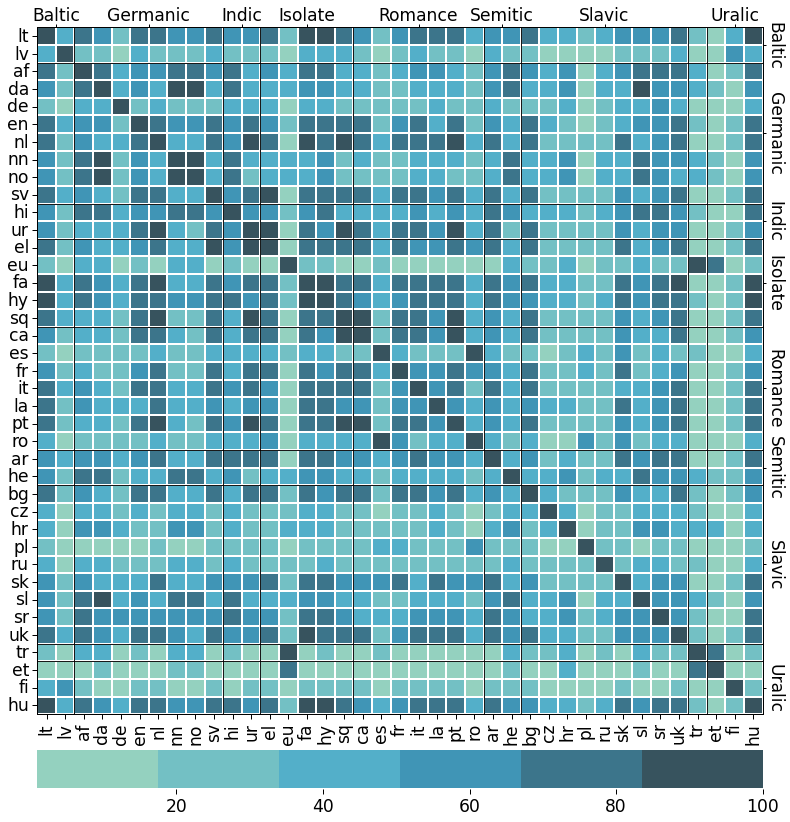

In [23]:
with sns.plotting_context('paper', font_scale=1.95):
    grid_kws = {"height_ratios": (.9, .05), "hspace": .1}

    fig, (ax, cbar_ax) = plt.subplots(2, gridspec_kw=grid_kws, figsize=(13, 14))
    data = pd.DataFrame(cooc).loc[lang_order.language][lang_order.language]
    data.columns = [lang2code[c] for c in data.columns]
    data.index = [lang2code[c] for c in data.index]
    sns.set_palette(sns.color_palette("GnBu_d"))
    sns.heatmap(data, ax=ax, cmap=sns.color_palette("GnBu_d"), cbar_ax=cbar_ax, cbar_kws={"orientation": "horizontal"}, linewidths=.1)
    for f in np.cumsum(family_size)[:-1]:
        ax.plot((f, f), (0, data.shape[0]), c='black', linewidth=.9)
        ax.plot((0, data.shape[1]), (f, f), c='black', linewidth=.9)
    for _, spine in ax.spines.items():
        spine.set_visible(True)
    ax.set_xlabel("")
    ax.set_ylabel("")
    
    ax2 = ax.twiny()
    ax2.set_xticks(ticklocs)
    ax2.set_xticklabels(ticklabels)
    ax2.tick_params(axis='x', which='major', pad=0, length=3)
    ax2.xaxis.set_ticks_position('top')
    ax2.set_xlim(ax.get_xlim())
    
    ax3 = ax.twinx()
    ax3.set_yticks(ticklocs)
    ax3.set_yticklabels(ticklabels, va='center')
    ax3.tick_params(axis='y', rotation=-90, which='major', pad=0, length=3)
    ax3.yaxis.set_ticks_position('right')
    ax3.set_ylim(ax.get_ylim())
    
    fig.savefig(f"{figure_dir}/heatmap_langlang_cluster_cooc.png")

## K means clustering with reduction

In [24]:
limit = 20
def do_cluster_reduced(K):
    #d = unfiltered['test_effect'][keep_perturbations]
    X = reduce_columns(test_effect, limit)
    k = KMeans(n_clusters=K)
    k.fit(X)
    clusters = [[] for _ in range(K)]
    for i, lab in enumerate(k.labels_):
        clusters[lab].append(X.index[i])
    print(f"K = {K}")
    print("\n------\n".join(", ".join(cl) for cl in clusters))
    
do_cluster_reduced(4)

ValueError: setting an array element with a sequence. The requested array has an inhomogeneous shape after 1 dimensions. The detected shape was (2,) + inhomogeneous part.

In [25]:
cooc = defaultdict(lambda: defaultdict(int))
for _ in range(100):
    K = np.random.randint(3, 9)
    X = reduce_columns_old(test_effect, limit)
    X = X.fillna(X.mean())
    k = KMeans(n_clusters=K)
    k.fit(X)
    print(X.columns)
    #print(calculate_purity_for(X))
    cl = pd.DataFrame({'language': X.index, 'cluster':k.labels_})
    cl.groupby('cluster').language.apply(increase_cooc)
print(calculate_acc_score(cooc))

Index(['('B$_2$', 'gender_noun')', '('B$_2$', 'number_adj')',
       '('B$_2$', 'number_noun')', '('B$_2$', 'number_verb')',
       '('B$_2$', 'tense_verb')', '('B$_2$', 'verbform_verb')',
       '('L$_2$', 'gender_noun')', '('L$_2$', 'number_adj')',
       '('L$_2$', 'number_noun')', '('L$_2$', 'number_verb')',
       '('L$_2$', 'tense_verb')', '('L$_2$', 'verbform_verb')',
       '('R$_2$', 'gender_noun')', '('R$_2$', 'number_adj')',
       '('R$_2$', 'number_noun')', '('R$_2$', 'number_verb')',
       '('R$_2$', 'tense_verb')', '('R$_2$', 'verbform_verb')',
       '('TARG', 'gender_noun')', '('TARG', 'number_adj')',
       '('TARG', 'number_noun')', '('TARG', 'number_verb')',
       '('TARG', 'tense_verb')', '('TARG', 'verbform_verb')',
       '('mBERT-char', 'gender_noun')', '('mBERT-char', 'number_adj')',
       '('mBERT-char', 'number_noun')', '('mBERT-char', 'number_verb')',
       '('mBERT-char', 'tense_verb')', '('mBERT-char', 'verbform_verb')',
       '('mBERT-emb', 'gender_n

Index(['('B$_2$', 'gender_noun')', '('B$_2$', 'number_adj')',
       '('B$_2$', 'number_noun')', '('B$_2$', 'number_verb')',
       '('B$_2$', 'tense_verb')', '('B$_2$', 'verbform_verb')',
       '('L$_2$', 'gender_noun')', '('L$_2$', 'number_adj')',
       '('L$_2$', 'number_noun')', '('L$_2$', 'number_verb')',
       '('L$_2$', 'tense_verb')', '('L$_2$', 'verbform_verb')',
       '('R$_2$', 'gender_noun')', '('R$_2$', 'number_adj')',
       '('R$_2$', 'number_noun')', '('R$_2$', 'number_verb')',
       '('R$_2$', 'tense_verb')', '('R$_2$', 'verbform_verb')',
       '('TARG', 'gender_noun')', '('TARG', 'number_adj')',
       '('TARG', 'number_noun')', '('TARG', 'number_verb')',
       '('TARG', 'tense_verb')', '('TARG', 'verbform_verb')',
       '('mBERT-char', 'gender_noun')', '('mBERT-char', 'number_adj')',
       '('mBERT-char', 'number_noun')', '('mBERT-char', 'number_verb')',
       '('mBERT-char', 'tense_verb')', '('mBERT-char', 'verbform_verb')',
       '('mBERT-emb', 'gender_n

Index(['('B$_2$', 'gender_noun')', '('B$_2$', 'number_adj')',
       '('B$_2$', 'number_noun')', '('B$_2$', 'number_verb')',
       '('B$_2$', 'tense_verb')', '('B$_2$', 'verbform_verb')',
       '('L$_2$', 'gender_noun')', '('L$_2$', 'number_adj')',
       '('L$_2$', 'number_noun')', '('L$_2$', 'number_verb')',
       '('L$_2$', 'tense_verb')', '('L$_2$', 'verbform_verb')',
       '('R$_2$', 'gender_noun')', '('R$_2$', 'number_adj')',
       '('R$_2$', 'number_noun')', '('R$_2$', 'number_verb')',
       '('R$_2$', 'tense_verb')', '('R$_2$', 'verbform_verb')',
       '('TARG', 'gender_noun')', '('TARG', 'number_adj')',
       '('TARG', 'number_noun')', '('TARG', 'number_verb')',
       '('TARG', 'tense_verb')', '('TARG', 'verbform_verb')',
       '('mBERT-char', 'gender_noun')', '('mBERT-char', 'number_adj')',
       '('mBERT-char', 'number_noun')', '('mBERT-char', 'number_verb')',
       '('mBERT-char', 'tense_verb')', '('mBERT-char', 'verbform_verb')',
       '('mBERT-emb', 'gender_n

Index(['('B$_2$', 'gender_noun')', '('B$_2$', 'number_adj')',
       '('B$_2$', 'number_noun')', '('B$_2$', 'number_verb')',
       '('B$_2$', 'tense_verb')', '('B$_2$', 'verbform_verb')',
       '('L$_2$', 'gender_noun')', '('L$_2$', 'number_adj')',
       '('L$_2$', 'number_noun')', '('L$_2$', 'number_verb')',
       '('L$_2$', 'tense_verb')', '('L$_2$', 'verbform_verb')',
       '('R$_2$', 'gender_noun')', '('R$_2$', 'number_adj')',
       '('R$_2$', 'number_noun')', '('R$_2$', 'number_verb')',
       '('R$_2$', 'tense_verb')', '('R$_2$', 'verbform_verb')',
       '('TARG', 'gender_noun')', '('TARG', 'number_adj')',
       '('TARG', 'number_noun')', '('TARG', 'number_verb')',
       '('TARG', 'tense_verb')', '('TARG', 'verbform_verb')',
       '('mBERT-char', 'gender_noun')', '('mBERT-char', 'number_adj')',
       '('mBERT-char', 'number_noun')', '('mBERT-char', 'number_verb')',
       '('mBERT-char', 'tense_verb')', '('mBERT-char', 'verbform_verb')',
       '('mBERT-emb', 'gender_n

Index(['('B$_2$', 'gender_noun')', '('B$_2$', 'number_adj')',
       '('B$_2$', 'number_noun')', '('B$_2$', 'number_verb')',
       '('B$_2$', 'tense_verb')', '('B$_2$', 'verbform_verb')',
       '('L$_2$', 'gender_noun')', '('L$_2$', 'number_adj')',
       '('L$_2$', 'number_noun')', '('L$_2$', 'number_verb')',
       '('L$_2$', 'tense_verb')', '('L$_2$', 'verbform_verb')',
       '('R$_2$', 'gender_noun')', '('R$_2$', 'number_adj')',
       '('R$_2$', 'number_noun')', '('R$_2$', 'number_verb')',
       '('R$_2$', 'tense_verb')', '('R$_2$', 'verbform_verb')',
       '('TARG', 'gender_noun')', '('TARG', 'number_adj')',
       '('TARG', 'number_noun')', '('TARG', 'number_verb')',
       '('TARG', 'tense_verb')', '('TARG', 'verbform_verb')',
       '('mBERT-char', 'gender_noun')', '('mBERT-char', 'number_adj')',
       '('mBERT-char', 'number_noun')', '('mBERT-char', 'number_verb')',
       '('mBERT-char', 'tense_verb')', '('mBERT-char', 'verbform_verb')',
       '('mBERT-emb', 'gender_n

Index(['('B$_2$', 'gender_noun')', '('B$_2$', 'number_adj')',
       '('B$_2$', 'number_noun')', '('B$_2$', 'number_verb')',
       '('B$_2$', 'tense_verb')', '('B$_2$', 'verbform_verb')',
       '('L$_2$', 'gender_noun')', '('L$_2$', 'number_adj')',
       '('L$_2$', 'number_noun')', '('L$_2$', 'number_verb')',
       '('L$_2$', 'tense_verb')', '('L$_2$', 'verbform_verb')',
       '('R$_2$', 'gender_noun')', '('R$_2$', 'number_adj')',
       '('R$_2$', 'number_noun')', '('R$_2$', 'number_verb')',
       '('R$_2$', 'tense_verb')', '('R$_2$', 'verbform_verb')',
       '('TARG', 'gender_noun')', '('TARG', 'number_adj')',
       '('TARG', 'number_noun')', '('TARG', 'number_verb')',
       '('TARG', 'tense_verb')', '('TARG', 'verbform_verb')',
       '('mBERT-char', 'gender_noun')', '('mBERT-char', 'number_adj')',
       '('mBERT-char', 'number_noun')', '('mBERT-char', 'number_verb')',
       '('mBERT-char', 'tense_verb')', '('mBERT-char', 'verbform_verb')',
       '('mBERT-emb', 'gender_n

Index(['('B$_2$', 'gender_noun')', '('B$_2$', 'number_adj')',
       '('B$_2$', 'number_noun')', '('B$_2$', 'number_verb')',
       '('B$_2$', 'tense_verb')', '('B$_2$', 'verbform_verb')',
       '('L$_2$', 'gender_noun')', '('L$_2$', 'number_adj')',
       '('L$_2$', 'number_noun')', '('L$_2$', 'number_verb')',
       '('L$_2$', 'tense_verb')', '('L$_2$', 'verbform_verb')',
       '('R$_2$', 'gender_noun')', '('R$_2$', 'number_adj')',
       '('R$_2$', 'number_noun')', '('R$_2$', 'number_verb')',
       '('R$_2$', 'tense_verb')', '('R$_2$', 'verbform_verb')',
       '('TARG', 'gender_noun')', '('TARG', 'number_adj')',
       '('TARG', 'number_noun')', '('TARG', 'number_verb')',
       '('TARG', 'tense_verb')', '('TARG', 'verbform_verb')',
       '('mBERT-char', 'gender_noun')', '('mBERT-char', 'number_adj')',
       '('mBERT-char', 'number_noun')', '('mBERT-char', 'number_verb')',
       '('mBERT-char', 'tense_verb')', '('mBERT-char', 'verbform_verb')',
       '('mBERT-emb', 'gender_n

Index(['('B$_2$', 'gender_noun')', '('B$_2$', 'number_adj')',
       '('B$_2$', 'number_noun')', '('B$_2$', 'number_verb')',
       '('B$_2$', 'tense_verb')', '('B$_2$', 'verbform_verb')',
       '('L$_2$', 'gender_noun')', '('L$_2$', 'number_adj')',
       '('L$_2$', 'number_noun')', '('L$_2$', 'number_verb')',
       '('L$_2$', 'tense_verb')', '('L$_2$', 'verbform_verb')',
       '('R$_2$', 'gender_noun')', '('R$_2$', 'number_adj')',
       '('R$_2$', 'number_noun')', '('R$_2$', 'number_verb')',
       '('R$_2$', 'tense_verb')', '('R$_2$', 'verbform_verb')',
       '('TARG', 'gender_noun')', '('TARG', 'number_adj')',
       '('TARG', 'number_noun')', '('TARG', 'number_verb')',
       '('TARG', 'tense_verb')', '('TARG', 'verbform_verb')',
       '('mBERT-char', 'gender_noun')', '('mBERT-char', 'number_adj')',
       '('mBERT-char', 'number_noun')', '('mBERT-char', 'number_verb')',
       '('mBERT-char', 'tense_verb')', '('mBERT-char', 'verbform_verb')',
       '('mBERT-emb', 'gender_n

Index(['('B$_2$', 'gender_noun')', '('B$_2$', 'number_adj')',
       '('B$_2$', 'number_noun')', '('B$_2$', 'number_verb')',
       '('B$_2$', 'tense_verb')', '('B$_2$', 'verbform_verb')',
       '('L$_2$', 'gender_noun')', '('L$_2$', 'number_adj')',
       '('L$_2$', 'number_noun')', '('L$_2$', 'number_verb')',
       '('L$_2$', 'tense_verb')', '('L$_2$', 'verbform_verb')',
       '('R$_2$', 'gender_noun')', '('R$_2$', 'number_adj')',
       '('R$_2$', 'number_noun')', '('R$_2$', 'number_verb')',
       '('R$_2$', 'tense_verb')', '('R$_2$', 'verbform_verb')',
       '('TARG', 'gender_noun')', '('TARG', 'number_adj')',
       '('TARG', 'number_noun')', '('TARG', 'number_verb')',
       '('TARG', 'tense_verb')', '('TARG', 'verbform_verb')',
       '('mBERT-char', 'gender_noun')', '('mBERT-char', 'number_adj')',
       '('mBERT-char', 'number_noun')', '('mBERT-char', 'number_verb')',
       '('mBERT-char', 'tense_verb')', '('mBERT-char', 'verbform_verb')',
       '('mBERT-emb', 'gender_n

Index(['('B$_2$', 'gender_noun')', '('B$_2$', 'number_adj')',
       '('B$_2$', 'number_noun')', '('B$_2$', 'number_verb')',
       '('B$_2$', 'tense_verb')', '('B$_2$', 'verbform_verb')',
       '('L$_2$', 'gender_noun')', '('L$_2$', 'number_adj')',
       '('L$_2$', 'number_noun')', '('L$_2$', 'number_verb')',
       '('L$_2$', 'tense_verb')', '('L$_2$', 'verbform_verb')',
       '('R$_2$', 'gender_noun')', '('R$_2$', 'number_adj')',
       '('R$_2$', 'number_noun')', '('R$_2$', 'number_verb')',
       '('R$_2$', 'tense_verb')', '('R$_2$', 'verbform_verb')',
       '('TARG', 'gender_noun')', '('TARG', 'number_adj')',
       '('TARG', 'number_noun')', '('TARG', 'number_verb')',
       '('TARG', 'tense_verb')', '('TARG', 'verbform_verb')',
       '('mBERT-char', 'gender_noun')', '('mBERT-char', 'number_adj')',
       '('mBERT-char', 'number_noun')', '('mBERT-char', 'number_verb')',
       '('mBERT-char', 'tense_verb')', '('mBERT-char', 'verbform_verb')',
       '('mBERT-emb', 'gender_n

Index(['('B$_2$', 'gender_noun')', '('B$_2$', 'number_adj')',
       '('B$_2$', 'number_noun')', '('B$_2$', 'number_verb')',
       '('B$_2$', 'tense_verb')', '('B$_2$', 'verbform_verb')',
       '('L$_2$', 'gender_noun')', '('L$_2$', 'number_adj')',
       '('L$_2$', 'number_noun')', '('L$_2$', 'number_verb')',
       '('L$_2$', 'tense_verb')', '('L$_2$', 'verbform_verb')',
       '('R$_2$', 'gender_noun')', '('R$_2$', 'number_adj')',
       '('R$_2$', 'number_noun')', '('R$_2$', 'number_verb')',
       '('R$_2$', 'tense_verb')', '('R$_2$', 'verbform_verb')',
       '('TARG', 'gender_noun')', '('TARG', 'number_adj')',
       '('TARG', 'number_noun')', '('TARG', 'number_verb')',
       '('TARG', 'tense_verb')', '('TARG', 'verbform_verb')',
       '('mBERT-char', 'gender_noun')', '('mBERT-char', 'number_adj')',
       '('mBERT-char', 'number_noun')', '('mBERT-char', 'number_verb')',
       '('mBERT-char', 'tense_verb')', '('mBERT-char', 'verbform_verb')',
       '('mBERT-emb', 'gender_n

Index(['('B$_2$', 'gender_noun')', '('B$_2$', 'number_adj')',
       '('B$_2$', 'number_noun')', '('B$_2$', 'number_verb')',
       '('B$_2$', 'tense_verb')', '('B$_2$', 'verbform_verb')',
       '('L$_2$', 'gender_noun')', '('L$_2$', 'number_adj')',
       '('L$_2$', 'number_noun')', '('L$_2$', 'number_verb')',
       '('L$_2$', 'tense_verb')', '('L$_2$', 'verbform_verb')',
       '('R$_2$', 'gender_noun')', '('R$_2$', 'number_adj')',
       '('R$_2$', 'number_noun')', '('R$_2$', 'number_verb')',
       '('R$_2$', 'tense_verb')', '('R$_2$', 'verbform_verb')',
       '('TARG', 'gender_noun')', '('TARG', 'number_adj')',
       '('TARG', 'number_noun')', '('TARG', 'number_verb')',
       '('TARG', 'tense_verb')', '('TARG', 'verbform_verb')',
       '('mBERT-char', 'gender_noun')', '('mBERT-char', 'number_adj')',
       '('mBERT-char', 'number_noun')', '('mBERT-char', 'number_verb')',
       '('mBERT-char', 'tense_verb')', '('mBERT-char', 'verbform_verb')',
       '('mBERT-emb', 'gender_n

Index(['('B$_2$', 'gender_noun')', '('B$_2$', 'number_adj')',
       '('B$_2$', 'number_noun')', '('B$_2$', 'number_verb')',
       '('B$_2$', 'tense_verb')', '('B$_2$', 'verbform_verb')',
       '('L$_2$', 'gender_noun')', '('L$_2$', 'number_adj')',
       '('L$_2$', 'number_noun')', '('L$_2$', 'number_verb')',
       '('L$_2$', 'tense_verb')', '('L$_2$', 'verbform_verb')',
       '('R$_2$', 'gender_noun')', '('R$_2$', 'number_adj')',
       '('R$_2$', 'number_noun')', '('R$_2$', 'number_verb')',
       '('R$_2$', 'tense_verb')', '('R$_2$', 'verbform_verb')',
       '('TARG', 'gender_noun')', '('TARG', 'number_adj')',
       '('TARG', 'number_noun')', '('TARG', 'number_verb')',
       '('TARG', 'tense_verb')', '('TARG', 'verbform_verb')',
       '('mBERT-char', 'gender_noun')', '('mBERT-char', 'number_adj')',
       '('mBERT-char', 'number_noun')', '('mBERT-char', 'number_verb')',
       '('mBERT-char', 'tense_verb')', '('mBERT-char', 'verbform_verb')',
       '('mBERT-emb', 'gender_n

Index(['('B$_2$', 'gender_noun')', '('B$_2$', 'number_adj')',
       '('B$_2$', 'number_noun')', '('B$_2$', 'number_verb')',
       '('B$_2$', 'tense_verb')', '('B$_2$', 'verbform_verb')',
       '('L$_2$', 'gender_noun')', '('L$_2$', 'number_adj')',
       '('L$_2$', 'number_noun')', '('L$_2$', 'number_verb')',
       '('L$_2$', 'tense_verb')', '('L$_2$', 'verbform_verb')',
       '('R$_2$', 'gender_noun')', '('R$_2$', 'number_adj')',
       '('R$_2$', 'number_noun')', '('R$_2$', 'number_verb')',
       '('R$_2$', 'tense_verb')', '('R$_2$', 'verbform_verb')',
       '('TARG', 'gender_noun')', '('TARG', 'number_adj')',
       '('TARG', 'number_noun')', '('TARG', 'number_verb')',
       '('TARG', 'tense_verb')', '('TARG', 'verbform_verb')',
       '('mBERT-char', 'gender_noun')', '('mBERT-char', 'number_adj')',
       '('mBERT-char', 'number_noun')', '('mBERT-char', 'number_verb')',
       '('mBERT-char', 'tense_verb')', '('mBERT-char', 'verbform_verb')',
       '('mBERT-emb', 'gender_n

Index(['('B$_2$', 'gender_noun')', '('B$_2$', 'number_adj')',
       '('B$_2$', 'number_noun')', '('B$_2$', 'number_verb')',
       '('B$_2$', 'tense_verb')', '('B$_2$', 'verbform_verb')',
       '('L$_2$', 'gender_noun')', '('L$_2$', 'number_adj')',
       '('L$_2$', 'number_noun')', '('L$_2$', 'number_verb')',
       '('L$_2$', 'tense_verb')', '('L$_2$', 'verbform_verb')',
       '('R$_2$', 'gender_noun')', '('R$_2$', 'number_adj')',
       '('R$_2$', 'number_noun')', '('R$_2$', 'number_verb')',
       '('R$_2$', 'tense_verb')', '('R$_2$', 'verbform_verb')',
       '('TARG', 'gender_noun')', '('TARG', 'number_adj')',
       '('TARG', 'number_noun')', '('TARG', 'number_verb')',
       '('TARG', 'tense_verb')', '('TARG', 'verbform_verb')',
       '('mBERT-char', 'gender_noun')', '('mBERT-char', 'number_adj')',
       '('mBERT-char', 'number_noun')', '('mBERT-char', 'number_verb')',
       '('mBERT-char', 'tense_verb')', '('mBERT-char', 'verbform_verb')',
       '('mBERT-emb', 'gender_n

Index(['('B$_2$', 'gender_noun')', '('B$_2$', 'number_adj')',
       '('B$_2$', 'number_noun')', '('B$_2$', 'number_verb')',
       '('B$_2$', 'tense_verb')', '('B$_2$', 'verbform_verb')',
       '('L$_2$', 'gender_noun')', '('L$_2$', 'number_adj')',
       '('L$_2$', 'number_noun')', '('L$_2$', 'number_verb')',
       '('L$_2$', 'tense_verb')', '('L$_2$', 'verbform_verb')',
       '('R$_2$', 'gender_noun')', '('R$_2$', 'number_adj')',
       '('R$_2$', 'number_noun')', '('R$_2$', 'number_verb')',
       '('R$_2$', 'tense_verb')', '('R$_2$', 'verbform_verb')',
       '('TARG', 'gender_noun')', '('TARG', 'number_adj')',
       '('TARG', 'number_noun')', '('TARG', 'number_verb')',
       '('TARG', 'tense_verb')', '('TARG', 'verbform_verb')',
       '('mBERT-char', 'gender_noun')', '('mBERT-char', 'number_adj')',
       '('mBERT-char', 'number_noun')', '('mBERT-char', 'number_verb')',
       '('mBERT-char', 'tense_verb')', '('mBERT-char', 'verbform_verb')',
       '('mBERT-emb', 'gender_n

Index(['('B$_2$', 'gender_noun')', '('B$_2$', 'number_adj')',
       '('B$_2$', 'number_noun')', '('B$_2$', 'number_verb')',
       '('B$_2$', 'tense_verb')', '('B$_2$', 'verbform_verb')',
       '('L$_2$', 'gender_noun')', '('L$_2$', 'number_adj')',
       '('L$_2$', 'number_noun')', '('L$_2$', 'number_verb')',
       '('L$_2$', 'tense_verb')', '('L$_2$', 'verbform_verb')',
       '('R$_2$', 'gender_noun')', '('R$_2$', 'number_adj')',
       '('R$_2$', 'number_noun')', '('R$_2$', 'number_verb')',
       '('R$_2$', 'tense_verb')', '('R$_2$', 'verbform_verb')',
       '('TARG', 'gender_noun')', '('TARG', 'number_adj')',
       '('TARG', 'number_noun')', '('TARG', 'number_verb')',
       '('TARG', 'tense_verb')', '('TARG', 'verbform_verb')',
       '('mBERT-char', 'gender_noun')', '('mBERT-char', 'number_adj')',
       '('mBERT-char', 'number_noun')', '('mBERT-char', 'number_verb')',
       '('mBERT-char', 'tense_verb')', '('mBERT-char', 'verbform_verb')',
       '('mBERT-emb', 'gender_n

Index(['('B$_2$', 'gender_noun')', '('B$_2$', 'number_adj')',
       '('B$_2$', 'number_noun')', '('B$_2$', 'number_verb')',
       '('B$_2$', 'tense_verb')', '('B$_2$', 'verbform_verb')',
       '('L$_2$', 'gender_noun')', '('L$_2$', 'number_adj')',
       '('L$_2$', 'number_noun')', '('L$_2$', 'number_verb')',
       '('L$_2$', 'tense_verb')', '('L$_2$', 'verbform_verb')',
       '('R$_2$', 'gender_noun')', '('R$_2$', 'number_adj')',
       '('R$_2$', 'number_noun')', '('R$_2$', 'number_verb')',
       '('R$_2$', 'tense_verb')', '('R$_2$', 'verbform_verb')',
       '('TARG', 'gender_noun')', '('TARG', 'number_adj')',
       '('TARG', 'number_noun')', '('TARG', 'number_verb')',
       '('TARG', 'tense_verb')', '('TARG', 'verbform_verb')',
       '('mBERT-char', 'gender_noun')', '('mBERT-char', 'number_adj')',
       '('mBERT-char', 'number_noun')', '('mBERT-char', 'number_verb')',
       '('mBERT-char', 'tense_verb')', '('mBERT-char', 'verbform_verb')',
       '('mBERT-emb', 'gender_n

Index(['('B$_2$', 'gender_noun')', '('B$_2$', 'number_adj')',
       '('B$_2$', 'number_noun')', '('B$_2$', 'number_verb')',
       '('B$_2$', 'tense_verb')', '('B$_2$', 'verbform_verb')',
       '('L$_2$', 'gender_noun')', '('L$_2$', 'number_adj')',
       '('L$_2$', 'number_noun')', '('L$_2$', 'number_verb')',
       '('L$_2$', 'tense_verb')', '('L$_2$', 'verbform_verb')',
       '('R$_2$', 'gender_noun')', '('R$_2$', 'number_adj')',
       '('R$_2$', 'number_noun')', '('R$_2$', 'number_verb')',
       '('R$_2$', 'tense_verb')', '('R$_2$', 'verbform_verb')',
       '('TARG', 'gender_noun')', '('TARG', 'number_adj')',
       '('TARG', 'number_noun')', '('TARG', 'number_verb')',
       '('TARG', 'tense_verb')', '('TARG', 'verbform_verb')',
       '('mBERT-char', 'gender_noun')', '('mBERT-char', 'number_adj')',
       '('mBERT-char', 'number_noun')', '('mBERT-char', 'number_verb')',
       '('mBERT-char', 'tense_verb')', '('mBERT-char', 'verbform_verb')',
       '('mBERT-emb', 'gender_n

Index(['('B$_2$', 'gender_noun')', '('B$_2$', 'number_adj')',
       '('B$_2$', 'number_noun')', '('B$_2$', 'number_verb')',
       '('B$_2$', 'tense_verb')', '('B$_2$', 'verbform_verb')',
       '('L$_2$', 'gender_noun')', '('L$_2$', 'number_adj')',
       '('L$_2$', 'number_noun')', '('L$_2$', 'number_verb')',
       '('L$_2$', 'tense_verb')', '('L$_2$', 'verbform_verb')',
       '('R$_2$', 'gender_noun')', '('R$_2$', 'number_adj')',
       '('R$_2$', 'number_noun')', '('R$_2$', 'number_verb')',
       '('R$_2$', 'tense_verb')', '('R$_2$', 'verbform_verb')',
       '('TARG', 'gender_noun')', '('TARG', 'number_adj')',
       '('TARG', 'number_noun')', '('TARG', 'number_verb')',
       '('TARG', 'tense_verb')', '('TARG', 'verbform_verb')',
       '('mBERT-char', 'gender_noun')', '('mBERT-char', 'number_adj')',
       '('mBERT-char', 'number_noun')', '('mBERT-char', 'number_verb')',
       '('mBERT-char', 'tense_verb')', '('mBERT-char', 'verbform_verb')',
       '('mBERT-emb', 'gender_n

Index(['('B$_2$', 'gender_noun')', '('B$_2$', 'number_adj')',
       '('B$_2$', 'number_noun')', '('B$_2$', 'number_verb')',
       '('B$_2$', 'tense_verb')', '('B$_2$', 'verbform_verb')',
       '('L$_2$', 'gender_noun')', '('L$_2$', 'number_adj')',
       '('L$_2$', 'number_noun')', '('L$_2$', 'number_verb')',
       '('L$_2$', 'tense_verb')', '('L$_2$', 'verbform_verb')',
       '('R$_2$', 'gender_noun')', '('R$_2$', 'number_adj')',
       '('R$_2$', 'number_noun')', '('R$_2$', 'number_verb')',
       '('R$_2$', 'tense_verb')', '('R$_2$', 'verbform_verb')',
       '('TARG', 'gender_noun')', '('TARG', 'number_adj')',
       '('TARG', 'number_noun')', '('TARG', 'number_verb')',
       '('TARG', 'tense_verb')', '('TARG', 'verbform_verb')',
       '('mBERT-char', 'gender_noun')', '('mBERT-char', 'number_adj')',
       '('mBERT-char', 'number_noun')', '('mBERT-char', 'number_verb')',
       '('mBERT-char', 'tense_verb')', '('mBERT-char', 'verbform_verb')',
       '('mBERT-emb', 'gender_n

Index(['('B$_2$', 'gender_noun')', '('B$_2$', 'number_adj')',
       '('B$_2$', 'number_noun')', '('B$_2$', 'number_verb')',
       '('B$_2$', 'tense_verb')', '('B$_2$', 'verbform_verb')',
       '('L$_2$', 'gender_noun')', '('L$_2$', 'number_adj')',
       '('L$_2$', 'number_noun')', '('L$_2$', 'number_verb')',
       '('L$_2$', 'tense_verb')', '('L$_2$', 'verbform_verb')',
       '('R$_2$', 'gender_noun')', '('R$_2$', 'number_adj')',
       '('R$_2$', 'number_noun')', '('R$_2$', 'number_verb')',
       '('R$_2$', 'tense_verb')', '('R$_2$', 'verbform_verb')',
       '('TARG', 'gender_noun')', '('TARG', 'number_adj')',
       '('TARG', 'number_noun')', '('TARG', 'number_verb')',
       '('TARG', 'tense_verb')', '('TARG', 'verbform_verb')',
       '('mBERT-char', 'gender_noun')', '('mBERT-char', 'number_adj')',
       '('mBERT-char', 'number_noun')', '('mBERT-char', 'number_verb')',
       '('mBERT-char', 'tense_verb')', '('mBERT-char', 'verbform_verb')',
       '('mBERT-emb', 'gender_n

Index(['('B$_2$', 'gender_noun')', '('B$_2$', 'number_adj')',
       '('B$_2$', 'number_noun')', '('B$_2$', 'number_verb')',
       '('B$_2$', 'tense_verb')', '('B$_2$', 'verbform_verb')',
       '('L$_2$', 'gender_noun')', '('L$_2$', 'number_adj')',
       '('L$_2$', 'number_noun')', '('L$_2$', 'number_verb')',
       '('L$_2$', 'tense_verb')', '('L$_2$', 'verbform_verb')',
       '('R$_2$', 'gender_noun')', '('R$_2$', 'number_adj')',
       '('R$_2$', 'number_noun')', '('R$_2$', 'number_verb')',
       '('R$_2$', 'tense_verb')', '('R$_2$', 'verbform_verb')',
       '('TARG', 'gender_noun')', '('TARG', 'number_adj')',
       '('TARG', 'number_noun')', '('TARG', 'number_verb')',
       '('TARG', 'tense_verb')', '('TARG', 'verbform_verb')',
       '('mBERT-char', 'gender_noun')', '('mBERT-char', 'number_adj')',
       '('mBERT-char', 'number_noun')', '('mBERT-char', 'number_verb')',
       '('mBERT-char', 'tense_verb')', '('mBERT-char', 'verbform_verb')',
       '('mBERT-emb', 'gender_n

Index(['('B$_2$', 'gender_noun')', '('B$_2$', 'number_adj')',
       '('B$_2$', 'number_noun')', '('B$_2$', 'number_verb')',
       '('B$_2$', 'tense_verb')', '('B$_2$', 'verbform_verb')',
       '('L$_2$', 'gender_noun')', '('L$_2$', 'number_adj')',
       '('L$_2$', 'number_noun')', '('L$_2$', 'number_verb')',
       '('L$_2$', 'tense_verb')', '('L$_2$', 'verbform_verb')',
       '('R$_2$', 'gender_noun')', '('R$_2$', 'number_adj')',
       '('R$_2$', 'number_noun')', '('R$_2$', 'number_verb')',
       '('R$_2$', 'tense_verb')', '('R$_2$', 'verbform_verb')',
       '('TARG', 'gender_noun')', '('TARG', 'number_adj')',
       '('TARG', 'number_noun')', '('TARG', 'number_verb')',
       '('TARG', 'tense_verb')', '('TARG', 'verbform_verb')',
       '('mBERT-char', 'gender_noun')', '('mBERT-char', 'number_adj')',
       '('mBERT-char', 'number_noun')', '('mBERT-char', 'number_verb')',
       '('mBERT-char', 'tense_verb')', '('mBERT-char', 'verbform_verb')',
       '('mBERT-emb', 'gender_n

Index(['('B$_2$', 'gender_noun')', '('B$_2$', 'number_adj')',
       '('B$_2$', 'number_noun')', '('B$_2$', 'number_verb')',
       '('B$_2$', 'tense_verb')', '('B$_2$', 'verbform_verb')',
       '('L$_2$', 'gender_noun')', '('L$_2$', 'number_adj')',
       '('L$_2$', 'number_noun')', '('L$_2$', 'number_verb')',
       '('L$_2$', 'tense_verb')', '('L$_2$', 'verbform_verb')',
       '('R$_2$', 'gender_noun')', '('R$_2$', 'number_adj')',
       '('R$_2$', 'number_noun')', '('R$_2$', 'number_verb')',
       '('R$_2$', 'tense_verb')', '('R$_2$', 'verbform_verb')',
       '('TARG', 'gender_noun')', '('TARG', 'number_adj')',
       '('TARG', 'number_noun')', '('TARG', 'number_verb')',
       '('TARG', 'tense_verb')', '('TARG', 'verbform_verb')',
       '('mBERT-char', 'gender_noun')', '('mBERT-char', 'number_adj')',
       '('mBERT-char', 'number_noun')', '('mBERT-char', 'number_verb')',
       '('mBERT-char', 'tense_verb')', '('mBERT-char', 'verbform_verb')',
       '('mBERT-emb', 'gender_n

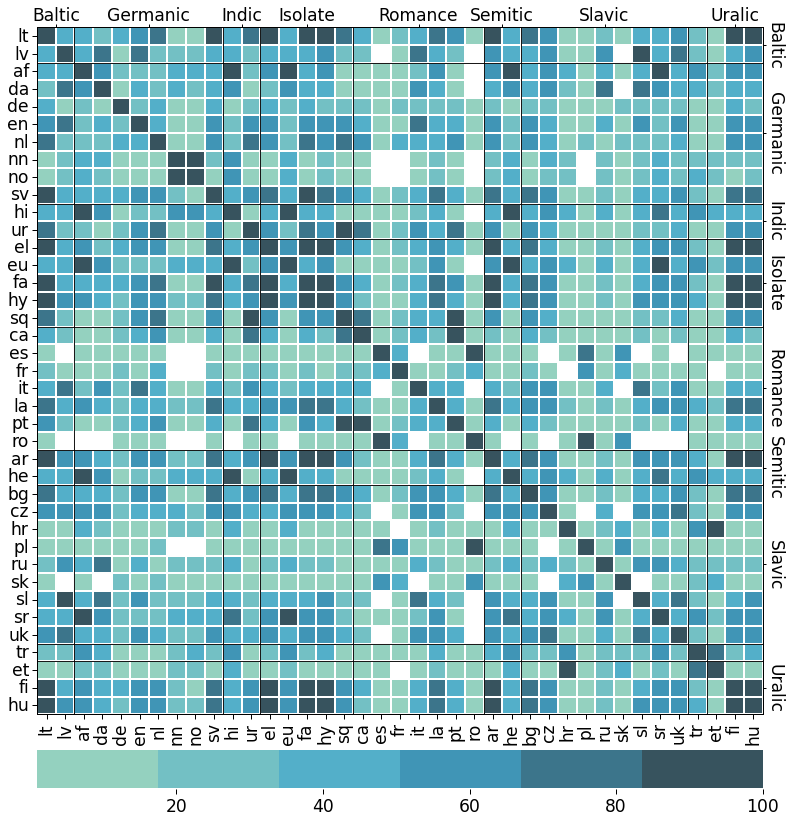

In [26]:
with sns.plotting_context('paper', font_scale=1.95):
    grid_kws = {"height_ratios": (.9, .05), "hspace": .1}

    fig, (ax, cbar_ax) = plt.subplots(2, gridspec_kw=grid_kws, figsize=(13, 14))
    data = pd.DataFrame(cooc).loc[lang_order.language][lang_order.language]
    data.columns = [lang2code[c] for c in data.columns]
    data.index = [lang2code[c] for c in data.index]
    sns.set_palette(sns.color_palette("GnBu_d"))
    cm = sns.color_palette("GnBu_d")
    sns.heatmap(data, ax=ax, cmap=cm, cbar_ax=cbar_ax, cbar_kws={"orientation": "horizontal"}, linewidths=.1)
    for f in np.cumsum(family_size)[:-1]:
        ax.plot((f, f), (0, data.shape[0]), c='black', linewidth=.9)
        ax.plot((0, data.shape[1]), (f, f), c='black', linewidth=.9)
    for _, spine in ax.spines.items():
        spine.set_visible(True)
    ax.set_xlabel("")
    ax.set_ylabel("")
    
    ax2 = ax.twiny()
    ax2.set_xticks(ticklocs)
    ax2.set_xticklabels(ticklabels)
    ax2.tick_params(axis='x', which='major', pad=0, length=3)
    ax2.xaxis.set_ticks_position('top')
    ax2.set_xlim(ax.get_xlim())
    
    ax3 = ax.twinx()
    ax3.set_yticks(ticklocs)
    ax3.set_yticklabels(ticklabels, va='center')
    ax3.tick_params(axis='y', rotation=-90, which='major', pad=0, length=3)
    ax3.yaxis.set_ticks_position('right')
    ax3.set_ylim(ax.get_ylim())
    
    fig.savefig(f"{figure_dir}/heatmap_knn_with_reduction.png")

## Hierarchical clustering without reduction


K = 4
Afrikaans, Albanian, Arabic, Armenian, Bulgarian, Catalan, Czech, Danish, Dutch, English, French, German, Greek, Hebrew, Hindi, Hungarian, Italian, Latin, Lithuanian, Norwegian B, Norwegian N, Persian, Portuguese, Serbian, Slovak, Slovenian, Swedish, Ukrainian, Urdu
------
Finnish, Latvian
------
Polish, Romanian, Russian, Spanish
------
Basque, Croatian, Estonian, Turkish


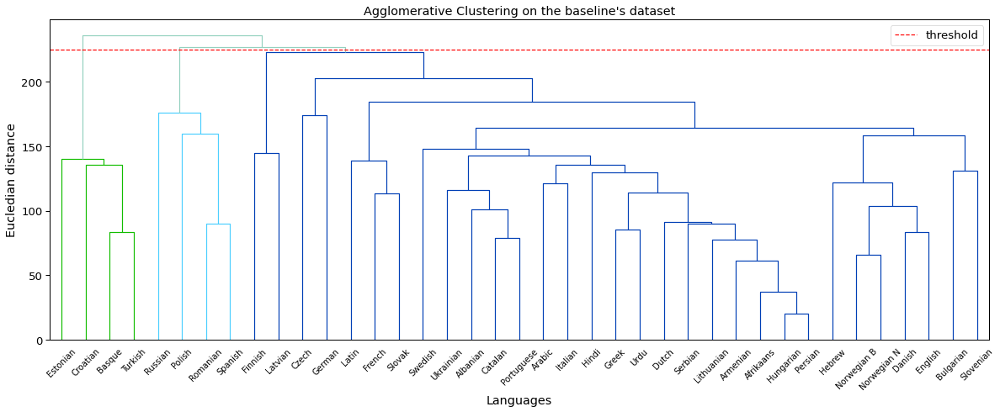

In [86]:
import scipy.cluster.hierarchy as shc
from sklearn.cluster import AgglomerativeClustering


threshold = 220

def do_cluster_hierh(K):
    X = test_effect.pivot_table(index='language', columns='task')
    X.rename(index={'Norwegian_Bokmal' : 'Norwegian B', 'Norwegian_Nynorsk' : 'Norwegian N'}, inplace=True)
    #X['language'] = X['language'].replace(['Norwegian_Bokmal'], 'Norw B')
    X = X.fillna(X.mean()) 
    k = AgglomerativeClustering(n_clusters=K, affinity='euclidean', linkage='ward')
    k.fit(X)
    #sns.set_palette(sns.color_palette("GnBu_d"))
    matplotlib.rcParams.update({'font.size': 15})
    plt.figure(figsize=(20, 7))  
    plt.title("Agglomerative Clustering on the baseline's dataset")  
    shc.set_link_color_palette(["#13bd00", "#4dcfff", "#003fb5", "#000000"])
    dend = shc.dendrogram(shc.linkage(X, method='ward'), labels=X.index, color_threshold=225, leaf_font_size=10)
    plt.grid(False)
    plt.axhline(y=225, color='r', linestyle='--', label='threshold')
    plt.legend()
    plt.xlabel("Languages")
    plt.ylabel("Eucledian distance")
    clusters = [[] for _ in range(K)]
    for i, lab in enumerate(k.labels_):
        clusters[lab].append(X.index[i])
    print(f"K = {K}")
    print("\n------\n".join(", ".join(cl) for cl in clusters))
    
do_cluster_hierh(4)
plt.savefig(f"{figure_dir}/hierarch_baseline.png", dpi=900)

In [28]:
cooc = defaultdict(lambda: defaultdict(int))
            
for _ in range(100):
    K = np.random.randint(3, 9)
    X = test_effect.pivot_table(index='language', columns='task')[model_perturbations + data_perturbations]
    X = X.fillna(X.mean())
    k = AgglomerativeClustering(n_clusters=K, affinity='euclidean', linkage='ward')  
    k.fit(X)
    cl = pd.DataFrame({'language': X.index, 'cluster':k.labels_})
    cl.groupby('cluster').language.apply(increase_cooc)
print(calculate_acc_score(cooc))

0.028432297928690398


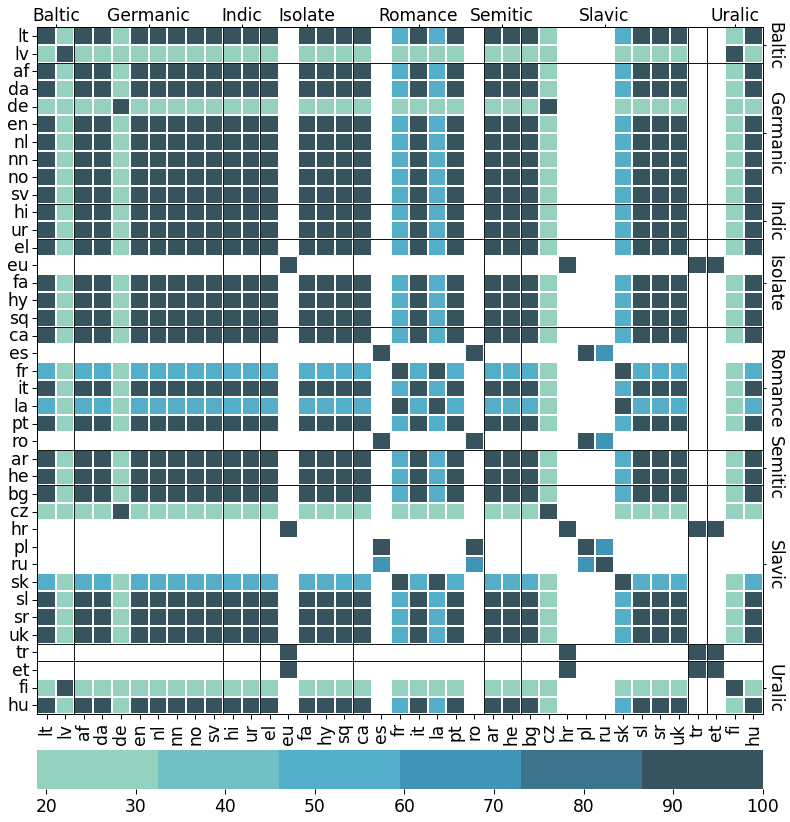

In [29]:
with sns.plotting_context('paper', font_scale=1.95):
    grid_kws = {"height_ratios": (.9, .05), "hspace": .1}

    fig, (ax, cbar_ax) = plt.subplots(2, gridspec_kw=grid_kws, figsize=(13, 14))
    data = pd.DataFrame(cooc).loc[lang_order.language][lang_order.language]
    data.columns = [lang2code[c] for c in data.columns]
    data.index = [lang2code[c] for c in data.index]
    sns.heatmap(data, ax=ax, cmap=cm, cbar_ax=cbar_ax, cbar_kws={"orientation": "horizontal"}, linewidths=.1)
    for f in np.cumsum(family_size)[:-1]:
        ax.plot((f, f), (0, data.shape[0]), c='black', linewidth=.9)
        ax.plot((0, data.shape[1]), (f, f), c='black', linewidth=.9)
    for _, spine in ax.spines.items():
        spine.set_visible(True)
    ax.set_xlabel("")
    ax.set_ylabel("")
    
    ax2 = ax.twiny()
    ax2.set_xticks(ticklocs)
    ax2.set_xticklabels(ticklabels)
    ax2.tick_params(axis='x', which='major', pad=0, length=3)
    ax2.xaxis.set_ticks_position('top')
    ax2.set_xlim(ax.get_xlim())
    
    ax3 = ax.twinx()
    ax3.set_yticks(ticklocs)
    ax3.set_yticklabels(ticklabels, va='center')
    ax3.tick_params(axis='y', rotation=-90, which='major', pad=0, length=3)
    ax3.yaxis.set_ticks_position('right')
    ax3.set_ylim(ax.get_ylim())
    
    fig.savefig(f"{figure_dir}/heatmap_hierh.png")

## hierarchical clustering with dimension reduction (cut)

K = 7
French, Polish, Romanian, Russian, Spanish
------
Bulgarian, Czech, Danish, English, Italian, Latvian, Slovenian, Ukrainian
------
Croatian, Estonian, Latin, Slovak, Turkish
------
Albanian, Catalan, Portuguese, Urdu
------
Norwegian_Bokmal, Norwegian_Nynorsk
------
Afrikaans, Arabic, Armenian, Basque, Dutch, Finnish, Greek, Hebrew, Hindi, Hungarian, Lithuanian, Persian, Serbian, Swedish
------
German


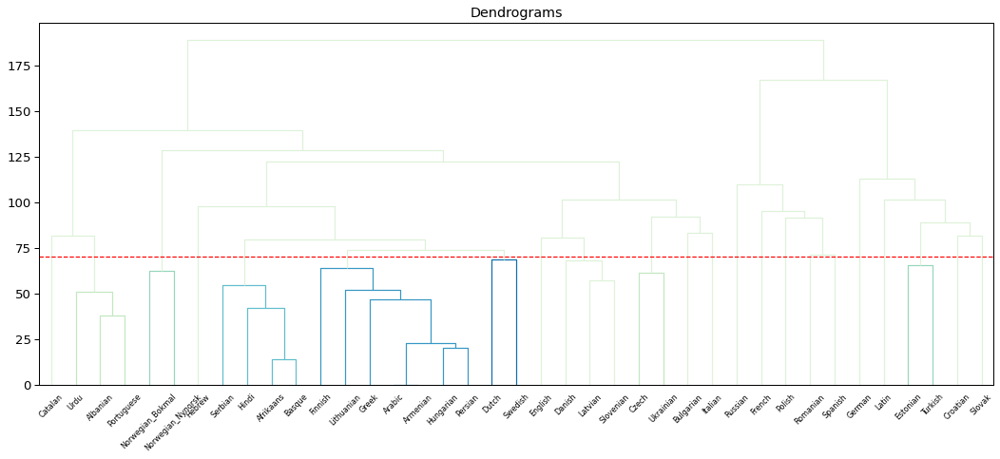

In [203]:
def do_cluster_hierh_with_reduction(K):
    X = reduce_columns_old(test_effect, 20)
    X = X.fillna(X.mean())
    k = AgglomerativeClustering(n_clusters=K, affinity='euclidean', linkage='ward')  
    k.fit(X)
    
    plt.figure(figsize=(18, 7))  
    plt.title("Dendrograms")  
    dend = shc.dendrogram(shc.linkage(X, method='ward'), labels=X.index, color_threshold=70)

    plt.axhline(y=70, color='r', linestyle='--')

    clusters = [[] for _ in range(K)]
    for i, lab in enumerate(k.labels_):
        clusters[lab].append(X.index[i])
    print(f"K = {K}")
    print("\n------\n".join(", ".join(cl) for cl in clusters))

do_cluster_hierh_with_reduction(7)

In [204]:
excluded = ["('B$_2$', 'animacy_verb')", "('B$_2$', 'definite_verb')", "('B$_2$', 'derivation_adj')", "('B$_2$', 'derivation_noun')", "('B$_2$', 'hebbinyan_verb')", "('B$_2$', 'infform_verb')", "('B$_2$', 'nametype_propn')", "('B$_2$', 'number[psor]_noun')", "('B$_2$', 'number_propn')", "('B$_2$', 'partform_verb')", "('B$_2$', 'person[psor]_noun')", "('B$_2$', 'polarity_adj')", "('B$_2$', 'subcat_verb')", "('B$_2$', 'subgender_adj')", "('B$_2$', 'tense_adj')", "('L$_2$', 'animacy_verb')", "('L$_2$', 'definite_verb')", "('L$_2$', 'derivation_adj')", "('L$_2$', 'derivation_noun')", "('L$_2$', 'hebbinyan_verb')", "('L$_2$', 'infform_verb')", "('L$_2$', 'nametype_propn')", "('L$_2$', 'number[psor]_noun')", "('L$_2$', 'number_propn')", "('L$_2$', 'partform_verb')", "('L$_2$', 'person[psor]_noun')", "('L$_2$', 'polarity_adj')", "('L$_2$', 'subcat_verb')", "('L$_2$', 'subgender_adj')", "('L$_2$', 'tense_adj')", "('R$_2$', 'animacy_verb')", "('R$_2$', 'definite_verb')", "('R$_2$', 'derivation_adj')", "('R$_2$', 'derivation_noun')", "('R$_2$', 'hebbinyan_verb')", "('R$_2$', 'infform_verb')", "('R$_2$', 'nametype_propn')", "('R$_2$', 'number[psor]_noun')", "('R$_2$', 'number_propn')", "('R$_2$', 'partform_verb')", "('R$_2$', 'person[psor]_noun')", "('R$_2$', 'polarity_adj')", "('R$_2$', 'subcat_verb')", "('R$_2$', 'subgender_adj')", "('R$_2$', 'tense_adj')", "('TARG', 'animacy_verb')", "('TARG', 'definite_verb')", "('TARG', 'derivation_adj')", "('TARG', 'derivation_noun')", "('TARG', 'hebbinyan_verb')", "('TARG', 'infform_verb')", "('TARG', 'nametype_propn')", "('TARG', 'number[psor]_noun')", "('TARG', 'number_propn')", "('TARG', 'partform_verb')", "('TARG', 'person[psor]_noun')", "('TARG', 'polarity_adj')", "('TARG', 'subcat_verb')", "('TARG', 'subgender_adj')", "('TARG', 'tense_adj')", "('mBERT-char', 'animacy_verb')", "('mBERT-char', 'definite_verb')", "('mBERT-char', 'derivation_adj')", "('mBERT-char', 'derivation_noun')", "('mBERT-char', 'hebbinyan_verb')", "('mBERT-char', 'infform_verb')", "('mBERT-char', 'nametype_propn')", "('mBERT-char', 'number[psor]_noun')", "('mBERT-char', 'number_propn')", "('mBERT-char', 'partform_verb')", "('mBERT-char', 'person[psor]_noun')", "('mBERT-char', 'polarity_adj')", "('mBERT-char', 'subcat_verb')", "('mBERT-char', 'subgender_adj')", "('mBERT-char', 'tense_adj')", "('mBERT-emb', 'animacy_verb')", "('mBERT-emb', 'definite_verb')", "('mBERT-emb', 'derivation_adj')", "('mBERT-emb', 'derivation_noun')", "('mBERT-emb', 'hebbinyan_verb')", "('mBERT-emb', 'infform_verb')", "('mBERT-emb', 'nametype_propn')", "('mBERT-emb', 'number[psor]_noun')", "('mBERT-emb', 'number_propn')", "('mBERT-emb', 'partform_verb')", "('mBERT-emb', 'person[psor]_noun')", "('mBERT-emb', 'polarity_adj')", "('mBERT-emb', 'subcat_verb')", "('mBERT-emb', 'subgender_adj')", "('mBERT-emb', 'tense_adj')", "('mBERT-nocontext', 'animacy_verb')", "('mBERT-nocontext', 'definite_verb')", "('mBERT-nocontext', 'derivation_adj')", "('mBERT-nocontext', 'derivation_noun')", "('mBERT-nocontext', 'hebbinyan_verb')", "('mBERT-nocontext', 'infform_verb')", "('mBERT-nocontext', 'nametype_propn')", "('mBERT-nocontext', 'number[psor]_noun')", "('mBERT-nocontext', 'number_propn')", "('mBERT-nocontext', 'partform_verb')", "('mBERT-nocontext', 'person[psor]_noun')", "('mBERT-nocontext', 'polarity_adj')", "('mBERT-nocontext', 'subcat_verb')", "('mBERT-nocontext', 'subgender_adj')", "('mBERT-nocontext', 'tense_adj')", "('mBERT-rand-char', 'animacy_verb')", "('mBERT-rand-char', 'definite_verb')", "('mBERT-rand-char', 'derivation_adj')", "('mBERT-rand-char', 'derivation_noun')", "('mBERT-rand-char', 'hebbinyan_verb')", "('mBERT-rand-char', 'infform_verb')", "('mBERT-rand-char', 'nametype_propn')", "('mBERT-rand-char', 'number[psor]_noun')", "('mBERT-rand-char', 'number_propn')", "('mBERT-rand-char', 'partform_verb')", "('mBERT-rand-char', 'person[psor]_noun')", "('mBERT-rand-char', 'polarity_adj')", "('mBERT-rand-char', 'subcat_verb')", "('mBERT-rand-char', 'subgender_adj')", "('mBERT-rand-char', 'tense_adj')", "('mBERT-rand-subw', 'animacy_verb')", "('mBERT-rand-subw', 'definite_verb')", "('mBERT-rand-subw', 'derivation_adj')", "('mBERT-rand-subw', 'derivation_noun')", "('mBERT-rand-subw', 'hebbinyan_verb')", "('mBERT-rand-subw', 'infform_verb')", "('mBERT-rand-subw', 'nametype_propn')", "('mBERT-rand-subw', 'number[psor]_noun')", "('mBERT-rand-subw', 'number_propn')", "('mBERT-rand-subw', 'partform_verb')", "('mBERT-rand-subw', 'person[psor]_noun')", "('mBERT-rand-subw', 'polarity_adj')", "('mBERT-rand-subw', 'subcat_verb')", "('mBERT-rand-subw', 'subgender_adj')", "('mBERT-rand-subw', 'tense_adj')", "('next', 'animacy_verb')", "('next', 'definite_verb')", "('next', 'derivation_adj')", "('next', 'derivation_noun')", "('next', 'hebbinyan_verb')", "('next', 'infform_verb')", "('next', 'nametype_propn')", "('next', 'number[psor]_noun')", "('next', 'number_propn')", "('next', 'partform_verb')", "('next', 'person[psor]_noun')", "('next', 'polarity_adj')", "('next', 'subcat_verb')", "('next', 'subgender_adj')", "('next', 'tense_adj')", "('permute', 'animacy_verb')", "('permute', 'definite_verb')", "('permute', 'derivation_adj')", "('permute', 'derivation_noun')", "('permute', 'hebbinyan_verb')", "('permute', 'infform_verb')", "('permute', 'nametype_propn')", "('permute', 'number[psor]_noun')", "('permute', 'number_propn')", "('permute', 'partform_verb')", "('permute', 'person[psor]_noun')", "('permute', 'polarity_adj')", "('permute', 'subcat_verb')", "('permute', 'subgender_adj')", "('permute', 'tense_adj')", "('prev', 'animacy_verb')", "('prev', 'definite_verb')", "('prev', 'derivation_adj')", "('prev', 'derivation_noun')", "('prev', 'hebbinyan_verb')", "('prev', 'infform_verb')", "('prev', 'nametype_propn')", "('prev', 'number[psor]_noun')", "('prev', 'number_propn')", "('prev', 'partform_verb')", "('prev', 'person[psor]_noun')", "('prev', 'polarity_adj')", "('prev', 'subcat_verb')", "('prev', 'subgender_adj')", "('prev', 'tense_adj')", "('B$_2$', 'animacy_propn')", "('B$_2$', 'aspect_adj')", "('B$_2$', 'degree_adj')", "('L$_2$', 'animacy_propn')", "('L$_2$', 'aspect_adj')", "('L$_2$', 'degree_adj')", "('R$_2$', 'animacy_propn')", "('R$_2$', 'aspect_adj')", "('R$_2$', 'degree_adj')", "('TARG', 'animacy_propn')", "('TARG', 'aspect_adj')", "('TARG', 'degree_adj')", "('mBERT-char', 'animacy_propn')", "('mBERT-char', 'aspect_adj')", "('mBERT-char', 'degree_adj')", "('mBERT-emb', 'animacy_propn')", "('mBERT-emb', 'aspect_adj')", "('mBERT-emb', 'degree_adj')", "('mBERT-nocontext', 'animacy_propn')", "('mBERT-nocontext', 'aspect_adj')", "('mBERT-nocontext', 'degree_adj')", "('mBERT-rand-char', 'animacy_propn')", "('mBERT-rand-char', 'aspect_adj')", "('mBERT-rand-char', 'degree_adj')", "('mBERT-rand-subw', 'animacy_propn')", "('mBERT-rand-subw', 'aspect_adj')", "('mBERT-rand-subw', 'degree_adj')", "('next', 'animacy_propn')", "('next', 'aspect_adj')", "('next', 'degree_adj')", "('permute', 'animacy_propn')", "('permute', 'aspect_adj')", "('permute', 'degree_adj')", "('prev', 'animacy_propn')", "('prev', 'aspect_adj')", "('prev', 'degree_adj')", "('B$_2$', 'case_verb')", "('B$_2$', 'polarity_verb')", "('B$_2$', 'voice_adj')", "('L$_2$', 'case_verb')", "('L$_2$', 'polarity_verb')", "('L$_2$', 'voice_adj')", "('R$_2$', 'case_verb')", "('R$_2$', 'polarity_verb')", "('R$_2$', 'voice_adj')", "('TARG', 'case_verb')", "('TARG', 'polarity_verb')", "('TARG', 'voice_adj')", "('mBERT-char', 'case_verb')", "('mBERT-char', 'polarity_verb')", "('mBERT-char', 'voice_adj')", "('mBERT-emb', 'case_verb')", "('mBERT-emb', 'polarity_verb')", "('mBERT-emb', 'voice_adj')", "('mBERT-nocontext', 'case_verb')", "('mBERT-nocontext', 'polarity_verb')", "('mBERT-nocontext', 'voice_adj')", "('mBERT-rand-char', 'case_verb')", "('mBERT-rand-char', 'polarity_verb')", "('mBERT-rand-char', 'voice_adj')", "('mBERT-rand-subw', 'case_verb')", "('mBERT-rand-subw', 'polarity_verb')", "('mBERT-rand-subw', 'voice_adj')", "('next', 'case_verb')", "('next', 'polarity_verb')", "('next', 'voice_adj')", "('permute', 'case_verb')", "('permute', 'polarity_verb')", "('permute', 'voice_adj')", "('prev', 'case_verb')", "('prev', 'polarity_verb')", "('prev', 'voice_adj')", "('B$_2$', 'animacy_adj')", "('L$_2$', 'animacy_adj')", "('R$_2$', 'animacy_adj')", "('TARG', 'animacy_adj')", "('mBERT-char', 'animacy_adj')", "('mBERT-emb', 'animacy_adj')", "('mBERT-nocontext', 'animacy_adj')", "('mBERT-rand-char', 'animacy_adj')", "('mBERT-rand-subw', 'animacy_adj')", "('next', 'animacy_adj')", "('permute', 'animacy_adj')", "('prev', 'animacy_adj')", "('B$_2$', 'animacy_noun')", "('B$_2$', 'definite_adj')", "('L$_2$', 'animacy_noun')", "('L$_2$', 'definite_adj')", "('R$_2$', 'animacy_noun')", "('R$_2$', 'definite_adj')", "('TARG', 'animacy_noun')", "('TARG', 'definite_adj')", "('mBERT-char', 'animacy_noun')", "('mBERT-char', 'definite_adj')", "('mBERT-emb', 'animacy_noun')", "('mBERT-emb', 'definite_adj')", "('mBERT-nocontext', 'animacy_noun')", "('mBERT-nocontext', 'definite_adj')", "('mBERT-rand-char', 'animacy_noun')", "('mBERT-rand-char', 'definite_adj')", "('mBERT-rand-subw', 'animacy_noun')", "('mBERT-rand-subw', 'definite_adj')", "('next', 'animacy_noun')", "('next', 'definite_adj')", "('permute', 'animacy_noun')", "('permute', 'definite_adj')", "('prev', 'animacy_noun')", "('prev', 'definite_adj')", "('B$_2$', 'mood_verb')", "('L$_2$', 'mood_verb')", "('R$_2$', 'mood_verb')", "('TARG', 'mood_verb')", "('mBERT-char', 'mood_verb')", "('mBERT-emb', 'mood_verb')", "('mBERT-nocontext', 'mood_verb')", "('mBERT-rand-char', 'mood_verb')", "('mBERT-rand-subw', 'mood_verb')", "('next', 'mood_verb')", "('permute', 'mood_verb')", "('prev', 'mood_verb')", "('B$_2$', 'voice_verb')", "('L$_2$', 'voice_verb')", "('R$_2$', 'voice_verb')"]
def reduce_worst_columns(test_f, num_of_cols):
    Y = pd.DataFrame(test_f.pivot_table(index='language', columns='task').to_records())
    Y = Y.drop(excluded, axis=1)
    return Y.pivot_table(index='language')

K = 7
French, Polish, Romanian, Russian, Spanish
------
Bulgarian, Czech, Danish, English, Italian, Latvian, Slovenian, Ukrainian
------
Croatian, Estonian, Latin, Slovak, Turkish
------
Albanian, Catalan, Portuguese, Urdu
------
Norwegian_Bokmal, Norwegian_Nynorsk
------
Afrikaans, Arabic, Armenian, Basque, Dutch, Finnish, Greek, Hebrew, Hindi, Hungarian, Lithuanian, Persian, Serbian, Swedish
------
German


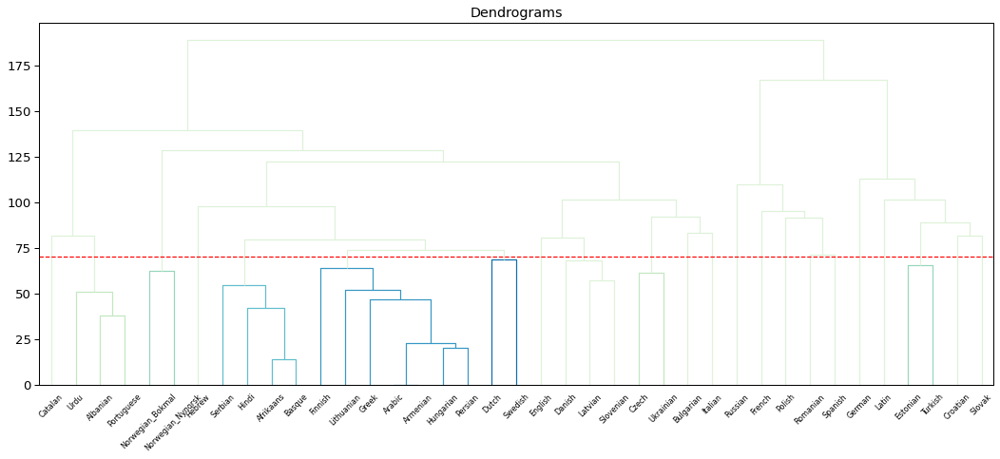

In [205]:
def do_cluster_hierh_with_reduction(K):
    X = reduce_columns_old(test_effect, 20)
    X = X.fillna(X.mean())
    k = AgglomerativeClustering(n_clusters=K, affinity='euclidean', linkage='ward')  
    k.fit(X)
    
    plt.figure(figsize=(18, 7))  
    plt.title("Dendrograms")  
    dend = shc.dendrogram(shc.linkage(X, method='ward'), labels=X.index, color_threshold=70)

    plt.axhline(y=70, color='r', linestyle='--')

    clusters = [[] for _ in range(K)]
    for i, lab in enumerate(k.labels_):
        clusters[lab].append(X.index[i])
    print(f"K = {K}")
    print("\n------\n".join(", ".join(cl) for cl in clusters))

do_cluster_hierh_with_reduction(7)

In [206]:
cooc = defaultdict(lambda: defaultdict(int))

def increase_cooc(langs):
    for l1 in langs:
        for l2 in langs:
            cooc[l1][l2] += 1
            
for _ in range(100):
    K = np.random.randint(3, 9)
    X = reduce_worst_columns(test_effect, 20)
    X = X.fillna(X.mean())
    k = AgglomerativeClustering(n_clusters=K, affinity='euclidean', linkage='ward')  
    k.fit(X)
    cl = pd.DataFrame({'language': X.index, 'cluster':k.labels_})
    cl.groupby('cluster').language.apply(increase_cooc)
print(calculate_acc_score(cooc))

0.08039325448063561


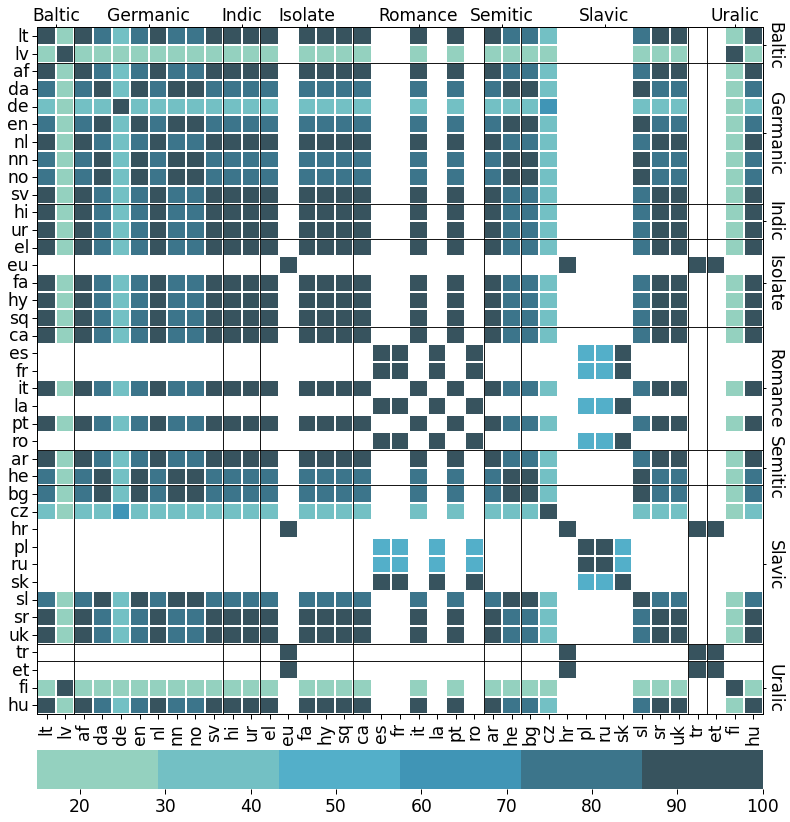

In [207]:
with sns.plotting_context('paper', font_scale=1.95):
    grid_kws = {"height_ratios": (.9, .05), "hspace": .1}
    fig, (ax, cbar_ax) = plt.subplots(2, gridspec_kw=grid_kws, figsize=(13, 14))
    data = pd.DataFrame(cooc).loc[lang_order.language][lang_order.language]
    data.columns = [lang2code[c] for c in data.columns]
    data.index = [lang2code[c] for c in data.index]
    sns.heatmap(data, ax=ax, cmap=cm, cbar_ax=cbar_ax, cbar_kws={"orientation": "horizontal"}, linewidths=.1)
    for f in np.cumsum(family_size)[:-1]:
        ax.plot((f, f), (0, data.shape[0]), c='black', linewidth=.9)
        ax.plot((0, data.shape[1]), (f, f), c='black', linewidth=.9)
    for _, spine in ax.spines.items():
        spine.set_visible(True)
    ax.set_xlabel("")
    ax.set_ylabel("")
    
    ax2 = ax.twiny()
    ax2.set_xticks(ticklocs)
    ax2.set_xticklabels(ticklabels)
    ax2.tick_params(axis='x', which='major', pad=0, length=3)
    ax2.xaxis.set_ticks_position('top')
    ax2.set_xlim(ax.get_xlim())
    
    ax3 = ax.twinx()
    ax3.set_yticks(ticklocs)
    ax3.set_yticklabels(ticklabels, va='center')
    ax3.tick_params(axis='y', rotation=-90, which='major', pad=0, length=3)
    ax3.yaxis.set_ticks_position('right')
    ax3.set_ylim(ax.get_ylim())
    
    fig.savefig(f"{figure_dir}/heatmap_hierh_with_reduction.png")

In [ ]:
from sklearn import tree
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn import metrics

areas = pd.read_csv("../dataframes/wals/wals_areas.tsv", sep="\t")
feat2area = dict(areas[['Name', 'Area']].drop_duplicates().values)
feat2area['Family'] = 'Family'

wals_languages = []
wals = []
param2area = {}
for fn in os.listdir('../dataframes/wals'):
    if not fn.endswith('csv'):
        continue
    lang = fn.split(".")[0]
    wals_languages.append(lang)
    df = pd.read_csv(f"../dataframes/wals/{lang}.csv", encoding='latin1')
    df = df.sort_values('Parameter').pivot(index='Language', columns='Parameter', values='Name')
    wals.append(df)
    
wals = pd.concat(wals, sort=True)
wals.index = wals_languages
wals.loc['Latin'] = np.nan 
wals['Family'] = wals.index.map(lambda l: lang2family[l])
print(wals.shape), wals.isnull().stack().mean()
wals = wals.reset_index()
for column in wals:
    if(wals[column].count() / wals.shape[0] < 0.7):
        wals = wals.drop(column, axis =1)
column = 'Comitatives and Instrumentals'
wals = wals[wals[column].notnull()]
target = wals[column]
wals = wals.drop([column,'index'], axis=1)

for column in wals:
    le = preprocessing.LabelEncoder()
    le.fit(wals[column].unique())
    wals[column] = le.transform(wals[column])
clf = tree.DecisionTreeClassifier()

X_train, X_test, y_train, y_test = train_test_split(wals, target, test_size=0.3, random_state=1) # 70% training and 30% test


clf = clf.fit(X_train, y_train)
tree.plot_tree(clf)

y_pred = clf.predict(X_test)
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

In [ ]:
from sklearn import tree
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn import metrics
import pandas as pd
import seaborn as sns
from sklearn.neighbors import KNeighborsClassifier

In [ ]:
percent_missing = base.isnull().sum() * 100 / len(base)
missing = pd.DataFrame({'column' : base.columns, 'missing': percent_missing})
missing.sort_values('missing', inplace=True)
missing[missing.missing < 40]
missing[missing.column.isin(interesting)]
missing

In [ ]:
base.notna().sum().sum() / (len(base) * len(base.columns))

In [ ]:
import warnings
from pandas.core.common import SettingWithCopyWarning
warnings.simplefilter(action="ignore", category=SettingWithCopyWarning)
warnings.simplefilter(action="ignore", category=FutureWarning)
warnings.simplefilter(action="ignore", category=UserWarning)

In [ ]:
base = pd.read_csv("wals2.csv", index_col=[0])



tree_mapper = {}
for column in base:
    tree_mapper[column]=preprocessing.LabelEncoder()
    tree_mapper[column] = tree_mapper[column].fit(base[column])


results = pd.DataFrame(columns=['Feature', 'Purity', 'Accuracy'])
forest = {}
for feature in base.columns:
    
    nulldropped = base[base[feature].notnull()]
    for col in nulldropped.columns:
        nulldropped[col] = tree_mapper[col].transform(nulldropped[col])
    
    if nulldropped[feature].count() < 2:
        continue
        
    predictors = nulldropped.drop([feature], axis=1)
    target = nulldropped[feature]
    
    X_train, X_test, y_train, y_test = train_test_split(predictors, target, test_size=0.3, random_state=1) # 70% training and 30% test
    clf = tree.DecisionTreeClassifier()
    clf = clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)
    forest[feature] = clf
    results = results.append({'Feature': feature,'Purity' : len(target) / len(base[feature]), 'Accuracy' : metrics.accuracy_score(y_test, y_pred)}, ignore_index=True)
    #results.a
    #print(wals3[feature].count())
    #print(f"{feature} - accuracy: {metrics.accuracy_score(y_test, y_pred)}")

In [ ]:
import graphviz
import pydotplus
from sklearn import tree
import collections

clf = forest["Adjectives without Nouns"]
enc = tree_mapper["Adjectives without Nouns"]
features = base.columns.drop(['Adjectives without Nouns'])
print(f"{featurz} , {clf.classes_}")

dot_data = tree.export_graphviz(clf, out_file=None, feature_names=features, class_names=enc.classes_, filled=False)


graph = pydotplus.graph_from_dot_data(dot_data)
nodes = graph.get_node_list()
edges = graph.get_edge_list()

colors = ('lightblue', 'aliceblue', 'palegreen')
edges = collections.defaultdict(list)

for edge in graph.get_edge_list():
    edges[edge.get_source()].append(int(edge.get_destination()))

for edge in edges:
    edges[edge].sort()    
    for i in range(2):
        dest = graph.get_node(str(edges[edge][i]))[0]
        dest.set_fillcolor(colors[i])

graph.write_png('tree.png')
#graph = graphviz.Source(dot_data, format="png")
#graph.render("dtree_built_example")
#graph

In [117]:
# import JSON parser
import re
import json
import math

# decode the Digraph to JSON format
json_string = graph.pipe('json').decode()

# parse the resulting json_string
json_dict = json.loads(json_string)

# now, you have a JSON dictionary that has two relevant keys:
# 'objects' for nodes and 'edges' for, well, edges.
# you can iterate over the nodes and get the (x,y) position for each node as follows:
for obj in json_dict['objects']:
    text = obj['_ldraw_'][2]['text']
    sep = text.split('= ')
    feature = sep[0].split(' <')[0]
    if 'gini ' not in sep:
        
        values = tree_mapper[feature].classes_
        cat = math.ceil(float(sep[1]))
        notequal = []
        for i in range(0, cat):
            notequal.append(values[i])
        obj['_ldraw_'][2]['text'] = f"{feature} is in {notequal}"
        data = f"{feature} is in {notequal}"
        regex = f"{feature} <= ..."
        data = data.replace('\',', '\',\n')
        data = data.replace('[\'', '\n[\'')
        dot_data = re.sub(regex, data, dot_data )
    
graph = graphviz.Source(dot_data, format="png")
graph.render("dtree_built_example")

'dtree_built_example.png.png'

In [175]:
# with nulls
base = pd.read_csv("wals2.csv", index_col=[0])
mapper = {}
for column in base:
    mapper[column]=preprocessing.LabelEncoder()
    mapper[column].fit(base[column].unique())


results = pd.DataFrame(columns=['Feature', 'Number of records','Classes', 'Accuracy'])
forest = {}
nulldropped = base #base[base[feature].notnull()]
for col in nulldropped.columns:
    nulldropped[col] = mapper[col].transform(nulldropped[col])
for feature in base.columns:
    
    
    if nulldropped[feature].count() < 2:
        continue
        
    predictors = nulldropped.drop([feature], axis=1)
    target = nulldropped[feature]
    
    X_train, X_test, y_train, y_test = train_test_split(predictors, target, test_size=0.3, random_state=1) # 70% training and 30% test
    clf = tree.DecisionTreeClassifier()
    clf = clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)
    forest[feature] = clf
    
    results = results.append({'Feature': feature,'Number of records' : len(target), 'Classes' : len(target.unique()), 'Accuracy' : metrics.accuracy_score(y_test, y_pred)}, ignore_index=True)
    #results.a
    #print(wals3[feature].count())
    print(f"{feature} - accuracy: {metrics.accuracy_score(y_test, y_pred)}")

'Want' Complement Subjects - accuracy: 0.9662077596996246
'When' Clauses - accuracy: 0.9849812265331664
Absence of Common Consonants - accuracy: 0.983729662077597
Action Nominal Constructions - accuracy: 0.9724655819774718
Adjectives without Nouns - accuracy: 0.9887359198998749
Adjoined relative clauses - accuracy: 1.0
Alignment of Case Marking of Full Noun Phrases - accuracy: 0.9874843554443054
Alignment of Case Marking of Pronouns - accuracy: 0.986232790988736
Alignment of Verbal Person Marking - accuracy: 0.981226533166458
Antipassive Constructions - accuracy: 0.9987484355444305
Applicative Constructions - accuracy: 0.9949937421777222
Asymmetrical Case-Marking - accuracy: 0.9887359198998749
Case Syncretism - accuracy: 0.9887359198998749
Coding of Evidentiality - accuracy: 0.9887359198998749
Coding of Nominal Plurality - accuracy: 0.9224030037546934
Comitatives and Instrumentals - accuracy: 0.9574468085106383
Comparative Constructions - accuracy: 0.9586983729662077
Conjunctions and U

Relationship between the Order of Object and Verb and the Order of Relative Clause and Noun - accuracy: 0.9974968710888611
Relativization on Obliques - accuracy: 0.986232790988736
Relativization on Subjects - accuracy: 0.9912390488110138
Rhythm Types - accuracy: 0.967459324155194
SNegOV Order - accuracy: 0.9962453066332916
SNegVO Order - accuracy: 0.9962453066332916
SONegV Order - accuracy: 0.9974968710888611
SOVNeg Order - accuracy: 0.9937421777221527
SVNegO Order - accuracy: 0.9949937421777222
SVONeg Order - accuracy: 0.9987484355444305
Semantic Distinctions of Evidentiality - accuracy: 0.9949937421777222
Sex-based and Non-sex-based Gender Systems - accuracy: 0.9987484355444305
Situational Possibility - accuracy: 0.9887359198998749
Subtypes of Asymmetric Standard Negation - accuracy: 0.986232790988736
Suppletion According to Tense and Aspect - accuracy: 0.9899874843554443
Suppletion in Imperatives and Hortatives - accuracy: 0.9924906132665833
Syllable Structure - accuracy: 0.96495619

In [149]:
results.to_csv('DTREE_results_with_null.csv', index=False)

In [15]:
interesting = ['Conjunctions and Universal Quantifiers',
       'The Position of Negative Morphemes in SOV Languages',
       'Reason Clauses', 'Systems of Gender Assignment',
       'Sex-based and Non-sex-based Gender Systems',
       'Reciprocal Constructions',
       'Position of Interrogative Phrases in Content Questions',
       'Intensifiers and Reflexive Pronouns', 'Reduplication',
       'Verbal Person Marking', 'Relativization on Subjects',
       'Person Marking on Adpositions', 'Tea', 'Distributive Numerals',
       'Imperative-Hortative Systems', "'When' Clauses", 'M-T Pronouns',
       'Numeral Classifiers', 'Locus of Marking: Whole-language Typology',
       'Postverbal Negative Morphemes', "'Want' Complement Subjects",
       'Order of Subject and Verb',
       'Suppletion According to Tense and Aspect', 'Purpose Clauses',
       'Order of Object, Oblique, and Verb',
       'Syncretism in Verbal Person/Number Marking',
       'Utterance Complement Clauses', 'The Morphological Imperative',
       'Predicative Possession',
       'Overlap between Situational and Epistemic Modal Marking',
       'Symmetric and Asymmetric Standard Negation',
       'Relationship between the Order of Object and Verb and the Order of Relative Clause and Noun',
       'Para-Linguistic Usages of Clicks',
       'Order of Adposition and Noun Phrase',
       'Expression of Pronominal Subjects',
       'Zero Copula for Predicate Nominals', 'Comparative Constructions',
       'Hand and Arm', 'Ordinal Numerals',
       'Third Person Pronouns and Demonstratives',
       'Exponence of Tense-Aspect-Mood Inflection',
       'Position of Case Affixes', 'Number of Genders',
       'Order of Adjective and Noun', 'Syllable Structure',
       'The Associative Plural', 'Definite Articles',
       'Asymmetrical Case-Marking', 'The Future Tense', 'Polar Questions',
       'Vowel Quality Inventories', 'Order of Person Markers on the Verb',
       'Negative Indefinite Pronouns and Predicate Negation',
       'Order of Subject, Object and Verb',
       'Locus of Marking in the Clause', 'Indefinite Articles',
       'Inflectional Synthesis of the Verb', 'Weight-Sensitive Stress',
       'Third Person Zero of Verbal Person Marking',
       'Front Rounded Vowels', 'Perfective/Imperfective Aspect',
       'Fixed Stress Locations',
       'Position of Pronominal Possessive Affixes',
       'Weight Factors in Weight-Sensitive Stress Systems', 'Family',
       'Position of Polar Question Particles',
       'The Position of Negative Morphemes in SVO Languages',
       'Comitatives and Instrumentals', 'Order of Genitive and Noun',
       'The Perfect', 'Consonant Inventories',
       'Plurality in Independent Personal Pronouns',
       'Position of Negative Word With Respect to Subject, Object, and Verb',
       'Number of Cases', 'Locus of Marking in Possessive Noun Phrases',
       'Exponence of Selected Inflectional Formatives',
       'Action Nominal Constructions',
       'Order of Negative Morpheme and Verb',
       'Gender Distinctions in Independent Personal Pronouns',
       'Consonant-Vowel Ratio', 'Rhythm Types',
       'Order of Object and Verb',
       'Subtypes of Asymmetric Standard Negation', 'Indefinite Pronouns',
       'Relationship between the Order of Object and Verb and the Order of Adjective and Noun',
       'The Prohibitive', 'Politeness Distinctions in Pronouns',
       'Relationship between the Order of Object and Verb and the Order of Adposition and Noun Phrase',
       'Coding of Evidentiality',
       'Suppletion in Imperatives and Hortatives',
       'Semantic Distinctions of Evidentiality']
len(interesting)

91

In [16]:
final = results[results['Feature'].isin(interesting)]
final

NameError: name 'results' is not defined

In [17]:
areas = pd.read_csv("../dataframes/wals/wals_areas.tsv", sep="\t")
feat2area = dict(areas[['Name','Area']].drop_duplicates().values)

wals_languages = []
wals = []
param2area = {}
for fn in os.listdir('../dataframes/wals'):
    if not fn.endswith('csv'):
        continue
    lang = fn.split(".")[0]
    wals_languages.append(lang)
    df = pd.read_csv(f"../dataframes/wals/{lang}.csv", encoding='latin1')
    df = df.sort_values('Parameter').pivot(index='Language', columns='Parameter', values='Name')
    wals.append(df)

wals = pd.concat(wals, sort=True)
wals.index = wals_languages
wals.loc['Latin'] = np.nan
wals['Family'] = wals.index.map(lambda l: lang2family[l])
print(wals.isnull().stack().mean())
wals

0.4632768361581921


<ipython-input-17-b582fc38d8d4>:19: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  wals['Family'] = wals.index.map(lambda l: lang2family[l])


Parameter,'Want' Complement Subjects,'When' Clauses,Absence of Common Consonants,Action Nominal Constructions,Adjectives without Nouns,Alignment of Case Marking of Full Noun Phrases,Alignment of Case Marking of Pronouns,Alignment of Verbal Person Marking,Antipassive Constructions,Applicative Constructions,...,Verbal Person Marking,Voicing and Gaps in Plosive Systems,Voicing in Plosives and Fricatives,Vowel Nasalization,Vowel Quality Inventories,Weight Factors in Weight-Sensitive Stress Systems,Weight-Sensitive Stress,Zero Copula for Predicate Nominals,Zero Marking of A and P Arguments,Family
Danish,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,Long vowel or coda consonant,Combined: Right-edge and unbounded,NaN,NaN,Germanic
Lithuanian,NaN,NaN,All present,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,None missing in /p t k b d g/,In both plosives and fricatives,NaN,Average (5-6),Lexical stress,Unbounded: Stress can be anywhere,Possible,NaN,Baltic
Swedish,NaN,NaN,NaN,Other,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,Long vowel or coda consonant,Right-oriented: One of the last three,Impossible,NaN,Germanic
Catalan,NaN,NaN,All present,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,None missing in /p t k b d g/,In both plosives and fricatives,NaN,Large (7-14),Lexical stress,Right-edge: Ultimate or penultimate,NaN,NaN,Romance
Italian,NaN,Balanced/deranked,NaN,NaN,NaN,NaN,NaN,Accusative,NaN,NaN,...,Only the A argument,NaN,NaN,NaN,NaN,Lexical stress,Right-edge: Ultimate or penultimate,NaN,NaN,Romance
Urdu,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Indic
English,Subject is left implicit,Balanced/deranked,All present,Mixed,Marked by following word,Neutral,Nominative - accusative (standard),Accusative,No antipassive,No applicative construction,...,Only the A argument,None missing in /p t k b d g/,In both plosives and fricatives,Contrast absent,Large (7-14),Long vowel or coda consonant,Right-oriented: One of the last three,Impossible,Non-zero marking,Germanic
Dutch,NaN,NaN,NaN,Ergative-Possessive,NaN,NaN,NaN,Accusative,NaN,NaN,...,Only the A argument,NaN,NaN,NaN,NaN,Coda consonant,Right-oriented: One of the last three,Impossible,NaN,Germanic
Armenian,NaN,NaN,All present,Possessive-Accusative,NaN,Nominative - accusative (standard),Nominative - accusative (standard),Accusative,No antipassive,No applicative construction,...,Only the A argument,Other,In fricatives alone,Contrast absent,Average (5-6),Prominence,Unbounded: Stress can be anywhere,Impossible,NaN,Armenian
Afrikaans,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Germanic


In [19]:
te = test_effect[model_perturbations + data_perturbations].copy()
te['HAS_TASK'] = 1
logreg_perts = te.columns
te = te.unstack()
te = te.fillna(0)
te['HAS_TASK'] = te['HAS_TASK'].fillna(0)
te.head()

perturbation       mBERT-char                                          \
task              animacy_adj animacy_noun animacy_propn animacy_verb   
language                                                                
Afrikaans            0.000000     0.000000      0.000000      0.00000   
Albanian             0.000000     0.000000      0.000000      0.00000   
Arabic               0.000000     0.000000      0.000000      0.00000   
Armenian             0.000000    18.967587      0.000000      0.00000   
Basque               0.000000     0.000000      0.000000      0.00000   
Bulgarian            0.000000     0.000000      0.000000      0.00000   
Catalan              0.000000     0.000000      0.000000      0.00000   
Croatian             0.000000     0.000000      0.000000      0.00000   
Czech               25.905895    10.340705     21.725240      1.83727   
Danish               0.000000     0.000000      0.000000      0.00000   
Dutch                0.000000     0.000000      0.000000      0.00000   
English              0.000000     0.000000      0.000000      0.00000   
Estonian             0.000000     0.000000      0.000000      0.00000   
Finnish              0.000000     0.000000      0.000000      0.00000   
French               0.000000     0.000000      0.000000      0.00000   
German               0.000000     0.000000      0.000000      0.00000   
Greek                0.000000     0.000000      0.000000      0.00000   
Hebrew               0.000000     0.000000      0.000000      0.00000   
Hindi                0.000000     0.000000      0.000000      0.00000   
Hungarian            0.000000     0.000000      0.000000      0.00000   
Italian              0.000000     0.000000      0.000000      0.00000   
Latin                0.000000     0.000000      0.000000      0.00000   
Latvian              0.000000     0.000000      0.000000      0.00000   
Lithuanian           0.000000     0.000000      0.000000      0.00000   
Norwegian_Bokmal     0.000000     0.000000      0.000000      0.00000   
Norwegian_Nynorsk    0.000000     0.000000      0.000000      0.00000   
Persian              0.000000     0.000000      0.000000      0.00000   
Polish              18.961039    30.674847      0.000000      0.00000   
Portuguese           0.000000     0.000000      0.000000      0.00000   
Romanian             0.000000     0.000000      0.000000      0.00000   
Russian             30.026110    20.775623     15.245203      0.00000   
Serbian              0.000000     0.000000      0.000000      0.00000   
Slovak              25.248301    10.695742      0.000000      0.00000   
Slovenian            0.000000     0.000000      0.000000      0.00000   
Spanish              0.000000     0.000000      0.000000      0.00000   
Swedish              0.000000     0.000000      0.000000      0.00000   
Turkish              0.000000     0.000000      0.000000      0.00000   
Ukrainian            0.000000    26.446728      0.000000      0.00000   
Urdu                 0.000000     0.000000      0.000000      0.00000   

perturbation                                                               \
task              aspect_adj aspect_verb   case_adj  case_noun case_propn   
language                                                                    
Afrikaans           0.000000    0.000000   0.000000   0.000000   0.000000   
Albanian            0.000000    0.000000   0.000000  12.000000   1.748041   
Arabic              0.000000    0.421496  11.344853  20.538721   0.000000   
Armenian            0.000000    0.000000   0.000000   0.000000   0.000000   
Basque              0.000000    0.000000   0.000000   3.589744   0.000000   
Bulgarian           0.000000   14.233577   0.000000   0.000000   0.000000   
Catalan             0.000000    0.000000   0.000000   0.000000   0.000000   
Croatian            0.000000    0.000000  17.946003  22.822492   0.000000   
Czech               5.472637   14.737436  16.353887   0.000000  23.326134   
Danish   

In [205]:
def get_tree_prediction_for(column, language):
    row = wals[wals.index == language] 
    
    if not pd.isna(row[column][0]):
        return
    model = forest[column]
    pred = base[base.index == language].drop([column], axis=1)
    if  pred.empty:
        return
    
    for col in pred:
        pred[col] = tree_mapper[col].transform(pred[col])
    new_value = model.predict(pred)
    print(f'{column} {language} - {new_value}')
    try:
        new_value = tree_mapper[column].inverse_transform(new_value)
        wals[column][language] = new_value[0]
    except ValueError:
        print(f'{new_value} - [{tree_mapper[column].classes_}], {column}')
    
def get_KNN_prediction_for(column, language):
    row = wals[wals.index == language] 
    
    if not pd.isna(row[column][0]):
        return
    model = knn_classifiers[column]
    pred = base[base.index == language].drop([column], axis=1)
    if  pred.empty:
        return
    
    for col in pred:
        pred[col] = mapper[col].transform(pred[col])
    new_value = model.predict(pred)
    print(f'{column} {language} - {new_value}')
    new_value = mapper[column].inverse_transform(new_value)
    wals[column][language] = new_value[0]

for column in wals.columns:
    for index in wals.index:
        
        dt_acc = dt_results[dt_results.Feature == column]['Accuracy'].iloc[0] if len(dt_results[dt_results.Feature == column]) != 0 else 0
        knn_acc = knn_results[knn_results.Feature == column]['Accuracy'].iloc[0] if len(knn_results[knn_results.Feature == column]) != 0 else 0 
        get_tree_prediction_for(column,index) if  dt_acc > knn_acc  else get_KNN_prediction_for(column,index) 
        
wals    


'Want' Complement Subjects Danish - [0]
'Want' Complement Subjects Lithuanian - [0]
'Want' Complement Subjects Swedish - [3]
'Want' Complement Subjects Catalan - [0]
'Want' Complement Subjects Italian - [0]
'Want' Complement Subjects Urdu - [2]
'Want' Complement Subjects Dutch - [0]
'Want' Complement Subjects Afrikaans - [0]
'Want' Complement Subjects Portuguese - [0]
'Want' Complement Subjects Slovak - [2]
'Want' Complement Subjects Estonian - [0]
'Want' Complement Subjects Czech - [0]
'Want' Complement Subjects Polish - [0]
'Want' Complement Subjects Basque - [0]
'Want' Complement Subjects Ukrainian - [3]
'When' Clauses Danish - [2]
'When' Clauses Lithuanian - [2]
'When' Clauses Swedish - [2]
'When' Clauses Catalan - [2]
'When' Clauses Urdu - [2]
'When' Clauses Dutch - [2]
'When' Clauses Afrikaans - [2]
'When' Clauses Portuguese - [2]
'When' Clauses Slovak - [2]
'When' Clauses Latvian - [2]
'When' Clauses Estonian - [2]
'When' Clauses Romanian - [2]
'When' Clauses Albanian - [2]
'Whe

Comparative Constructions Danish - [2]
Comparative Constructions Lithuanian - [2]
Comparative Constructions Swedish - [0]
Comparative Constructions Catalan - [2]
Comparative Constructions Italian - [2]
Comparative Constructions Urdu - [2]
Comparative Constructions Afrikaans - [2]
Comparative Constructions Portuguese - [2]
Comparative Constructions Slovak - [2]
Comparative Constructions Estonian - [2]
Comparative Constructions German - [2]
Comparative Constructions Romanian - [2]
Comparative Constructions Czech - [2]
Comparative Constructions Bulgarian - [2]
Comparative Constructions Polish - [2]
Comparative Constructions Ukrainian - [1]
Comparative Constructions Persian - [2]
Conjunctions and Universal Quantifiers Danish - [0]
Conjunctions and Universal Quantifiers Lithuanian - [0]
Conjunctions and Universal Quantifiers Swedish - [2]
Conjunctions and Universal Quantifiers Catalan - [0]
Conjunctions and Universal Quantifiers Italian - [0]
Conjunctions and Universal Quantifiers Urdu - [0

Finger and Hand Bulgarian - [0]
Finger and Hand Persian - [0]
Finger and Hand Hindi - [0]
Fixed Stress Locations Urdu - [2]
Fixed Stress Locations Afrikaans - [2]
Fixed Stress Locations Albanian - [2]
Fixed Stress Locations Bulgarian - [2]
Fixed Stress Locations Basque - [2]
Fixed Stress Locations Ukrainian - [2]
Front Rounded Vowels Danish - [3]
Front Rounded Vowels Swedish - [3]
Front Rounded Vowels Italian - [3]
Front Rounded Vowels Urdu - [3]
Front Rounded Vowels Dutch - [3]
Front Rounded Vowels Afrikaans - [3]
Front Rounded Vowels Portuguese - [3]
Front Rounded Vowels Slovak - [3]
Front Rounded Vowels Estonian - [3]
Front Rounded Vowels Czech - [3]
Front Rounded Vowels Ukrainian - [3]
Fusion of Selected Inflectional Formatives Danish - [0]
Fusion of Selected Inflectional Formatives Lithuanian - [0]
Fusion of Selected Inflectional Formatives Swedish - [1]
Fusion of Selected Inflectional Formatives Catalan - [0]
Fusion of Selected Inflectional Formatives Italian - [0]
Fusion of Sele

Inflectional Synthesis of the Verb Portuguese - [4]
Inflectional Synthesis of the Verb Slovak - [4]
Inflectional Synthesis of the Verb Latvian - [4]
Inflectional Synthesis of the Verb Estonian - [4]
Inflectional Synthesis of the Verb Romanian - [4]
Inflectional Synthesis of the Verb Albanian - [4]
Inflectional Synthesis of the Verb Czech - [4]
Inflectional Synthesis of the Verb Bulgarian - [4]
Inflectional Synthesis of the Verb Polish - [4]
Inflectional Synthesis of the Verb Ukrainian - [4]
Intensifiers and Reflexive Pronouns Urdu - [1]
Intensifiers and Reflexive Pronouns Estonian - [1]
Intensifiers and Reflexive Pronouns Albanian - [1]
Intensifiers and Reflexive Pronouns Czech - [1]
Intensifiers and Reflexive Pronouns Ukrainian - [1]
Languages with different word order in negative clauses Danish - [0]
Languages with different word order in negative clauses Lithuanian - [0]
Languages with different word order in negative clauses Swedish - [1]
Languages with different word order in nega

M in First Person Singular Portuguese - [0]
M in First Person Singular Slovak - [0]
M in First Person Singular Latvian - [0]
M in First Person Singular Estonian - [0]
M in First Person Singular Romanian - [0]
M in First Person Singular Albanian - [0]
M in First Person Singular Czech - [0]
M in First Person Singular Bulgarian - [0]
M in First Person Singular Polish - [0]
M in First Person Singular Ukrainian - [0]
M in Second Person Singular Danish - [0]
M in Second Person Singular Lithuanian - [0]
M in Second Person Singular Swedish - [0]
M in Second Person Singular Catalan - [0]
M in Second Person Singular Italian - [0]
M in Second Person Singular Urdu - [0]
M in Second Person Singular Dutch - [0]
M in Second Person Singular Afrikaans - [0]
M in Second Person Singular Portuguese - [0]
M in Second Person Singular Slovak - [0]
M in Second Person Singular Latvian - [0]
M in Second Person Singular Estonian - [0]
M in Second Person Singular Romanian - [0]
M in Second Person Singular Albania

Nonperiphrastic Causative Constructions Urdu - [2]
Nonperiphrastic Causative Constructions Dutch - [2]
Nonperiphrastic Causative Constructions Afrikaans - [2]
Nonperiphrastic Causative Constructions Portuguese - [2]
Nonperiphrastic Causative Constructions Slovak - [2]
Nonperiphrastic Causative Constructions Estonian - [2]
Nonperiphrastic Causative Constructions Romanian - [2]
Nonperiphrastic Causative Constructions Albanian - [2]
Nonperiphrastic Causative Constructions Czech - [2]
Nonperiphrastic Causative Constructions Bulgarian - [2]
Nonperiphrastic Causative Constructions Polish - [2]
Nonperiphrastic Causative Constructions Ukrainian - [2]
Noun Phrase Conjunction Danish - [1]
Noun Phrase Conjunction Catalan - [1]
Noun Phrase Conjunction Italian - [1]
Noun Phrase Conjunction Urdu - [0]
Noun Phrase Conjunction Afrikaans - [1]
Noun Phrase Conjunction Portuguese - [1]
Noun Phrase Conjunction Slovak - [1]
Noun Phrase Conjunction German - [1]
Noun Phrase Conjunction Czech - [1]
Noun Phras

Optional Double Negation Persian - [6]
Optional Double Negation Hindi - [6]
Optional Double Negation Spanish - [8]
Optional Double Negation in SVO languages Danish - [3]
Optional Double Negation in SVO languages Lithuanian - [3]
Optional Double Negation in SVO languages Swedish - [3]
Optional Double Negation in SVO languages Italian - [3]
Optional Double Negation in SVO languages Urdu - [3]
Optional Double Negation in SVO languages English - [3]
Optional Double Negation in SVO languages Dutch - [3]
Optional Double Negation in SVO languages Afrikaans - [3]
Optional Double Negation in SVO languages Portuguese - [3]
Optional Double Negation in SVO languages Slovak - [3]
Optional Double Negation in SVO languages Russian - [3]
Optional Double Negation in SVO languages Latvian - [3]
Optional Double Negation in SVO languages Turkish - [3]
Optional Double Negation in SVO languages Estonian - [3]
Optional Double Negation in SVO languages German - [3]
Optional Double Negation in SVO languages Ro

Person Marking on Adpositions Swedish - [3]
Person Marking on Adpositions Catalan - [0]
Person Marking on Adpositions Urdu - [0]
Person Marking on Adpositions Afrikaans - [0]
Person Marking on Adpositions Portuguese - [0]
Person Marking on Adpositions Slovak - [1]
Person Marking on Adpositions Estonian - [0]
Person Marking on Adpositions Romanian - [0]
Person Marking on Adpositions Czech - [0]
Person Marking on Adpositions Bulgarian - [0]
Person Marking on Adpositions Ukrainian - [0]
Plurality in Independent Personal Pronouns Danish - [4]
Plurality in Independent Personal Pronouns Lithuanian - [4]
Plurality in Independent Personal Pronouns Swedish - [6]
Plurality in Independent Personal Pronouns Catalan - [4]
Plurality in Independent Personal Pronouns Italian - [4]
Plurality in Independent Personal Pronouns Urdu - [5]
Plurality in Independent Personal Pronouns Dutch - [4]
Plurality in Independent Personal Pronouns Afrikaans - [4]
Plurality in Independent Personal Pronouns Portuguese - 

Preverbal Negative Morphemes Slovak - [2]
Productivity of the Antipassive Construction Danish - [1]
Productivity of the Antipassive Construction Lithuanian - [1]
Productivity of the Antipassive Construction Swedish - [1]
Productivity of the Antipassive Construction Catalan - [1]
Productivity of the Antipassive Construction Italian - [1]
Productivity of the Antipassive Construction Urdu - [1]
Productivity of the Antipassive Construction Dutch - [1]
Productivity of the Antipassive Construction Afrikaans - [1]
Productivity of the Antipassive Construction Portuguese - [1]
Productivity of the Antipassive Construction Slovak - [1]
Productivity of the Antipassive Construction Estonian - [1]
Productivity of the Antipassive Construction Romanian - [1]
Productivity of the Antipassive Construction Albanian - [1]
Productivity of the Antipassive Construction Czech - [1]
Productivity of the Antipassive Construction Bulgarian - [1]
Productivity of the Antipassive Construction Polish - [1]
Pronominal 

SOVNeg Order Hungarian - [1]
SOVNeg Order Bulgarian - [1]
SOVNeg Order Polish - [1]
SOVNeg Order Ukrainian - [0]
SOVNeg Order Spanish - [0]
SOVNeg Order French - [1]
SVNegO Order Urdu - [3]
SVNegO Order Afrikaans - [1]
SVNegO Order Slovak - [1]
SVNegO Order Turkish - [1]
SVNegO Order Basque - [1]
SVNegO Order Persian - [1]
SVNegO Order Hindi - [1]
SVONeg Order Urdu - [0]
SVONeg Order Afrikaans - [1]
SVONeg Order Slovak - [1]
SVONeg Order Turkish - [0]
SVONeg Order Basque - [1]
SVONeg Order Persian - [1]
SVONeg Order Hindi - [1]
Semantic Distinctions of Evidentiality Danish - [1]
Semantic Distinctions of Evidentiality Catalan - [1]
Semantic Distinctions of Evidentiality Italian - [1]
Semantic Distinctions of Evidentiality Urdu - [0]
Semantic Distinctions of Evidentiality Portuguese - [1]
Semantic Distinctions of Evidentiality Slovak - [1]
Semantic Distinctions of Evidentiality Czech - [1]
Semantic Distinctions of Evidentiality Polish - [1]
Semantic Distinctions of Evidentiality Ukrainia

The Past Tense Urdu - [3]
The Past Tense Dutch - [0]
The Past Tense Slovak - [0]
The Past Tense Estonian - [0]
The Past Tense Albanian - [0]
The Past Tense Czech - [0]
The Past Tense Polish - [0]
The Past Tense Ukrainian - [3]
The Perfect Danish - [3]
The Perfect Lithuanian - [3]
The Perfect Catalan - [3]
The Perfect Italian - [3]
The Perfect Urdu - [2]
The Perfect Dutch - [3]
The Perfect Slovak - [3]
The Perfect Estonian - [3]
The Perfect Albanian - [3]
The Perfect Czech - [3]
The Perfect Polish - [3]
The Perfect Ukrainian - [0]
The Position of Negative Morphemes in SOV Languages Danish - [13]
The Position of Negative Morphemes in SOV Languages Lithuanian - [13]
The Position of Negative Morphemes in SOV Languages Swedish - [10]
The Position of Negative Morphemes in SOV Languages Catalan - [13]
The Position of Negative Morphemes in SOV Languages Italian - [13]
The Position of Negative Morphemes in SOV Languages English - [13]
The Position of Negative Morphemes in SOV Languages Afrikaan

Uvular Consonants Estonian - [2]
Uvular Consonants Czech - [2]
Uvular Consonants Ukrainian - [2]
Verb-Initial with Clause-Final Negative Danish - [0]
Verb-Initial with Clause-Final Negative Lithuanian - [0]
Verb-Initial with Clause-Final Negative Swedish - [0]
Verb-Initial with Clause-Final Negative Catalan - [0]
Verb-Initial with Clause-Final Negative Italian - [0]
Verb-Initial with Clause-Final Negative Urdu - [0]
Verb-Initial with Clause-Final Negative English - [0]
Verb-Initial with Clause-Final Negative Dutch - [0]
Verb-Initial with Clause-Final Negative Afrikaans - [0]
Verb-Initial with Clause-Final Negative Portuguese - [0]
Verb-Initial with Clause-Final Negative Slovak - [0]
Verb-Initial with Clause-Final Negative Russian - [0]
Verb-Initial with Clause-Final Negative Latvian - [0]
Verb-Initial with Clause-Final Negative Turkish - [0]
Verb-Initial with Clause-Final Negative Estonian - [0]
Verb-Initial with Clause-Final Negative German - [0]
Verb-Initial with Clause-Final Negativ

Vowel Nasalization Afrikaans - [0]
Vowel Nasalization Portuguese - [0]
Vowel Nasalization Slovak - [1]
Vowel Nasalization Estonian - [0]
Vowel Nasalization Romanian - [0]
Vowel Nasalization Albanian - [0]
Vowel Nasalization Czech - [0]
Vowel Nasalization Bulgarian - [0]
Vowel Nasalization Polish - [0]
Vowel Nasalization Ukrainian - [0]
Vowel Quality Inventories Danish - [2]
Vowel Quality Inventories Swedish - [1]
Vowel Quality Inventories Italian - [2]
Vowel Quality Inventories Urdu - [0]
Vowel Quality Inventories Dutch - [2]
Vowel Quality Inventories Afrikaans - [2]
Vowel Quality Inventories Portuguese - [2]
Vowel Quality Inventories Slovak - [2]
Vowel Quality Inventories Estonian - [2]
Vowel Quality Inventories Czech - [2]
Vowel Quality Inventories Ukrainian - [1]
Weight Factors in Weight-Sensitive Stress Systems Urdu - [6]
Weight Factors in Weight-Sensitive Stress Systems Afrikaans - [1]
Weight Factors in Weight-Sensitive Stress Systems Albanian - [1]
Weight Factors in Weight-Sensit

Parameter,'Want' Complement Subjects,'When' Clauses,Absence of Common Consonants,Action Nominal Constructions,Adjectives without Nouns,Alignment of Case Marking of Full Noun Phrases,Alignment of Case Marking of Pronouns,Alignment of Verbal Person Marking,Antipassive Constructions,Applicative Constructions,...,Verbal Person Marking,Voicing and Gaps in Plosive Systems,Voicing in Plosives and Fricatives,Vowel Nasalization,Vowel Quality Inventories,Weight Factors in Weight-Sensitive Stress Systems,Weight-Sensitive Stress,Zero Copula for Predicate Nominals,Zero Marking of A and P Arguments,Family
Danish,Both construction types exist,Deranked,All present,Possessive-Accusative,Without marking,Ergative - absolutive,Neutral,Split,Oblique patient,Benefactive and other; both bases,...,Both the A and P arguments,Other,In both plosives and fricatives,Contrast absent,Small (2-4),Long vowel or coda consonant,Combined: Right-edge and unbounded,Impossible,Non-zero marking,Germanic
Lithuanian,Both construction types exist,Deranked,All present,Possessive-Accusative,Without marking,Ergative - absolutive,Neutral,Split,Oblique patient,Benefactive and other; both bases,...,Both the A and P arguments,None missing in /p t k b d g/,In both plosives and fricatives,Contrast absent,Average (5-6),Lexical stress,Unbounded: Stress can be anywhere,Possible,Non-zero marking,Baltic
Swedish,Subject is expressed overtly,Deranked,All present,Other,Marked by preceding word,Nominative - accusative (standard),Nominative - accusative (standard),Accusative,Oblique patient,Benefactive and other; both bases,...,Both the A and P arguments,Other,In both plosives and fricatives,Contrast absent,Large (7-14),Long vowel or coda consonant,Right-oriented: One of the last three,Impossible,Non-zero marking,Germanic
Catalan,Both construction types exist,Deranked,All present,Possessive-Accusative,Without marking,Ergative - absolutive,Neutral,Split,Oblique patient,Benefactive and other; both bases,...,Both the A and P arguments,None missing in /p t k b d g/,In both plosives and fricatives,Contrast absent,Large (7-14),Lexical stress,Right-edge: Ultimate or penultimate,Impossible,Non-zero marking,Romance
Italian,Both construction types exist,Balanced/deranked,All present,Possessive-Accusative,Without marking,Ergative - absolutive,Neutral,Accusative,Oblique patient,Benefactive and other; both bases,...,Only the A argument,Other,In both plosives and fricatives,Contrast absent,Small (2-4),Lexical stress,Right-edge: Ultimate or penultimate,Impossible,Non-zero marking,Romance
Urdu,Desiderative verbal affix,Deranked,All present,Other,Without marking,Ergative - absolutive,Nominative - accusative (standard),Accusative,Oblique patient,Benefactive and other; both bases,...,Both the A and P arguments,Other,In both plosives and fricatives,Contrast absent,Average (5-6),Prominence,Fixed stress (no weight-sensitivity),Impossible,Non-zero marking,Indic
English,Subject is left implicit,Balanced/deranked,All present,Mixed,Marked by following word,Neutral,Nominative - accusative (standard),Accusative,No antipassive,No applicative construction,...,Only the A argument,None missing in /p t k b d g/,In both plosives and fricatives,Contrast absent,Large (7-14),Long vowel or coda consonant,Right-oriented: One of the last three,Impossible,Non-zero marking,Germanic
Dutch,Both construction types exist,Deranked,All present,Ergative-Possessive,Without marking,Ergative - absolutive,Neutral,Accusative,Oblique patient,Benefactive and other; both bases,...,Only the A argument,Other,In both plosives and fricatives,Contrast absent,Small (2-4),Coda consonant,Right-oriented: One of the last three,Impossible,Non-zero marking,Germanic
Armenian,NaN,NaN,All present,Possessive-Accusative,NaN,Nominative - accusative (standard),Nominative - accusative (standard),Accusative,No antipassive,No applicative construction,...,Only the A argument,Other,In fricatives alone,Contrast absent,Average (5-6),Prominence,Unbounded: Stress can be 

In [23]:
lin_acc = []
K = 3

for col in wals.columns:
    target = wals[col].dropna()
    common = sorted(set(target.index) & set(te.index))
    label_cnt = target.value_counts()
    large_classes = label_cnt[label_cnt>=K]
    if len(large_classes) < 2:
        continue
    target = target[target.isin(large_classes.index)]
    if target.value_counts(normalize=True).max() > 0.8:
         continue
    if len(label_cnt) < 2:
        continue
    te_common = te.loc[target.index]
    for pert in logreg_perts:
        X = te_common[pert]
        score = cross_val_score(
            LogisticRegression(solver='liblinear', multi_class='auto', max_iter=200),
            X, target, cv=3, scoring='f1_macro')
        notnull = len(target)
        lin_acc.append({
            'perturbation': pert, 'feature': col, 'score': score.mean(),
            'notnull': notnull, 'labels': dict(target.value_counts())})
    X = te_common
    score = cross_val_score(LogisticRegression(
        solver='liblinear', multi_class='auto', max_iter=200), X, target, cv=3, scoring='f1_macro')
    notnull = len(target)
    lin_acc.append({'perturbation': 'ALL', 'feature': col, 'score': score.mean(),
                    'notnull': notnull, 'labels': dict(target.value_counts())})
lin_acc = pd.DataFrame(lin_acc)

task       animacy_adj  animacy_noun  animacy_propn  animacy_verb  aspect_adj  \
English        0.00000      0.000000       0.000000           0.0         0.0   
Russian       30.02611     20.775623      15.245203           0.0         0.0   
Latvian        0.00000      0.000000       0.000000           0.0         0.0   
Turkish        0.00000      0.000000       0.000000           0.0         0.0   
German         0.00000      0.000000       0.000000           0.0         0.0   
Romanian       0.00000      0.000000       0.000000           0.0         0.0   
Albanian       0.00000      0.000000       0.000000           0.0         0.0   
Finnish        0.00000      0.000000       0.000000           0.0         0.0   
Hungarian      0.00000      0.000000       0.000000           0.0         0.0   
Bulgarian      0.00000      0.000000       0.000000           0.0         0.0   
Persian        0.00000      0.000000       0.000000           0.0         0.0   
Hindi          0.00000      

task       animacy_adj  animacy_noun  animacy_propn  animacy_verb  aspect_adj  \
English       0.000000      0.000000       0.000000           0.0         0.0   
Russian      13.159269      7.036011      11.886994           0.0         0.0   
Latvian       0.000000      0.000000       0.000000           0.0         0.0   
Turkish       0.000000      0.000000       0.000000           0.0         0.0   
German        0.000000      0.000000       0.000000           0.0         0.0   
Romanian      0.000000      0.000000       0.000000           0.0         0.0   
Albanian      0.000000      0.000000       0.000000           0.0         0.0   
Finnish       0.000000      0.000000       0.000000           0.0         0.0   
Hungarian     0.000000      0.000000       0.000000           0.0         0.0   
Bulgarian     0.000000      0.000000       0.000000           0.0         0.0   
Persian       0.000000      0.000000       0.000000           0.0         0.0   
Hindi         0.000000      

task       animacy_adj  animacy_noun  animacy_propn  animacy_verb  aspect_adj  \
Italian       0.000000      0.000000       0.000000           0.0         0.0   
English       0.000000      0.000000       0.000000           0.0         0.0   
Russian       1.357702      9.972299       3.411514           0.0         0.0   
German        0.000000      0.000000       0.000000           0.0         0.0   
Finnish       0.000000      0.000000       0.000000           0.0         0.0   
Hungarian     0.000000      0.000000       0.000000           0.0         0.0   
Basque        0.000000      0.000000       0.000000           0.0         0.0   
Persian       0.000000      0.000000       0.000000           0.0         0.0   
Hindi         0.000000      0.000000       0.000000           0.0         0.0   
Greek         0.000000      0.000000       0.000000           0.0         0.0   
Spanish       0.000000      0.000000       0.000000           0.0         0.0   
Hebrew        0.000000      

task       animacy_adj  animacy_noun  animacy_propn  animacy_verb  aspect_adj  \
English       0.000000      0.000000        0.00000           0.0         0.0   
Dutch         0.000000      0.000000        0.00000           0.0         0.0   
Armenian      0.000000      3.301321        0.00000           0.0         0.0   
Russian       6.997389      4.487535       -0.21322           0.0         0.0   
Turkish       0.000000      0.000000        0.00000           0.0         0.0   
Estonian      0.000000      0.000000        0.00000           0.0         0.0   
German        0.000000      0.000000        0.00000           0.0         0.0   
Albanian      0.000000      0.000000        0.00000           0.0         0.0   
Bulgarian     0.000000      0.000000        0.00000           0.0         0.0   
Persian       0.000000      0.000000        0.00000           0.0         0.0   
Hindi         0.000000      0.000000        0.00000           0.0         0.0   
Greek         0.000000      

task        animacy_adj  animacy_noun  animacy_propn  animacy_verb  \
Lithuanian     0.000000      0.000000       0.000000           0.0   
Swedish        0.000000      0.000000       0.000000           0.0   
Catalan        0.000000      0.000000       0.000000           0.0   
Italian        0.000000      0.000000       0.000000           0.0   
Urdu           0.000000      0.000000       0.000000           0.0   
English        0.000000      0.000000       0.000000           0.0   
Dutch          0.000000      0.000000       0.000000           0.0   
Armenian       0.000000     14.765906       0.000000           0.0   
Russian       38.381201     42.382271      45.095949           0.0   
Serbian        0.000000      0.000000       0.000000           0.0   
Latvian        0.000000      0.000000       0.000000           0.0   
Turkish        0.000000      0.000000       0.000000           0.0   
Estonian       0.000000      0.000000       0.000000           0.0   
German         0.000

task        animacy_adj  animacy_noun  animacy_propn  animacy_verb  \
Lithuanian          0.0           0.0            0.0           0.0   
Swedish             0.0           0.0            0.0           0.0   
Catalan             0.0           0.0            0.0           0.0   
Italian             0.0           0.0            0.0           0.0   
Urdu                0.0           0.0            0.0           0.0   
English             0.0           0.0            0.0           0.0   
Dutch               0.0           0.0            0.0           0.0   
Armenian            0.0           1.0            0.0           0.0   
Russian             1.0           1.0            1.0           0.0   
Serbian             0.0           0.0            0.0           0.0   
Latvian             0.0           0.0            0.0           0.0   
Turkish             0.0           0.0            0.0           0.0   
Estonian            0.0           0.0            0.0           0.0   
German              

task        animacy_adj  animacy_noun  animacy_propn  animacy_verb  \
Lithuanian     0.000000      0.000000       0.000000           0.0   
English        0.000000      0.000000       0.000000           0.0   
Dutch          0.000000      0.000000       0.000000           0.0   
Russian        1.357702      9.972299       3.411514           0.0   
Latvian        0.000000      0.000000       0.000000           0.0   
Turkish        0.000000      0.000000       0.000000           0.0   
Estonian       0.000000      0.000000       0.000000           0.0   
German         0.000000      0.000000       0.000000           0.0   
Romanian       0.000000      0.000000       0.000000           0.0   
Albanian       0.000000      0.000000       0.000000           0.0   
Finnish        0.000000      0.000000       0.000000           0.0   
Hungarian      0.000000      0.000000       0.000000           0.0   
Bulgarian      0.000000      0.000000       0.000000           0.0   
Persian        0.000

task               animacy_adj  animacy_noun  animacy_propn  animacy_verb  \
Danish                0.000000      0.000000       0.000000           0.0   
Lithuanian            0.000000      0.000000       0.000000           0.0   
Swedish               0.000000      0.000000       0.000000           0.0   
Catalan               0.000000      0.000000       0.000000           0.0   
Italian               0.000000      0.000000       0.000000           0.0   
Urdu                  0.000000      0.000000       0.000000           0.0   
English               0.000000      0.000000       0.000000           0.0   
Armenian              0.000000     12.725090       0.000000           0.0   
Afrikaans             0.000000      0.000000       0.000000           0.0   
Portuguese            0.000000      0.000000       0.000000           0.0   
Russian              31.122715     28.531856      24.200426           0.0   
Latvian               0.000000      0.000000       0.000000           0.0   

task       animacy_adj  animacy_noun  animacy_propn  animacy_verb  aspect_adj  \
English        0.00000      0.000000       0.000000           0.0         0.0   
Dutch          0.00000      0.000000       0.000000           0.0         0.0   
Russian       30.02611     20.775623      15.245203           0.0         0.0   
Arabic         0.00000      0.000000       0.000000           0.0         0.0   
Latvian        0.00000      0.000000       0.000000           0.0         0.0   
Turkish        0.00000      0.000000       0.000000           0.0         0.0   
Albanian       0.00000      0.000000       0.000000           0.0         0.0   
Finnish        0.00000      0.000000       0.000000           0.0         0.0   
Hungarian      0.00000      0.000000       0.000000           0.0         0.0   
Basque         0.00000      0.000000       0.000000           0.0         0.0   
Hindi          0.00000      0.000000       0.000000           0.0         0.0   
Greek          0.00000      

task       animacy_adj  animacy_noun  animacy_propn  animacy_verb  aspect_adj  \
English       0.000000      0.000000       0.000000           0.0         0.0   
Dutch         0.000000      0.000000       0.000000           0.0         0.0   
Russian       9.608355      5.595568       9.061834           0.0         0.0   
Arabic        0.000000      0.000000       0.000000           0.0         0.0   
Latvian       0.000000      0.000000       0.000000           0.0         0.0   
Turkish       0.000000      0.000000       0.000000           0.0         0.0   
Albanian      0.000000      0.000000       0.000000           0.0         0.0   
Finnish       0.000000      0.000000       0.000000           0.0         0.0   
Hungarian     0.000000      0.000000       0.000000           0.0         0.0   
Basque        0.000000      0.000000       0.000000           0.0         0.0   
Hindi         0.000000      0.000000       0.000000           0.0         0.0   
Greek         0.000000      

task       animacy_adj  animacy_noun  animacy_propn  animacy_verb  aspect_adj  \
English            0.0      0.000000            0.0           0.0         0.0   
Dutch              0.0      0.000000            0.0           0.0         0.0   
Armenian           0.0      5.162065            0.0           0.0         0.0   
Latvian            0.0      0.000000            0.0           0.0         0.0   
Turkish            0.0      0.000000            0.0           0.0         0.0   
Hungarian          0.0      0.000000            0.0           0.0         0.0   
Basque             0.0      0.000000            0.0           0.0         0.0   
Persian            0.0      0.000000            0.0           0.0         0.0   
Hebrew             0.0      0.000000            0.0           0.0         0.0   
French             0.0      0.000000            0.0           0.0         0.0   

task       aspect_verb  case_adj  case_noun  case_propn  case_verb  ...  \
English       0.000000   0.00000 

task               animacy_adj  animacy_noun  animacy_propn  animacy_verb  \
Lithuanian            0.000000      0.000000       0.000000           0.0   
Catalan               0.000000      0.000000       0.000000           0.0   
English               0.000000      0.000000       0.000000           0.0   
Armenian              0.000000     39.375750       0.000000           0.0   
Russian              32.637076     33.518006      50.426439           0.0   
Latvian               0.000000      0.000000       0.000000           0.0   
Turkish               0.000000      0.000000       0.000000           0.0   
German                0.000000      0.000000       0.000000           0.0   
Norwegian_Nynorsk     0.000000      0.000000       0.000000           0.0   
Romanian              0.000000      0.000000       0.000000           0.0   
Albanian              0.000000      0.000000       0.000000           0.0   
Hungarian             0.000000      0.000000       0.000000           0.0   

task               animacy_adj  animacy_noun  animacy_propn  animacy_verb  \
Lithuanian            0.000000      0.000000            0.0           0.0   
Catalan               0.000000      0.000000            0.0           0.0   
English               0.000000      0.000000            0.0           0.0   
Armenian              0.000000     18.967587            0.0           0.0   
Latvian               0.000000      0.000000            0.0           0.0   
Turkish               0.000000      0.000000            0.0           0.0   
German                0.000000      0.000000            0.0           0.0   
Norwegian_Nynorsk     0.000000      0.000000            0.0           0.0   
Romanian              0.000000      0.000000            0.0           0.0   
Albanian              0.000000      0.000000            0.0           0.0   
Finnish               0.000000      0.000000            0.0           0.0   
Hungarian             0.000000      0.000000            0.0           0.0   

task               animacy_adj  animacy_noun  animacy_propn  animacy_verb  \
Lithuanian            0.000000      0.000000            0.0           0.0   
Catalan               0.000000      0.000000            0.0           0.0   
English               0.000000      0.000000            0.0           0.0   
Armenian              0.000000     -0.060024            0.0           0.0   
Latvian               0.000000      0.000000            0.0           0.0   
Turkish               0.000000      0.000000            0.0           0.0   
German                0.000000      0.000000            0.0           0.0   
Norwegian_Nynorsk     0.000000      0.000000            0.0           0.0   
Romanian              0.000000      0.000000            0.0           0.0   
Albanian              0.000000      0.000000            0.0           0.0   
Finnish               0.000000      0.000000            0.0           0.0   
Hungarian             0.000000      0.000000            0.0           0.0   

task               animacy_adj  animacy_noun  animacy_propn  animacy_verb  \
Danish                0.000000      0.000000       0.000000      0.000000   
Lithuanian            0.000000      0.000000       0.000000      0.000000   
Swedish               0.000000      0.000000       0.000000      0.000000   
Italian               0.000000      0.000000       0.000000      0.000000   
Urdu                  0.000000      0.000000       0.000000      0.000000   
English               0.000000      0.000000       0.000000      0.000000   
Dutch                 0.000000      0.000000       0.000000      0.000000   
Armenian              0.000000      5.162065       0.000000      0.000000   
Portuguese            0.000000      0.000000       0.000000      0.000000   
Russian              11.227154      1.939058       1.385928      0.000000   
Serbian               0.000000      0.000000       0.000000      0.000000   
Arabic                0.000000      0.000000       0.000000      0.000000   

task        animacy_adj  animacy_noun  animacy_propn  animacy_verb  \
Lithuanian     0.000000      0.000000       0.000000      0.000000   
English        0.000000      0.000000       0.000000      0.000000   
Dutch          0.000000      0.000000       0.000000      0.000000   
Afrikaans      0.000000      0.000000       0.000000      0.000000   
Russian       32.637076     33.518006      50.426439      0.000000   
Latvian        0.000000      0.000000       0.000000      0.000000   
German         0.000000      0.000000       0.000000      0.000000   
Romanian       0.000000      0.000000       0.000000      0.000000   
Albanian       0.000000      0.000000       0.000000      0.000000   
Czech         37.263386     40.824866      41.427050     41.732283   
Finnish        0.000000      0.000000       0.000000      0.000000   
Bulgarian      0.000000      0.000000       0.000000      0.000000   
Polish        27.792208     63.190184       0.000000      0.000000   
Ukrainian      0.000

task        animacy_adj  animacy_noun  animacy_propn  animacy_verb  \
Lithuanian          0.0           0.0            0.0           0.0   
English             0.0           0.0            0.0           0.0   
Dutch               0.0           0.0            0.0           0.0   
Afrikaans           0.0           0.0            0.0           0.0   
Russian             1.0           1.0            1.0           0.0   
Latvian             0.0           0.0            0.0           0.0   
German              0.0           0.0            0.0           0.0   
Romanian            0.0           0.0            0.0           0.0   
Albanian            0.0           0.0            0.0           0.0   
Czech               1.0           1.0            1.0           1.0   
Finnish             0.0           0.0            0.0           0.0   
Bulgarian           0.0           0.0            0.0           0.0   
Polish              1.0           1.0            0.0           0.0   
Ukrainian           

task       animacy_adj  animacy_noun  animacy_propn  animacy_verb  aspect_adj  \
English       0.000000      0.000000       0.000000           0.0         0.0   
Russian       5.848564      2.770083       0.479744           0.0         0.0   
Turkish       0.000000      0.000000       0.000000           0.0         0.0   
German        0.000000      0.000000       0.000000           0.0         0.0   
Finnish       0.000000      0.000000       0.000000           0.0         0.0   
Hungarian     0.000000      0.000000       0.000000           0.0         0.0   
Basque        0.000000      0.000000       0.000000           0.0         0.0   
Persian       0.000000      0.000000       0.000000           0.0         0.0   
Hindi         0.000000      0.000000       0.000000           0.0         0.0   
Greek         0.000000      0.000000       0.000000           0.0         0.0   
Spanish       0.000000      0.000000       0.000000           0.0         0.0   
Hebrew        0.000000      

task       animacy_adj  animacy_noun  animacy_propn  animacy_verb  aspect_adj  \
English       0.000000      0.000000        0.00000           0.0         0.0   
Russian       6.997389      4.487535       -0.21322           0.0         0.0   
Turkish       0.000000      0.000000        0.00000           0.0         0.0   
German        0.000000      0.000000        0.00000           0.0         0.0   
Finnish       0.000000      0.000000        0.00000           0.0         0.0   
Hungarian     0.000000      0.000000        0.00000           0.0         0.0   
Basque        0.000000      0.000000        0.00000           0.0         0.0   
Persian       0.000000      0.000000        0.00000           0.0         0.0   
Hindi         0.000000      0.000000        0.00000           0.0         0.0   
Spanish       0.000000      0.000000        0.00000           0.0         0.0   
French        0.000000      0.000000        0.00000           0.0         0.0   

task       aspect_verb   ca

task               animacy_adj  animacy_noun  animacy_propn  animacy_verb  \
Danish                0.000000      0.000000       0.000000      0.000000   
Lithuanian            0.000000      0.000000       0.000000      0.000000   
Swedish               0.000000      0.000000       0.000000      0.000000   
Catalan               0.000000      0.000000       0.000000      0.000000   
Italian               0.000000      0.000000       0.000000      0.000000   
English               0.000000      0.000000       0.000000      0.000000   
Dutch                 0.000000      0.000000       0.000000      0.000000   
Armenian              0.000000     39.375750       0.000000      0.000000   
Portuguese            0.000000      0.000000       0.000000      0.000000   
Russian              32.637076     33.518006      50.426439      0.000000   
Serbian               0.000000      0.000000       0.000000      0.000000   
Latvian               0.000000      0.000000       0.000000      0.000000   

task               animacy_adj  animacy_noun  animacy_propn  animacy_verb  \
Danish                     0.0           0.0            0.0           0.0   
Lithuanian                 0.0           0.0            0.0           0.0   
Swedish                    0.0           0.0            0.0           0.0   
Catalan                    0.0           0.0            0.0           0.0   
Italian                    0.0           0.0            0.0           0.0   
English                    0.0           0.0            0.0           0.0   
Dutch                      0.0           0.0            0.0           0.0   
Armenian                   0.0           1.0            0.0           0.0   
Portuguese                 0.0           0.0            0.0           0.0   
Russian                    1.0           1.0            1.0           0.0   
Serbian                    0.0           0.0            0.0           0.0   
Latvian                    0.0           0.0            0.0           0.0   

task               animacy_adj  animacy_noun  animacy_propn  animacy_verb  \
Danish                0.000000      0.000000       0.000000      0.000000   
Lithuanian            0.000000      0.000000       0.000000      0.000000   
Swedish               0.000000      0.000000       0.000000      0.000000   
Catalan               0.000000      0.000000       0.000000      0.000000   
Italian               0.000000      0.000000       0.000000      0.000000   
English               0.000000      0.000000       0.000000      0.000000   
Dutch                 0.000000      0.000000       0.000000      0.000000   
Armenian              0.000000      2.641056       0.000000      0.000000   
Portuguese            0.000000      0.000000       0.000000      0.000000   
Slovak                0.627287     -0.259605       0.000000      0.000000   
Russian               1.044386      3.822715       6.236674      0.000000   
Serbian               0.000000      0.000000       0.000000      0.000000   

task               animacy_adj  animacy_noun  animacy_propn  animacy_verb  \
Lithuanian            0.000000      0.000000       0.000000           0.0   
Catalan               0.000000      0.000000       0.000000           0.0   
English               0.000000      0.000000       0.000000           0.0   
Armenian              0.000000     12.725090       0.000000           0.0   
Russian              31.122715     28.531856      24.200426           0.0   
Latvian               0.000000      0.000000       0.000000           0.0   
Turkish               0.000000      0.000000       0.000000           0.0   
German                0.000000      0.000000       0.000000           0.0   
Norwegian_Nynorsk     0.000000      0.000000       0.000000           0.0   
Romanian              0.000000      0.000000       0.000000           0.0   
Finnish               0.000000      0.000000       0.000000           0.0   
Hungarian             0.000000      0.000000       0.000000           0.0   

task       animacy_adj  animacy_noun  animacy_propn  animacy_verb  aspect_adj  \
Italian       0.000000      0.000000       0.000000           0.0    0.000000   
English       0.000000      0.000000       0.000000           0.0    0.000000   
Dutch         0.000000      0.000000       0.000000           0.0    0.000000   
Armenian      0.000000     18.967587       0.000000           0.0    0.000000   
Russian      30.026110     20.775623      15.245203           0.0    0.000000   
Latvian       0.000000      0.000000       0.000000           0.0    0.000000   
Turkish       0.000000      0.000000       0.000000           0.0    0.000000   
German        0.000000      0.000000       0.000000           0.0    0.000000   
Albanian      0.000000      0.000000       0.000000           0.0    0.000000   
Finnish       0.000000      0.000000       0.000000           0.0    0.000000   
Hungarian     0.000000      0.000000       0.000000           0.0    0.000000   
Polish       18.961039     3

task       animacy_adj  animacy_noun  animacy_propn  animacy_verb  aspect_adj  \
Italian       0.000000      0.000000       0.000000           0.0    0.000000   
English       0.000000      0.000000       0.000000           0.0    0.000000   
Dutch         0.000000      0.000000       0.000000           0.0    0.000000   
Armenian      0.000000     -0.060024       0.000000           0.0    0.000000   
Russian      13.159269      7.036011      11.886994           0.0    0.000000   
Latvian       0.000000      0.000000       0.000000           0.0    0.000000   
Turkish       0.000000      0.000000       0.000000           0.0    0.000000   
German        0.000000      0.000000       0.000000           0.0    0.000000   
Albanian      0.000000      0.000000       0.000000           0.0    0.000000   
Finnish       0.000000      0.000000       0.000000           0.0    0.000000   
Hungarian     0.000000      0.000000       0.000000           0.0    0.000000   
Polish       12.051948      

task               animacy_adj  animacy_noun  animacy_propn  animacy_verb  \
Danish                0.000000      0.000000       0.000000      0.000000   
Lithuanian            0.000000      0.000000       0.000000      0.000000   
Catalan               0.000000      0.000000       0.000000      0.000000   
Italian               0.000000      0.000000       0.000000      0.000000   
English               0.000000      0.000000       0.000000      0.000000   
Dutch                 0.000000      0.000000       0.000000      0.000000   
Afrikaans             0.000000      0.000000       0.000000      0.000000   
Portuguese            0.000000      0.000000       0.000000      0.000000   
Slovak               12.179822      0.311526       0.000000      0.000000   
Russian              11.227154      1.939058       1.385928      0.000000   
Serbian               0.000000      0.000000       0.000000      0.000000   
Turkish               0.000000      0.000000       0.000000      0.000000   

task               animacy_adj  animacy_noun  animacy_propn  animacy_verb  \
Danish                0.000000      0.000000       0.000000      0.000000   
Lithuanian            0.000000      0.000000       0.000000      0.000000   
Swedish               0.000000      0.000000       0.000000      0.000000   
Catalan               0.000000      0.000000       0.000000      0.000000   
Italian               0.000000      0.000000       0.000000      0.000000   
English               0.000000      0.000000       0.000000      0.000000   
Dutch                 0.000000      0.000000       0.000000      0.000000   
Armenian              0.000000     39.375750       0.000000      0.000000   
Portuguese            0.000000      0.000000       0.000000      0.000000   
Russian              32.637076     33.518006      50.426439      0.000000   
Serbian               0.000000      0.000000       0.000000      0.000000   
Latvian               0.000000      0.000000       0.000000      0.000000   

task               animacy_adj  animacy_noun  animacy_propn  animacy_verb  \
Danish                     0.0           0.0            0.0           0.0   
Lithuanian                 0.0           0.0            0.0           0.0   
Swedish                    0.0           0.0            0.0           0.0   
Catalan                    0.0           0.0            0.0           0.0   
Italian                    0.0           0.0            0.0           0.0   
English                    0.0           0.0            0.0           0.0   
Dutch                      0.0           0.0            0.0           0.0   
Armenian                   0.0           1.0            0.0           0.0   
Portuguese                 0.0           0.0            0.0           0.0   
Russian                    1.0           1.0            1.0           0.0   
Serbian                    0.0           0.0            0.0           0.0   
Latvian                    0.0           0.0            0.0           0.0   

task               animacy_adj  animacy_noun  animacy_propn  animacy_verb  \
Danish                0.000000      0.000000       0.000000      0.000000   
Lithuanian            0.000000      0.000000       0.000000      0.000000   
Swedish               0.000000      0.000000       0.000000      0.000000   
Catalan               0.000000      0.000000       0.000000      0.000000   
Italian               0.000000      0.000000       0.000000      0.000000   
Urdu                  0.000000      0.000000       0.000000      0.000000   
English               0.000000      0.000000       0.000000      0.000000   
Dutch                 0.000000      0.000000       0.000000      0.000000   
Armenian              0.000000      2.641056       0.000000      0.000000   
Portuguese            0.000000      0.000000       0.000000      0.000000   
Russian               1.044386      3.822715       6.236674      0.000000   
Serbian               0.000000      0.000000       0.000000      0.000000   

task        animacy_adj  animacy_noun  animacy_propn  animacy_verb  \
Lithuanian     0.000000      0.000000       0.000000           0.0   
Swedish        0.000000      0.000000       0.000000           0.0   
Italian        0.000000      0.000000       0.000000           0.0   
English        0.000000      0.000000       0.000000           0.0   
Dutch          0.000000      0.000000       0.000000           0.0   
Russian       31.122715     28.531856      24.200426           0.0   
Serbian        0.000000      0.000000       0.000000           0.0   
Latvian        0.000000      0.000000       0.000000           0.0   
Turkish        0.000000      0.000000       0.000000           0.0   
Estonian       0.000000      0.000000       0.000000           0.0   
Romanian       0.000000      0.000000       0.000000           0.0   
Finnish        0.000000      0.000000       0.000000           0.0   
Hungarian      0.000000      0.000000       0.000000           0.0   
Bulgarian      0.000

task       animacy_adj  animacy_noun  animacy_propn  animacy_verb  aspect_adj  \
English        0.00000      0.000000       0.000000           0.0         0.0   
Armenian       0.00000     18.967587       0.000000           0.0         0.0   
Russian       30.02611     20.775623      15.245203           0.0         0.0   
German         0.00000      0.000000       0.000000           0.0         0.0   
Finnish        0.00000      0.000000       0.000000           0.0         0.0   
Hungarian      0.00000      0.000000       0.000000           0.0         0.0   
Basque         0.00000      0.000000       0.000000           0.0         0.0   
Persian        0.00000      0.000000       0.000000           0.0         0.0   
Hindi          0.00000      0.000000       0.000000           0.0         0.0   
Greek          0.00000      0.000000       0.000000           0.0         0.0   
Spanish        0.00000      0.000000       0.000000           0.0         0.0   
Hebrew         0.00000      

task       animacy_adj  animacy_noun  animacy_propn  animacy_verb  aspect_adj  \
English       0.000000      0.000000       0.000000           0.0         0.0   
Armenian      0.000000     -0.060024       0.000000           0.0         0.0   
Russian      13.159269      7.036011      11.886994           0.0         0.0   
German        0.000000      0.000000       0.000000           0.0         0.0   
Finnish       0.000000      0.000000       0.000000           0.0         0.0   
Hungarian     0.000000      0.000000       0.000000           0.0         0.0   
Basque        0.000000      0.000000       0.000000           0.0         0.0   
Persian       0.000000      0.000000       0.000000           0.0         0.0   
Hindi         0.000000      0.000000       0.000000           0.0         0.0   
Greek         0.000000      0.000000       0.000000           0.0         0.0   
Spanish       0.000000      0.000000       0.000000           0.0         0.0   
Hebrew        0.000000      

task               animacy_adj  animacy_noun  animacy_propn  animacy_verb  \
Danish                0.000000      0.000000       0.000000           0.0   
Lithuanian            0.000000      0.000000       0.000000           0.0   
Swedish               0.000000      0.000000       0.000000           0.0   
Catalan               0.000000      0.000000       0.000000           0.0   
Italian               0.000000      0.000000       0.000000           0.0   
English               0.000000      0.000000       0.000000           0.0   
Dutch                 0.000000      0.000000       0.000000           0.0   
Armenian              0.000000      4.441777       0.000000           0.0   
Afrikaans             0.000000      0.000000       0.000000           0.0   
Portuguese            0.000000      0.000000       0.000000           0.0   
Slovak                3.293257     14.641745       0.000000           0.0   
Russian               1.357702      9.972299       3.411514           0.0   

task     animacy_adj  animacy_noun  animacy_propn  animacy_verb  aspect_adj  \
English     0.000000      0.000000       0.000000           0.0         0.0   
Russian    32.637076     33.518006      50.426439           0.0         0.0   
Turkish     0.000000      0.000000       0.000000           0.0         0.0   
German      0.000000      0.000000       0.000000           0.0         0.0   
Finnish     0.000000      0.000000       0.000000           0.0         0.0   
Basque      0.000000      0.000000       0.000000           0.0         0.0   
Hindi       0.000000      0.000000       0.000000           0.0         0.0   
Greek       0.000000      0.000000       0.000000           0.0         0.0   
Spanish     0.000000      0.000000       0.000000           0.0         0.0   
Hebrew      0.000000      0.000000       0.000000           0.0         0.0   
French      0.000000      0.000000       0.000000           0.0         0.0   

task     aspect_verb   case_adj  case_noun  case_pr

task       animacy_adj  animacy_noun  animacy_propn  animacy_verb  aspect_adj  \
English        0.00000      0.000000       0.000000           0.0         0.0   
Russian       30.02611     20.775623      15.245203           0.0         0.0   
Turkish        0.00000      0.000000       0.000000           0.0         0.0   
German         0.00000      0.000000       0.000000           0.0         0.0   
Finnish        0.00000      0.000000       0.000000           0.0         0.0   
Hungarian      0.00000      0.000000       0.000000           0.0         0.0   
Basque         0.00000      0.000000       0.000000           0.0         0.0   
Persian        0.00000      0.000000       0.000000           0.0         0.0   
Hindi          0.00000      0.000000       0.000000           0.0         0.0   
Greek          0.00000      0.000000       0.000000           0.0         0.0   
Spanish        0.00000      0.000000       0.000000           0.0         0.0   
Hebrew         0.00000      

task       animacy_adj  animacy_noun  animacy_propn  animacy_verb  aspect_adj  \
English       0.000000      0.000000       0.000000           0.0         0.0   
Russian       9.608355      5.595568       9.061834           0.0         0.0   
Turkish       0.000000      0.000000       0.000000           0.0         0.0   
German        0.000000      0.000000       0.000000           0.0         0.0   
Finnish       0.000000      0.000000       0.000000           0.0         0.0   
Hungarian     0.000000      0.000000       0.000000           0.0         0.0   
Basque        0.000000      0.000000       0.000000           0.0         0.0   
Persian       0.000000      0.000000       0.000000           0.0         0.0   
Hindi         0.000000      0.000000       0.000000           0.0         0.0   
Greek         0.000000      0.000000       0.000000           0.0         0.0   
Spanish       0.000000      0.000000       0.000000           0.0         0.0   
Hebrew        0.000000      

task       animacy_adj  animacy_noun  animacy_propn  animacy_verb  aspect_adj  \
English       0.000000      0.000000       0.000000           0.0         0.0   
Russian      11.227154      1.939058       1.385928           0.0         0.0   
Turkish       0.000000      0.000000       0.000000           0.0         0.0   
German        0.000000      0.000000       0.000000           0.0         0.0   
Finnish       0.000000      0.000000       0.000000           0.0         0.0   
Hungarian     0.000000      0.000000       0.000000           0.0         0.0   
Basque        0.000000      0.000000       0.000000           0.0         0.0   
Persian       0.000000      0.000000       0.000000           0.0         0.0   
Hindi         0.000000      0.000000       0.000000           0.0         0.0   
Spanish       0.000000      0.000000       0.000000           0.0         0.0   
Hebrew        0.000000      0.000000       0.000000           0.0         0.0   
French        0.000000      

task       animacy_adj  animacy_noun  animacy_propn  animacy_verb  aspect_adj  \
English        0.00000      0.000000       0.000000           0.0         0.0   
Russian       30.02611     20.775623      15.245203           0.0         0.0   
Turkish        0.00000      0.000000       0.000000           0.0         0.0   
German         0.00000      0.000000       0.000000           0.0         0.0   
Finnish        0.00000      0.000000       0.000000           0.0         0.0   
Hungarian      0.00000      0.000000       0.000000           0.0         0.0   
Basque         0.00000      0.000000       0.000000           0.0         0.0   
Persian        0.00000      0.000000       0.000000           0.0         0.0   
Hindi          0.00000      0.000000       0.000000           0.0         0.0   
Greek          0.00000      0.000000       0.000000           0.0         0.0   
Spanish        0.00000      0.000000       0.000000           0.0         0.0   
Hebrew         0.00000      

task       animacy_adj  animacy_noun  animacy_propn  animacy_verb  aspect_adj  \
English       0.000000      0.000000       0.000000           0.0         0.0   
Russian      13.159269      7.036011      11.886994           0.0         0.0   
Turkish       0.000000      0.000000       0.000000           0.0         0.0   
German        0.000000      0.000000       0.000000           0.0         0.0   
Finnish       0.000000      0.000000       0.000000           0.0         0.0   
Hungarian     0.000000      0.000000       0.000000           0.0         0.0   
Basque        0.000000      0.000000       0.000000           0.0         0.0   
Persian       0.000000      0.000000       0.000000           0.0         0.0   
Hindi         0.000000      0.000000       0.000000           0.0         0.0   
Greek         0.000000      0.000000       0.000000           0.0         0.0   
Spanish       0.000000      0.000000       0.000000           0.0         0.0   
Hebrew        0.000000      

task        animacy_adj  animacy_noun  animacy_propn  animacy_verb  \
Lithuanian     0.000000      0.000000        0.00000           0.0   
Swedish        0.000000      0.000000        0.00000           0.0   
Catalan        0.000000      0.000000        0.00000           0.0   
Italian        0.000000      0.000000        0.00000           0.0   
English        0.000000      0.000000        0.00000           0.0   
Portuguese     0.000000      0.000000        0.00000           0.0   
Russian        6.997389      4.487535       -0.21322           0.0   
Serbian        0.000000      0.000000        0.00000           0.0   
Latvian        0.000000      0.000000        0.00000           0.0   
Turkish        0.000000      0.000000        0.00000           0.0   
Romanian       0.000000      0.000000        0.00000           0.0   
Finnish        0.000000      0.000000        0.00000           0.0   
Hungarian      0.000000      0.000000        0.00000           0.0   
Bulgarian      0.000

task        animacy_adj  animacy_noun  animacy_propn  animacy_verb  \
Lithuanian     0.000000      0.000000       0.000000           0.0   
Swedish        0.000000      0.000000       0.000000           0.0   
Catalan        0.000000      0.000000       0.000000           0.0   
Italian        0.000000      0.000000       0.000000           0.0   
Urdu           0.000000      0.000000       0.000000           0.0   
English        0.000000      0.000000       0.000000           0.0   
Dutch          0.000000      0.000000       0.000000           0.0   
Armenian       0.000000     18.967587       0.000000           0.0   
Russian       30.026110     20.775623      15.245203           0.0   
Serbian        0.000000      0.000000       0.000000           0.0   
Latvian        0.000000      0.000000       0.000000           0.0   
Turkish        0.000000      0.000000       0.000000           0.0   
Estonian       0.000000      0.000000       0.000000           0.0   
Romanian       0.000

task        animacy_adj  animacy_noun  animacy_propn  animacy_verb  \
Lithuanian     0.000000      0.000000       0.000000           0.0   
Swedish        0.000000      0.000000       0.000000           0.0   
Catalan        0.000000      0.000000       0.000000           0.0   
Italian        0.000000      0.000000       0.000000           0.0   
Urdu           0.000000      0.000000       0.000000           0.0   
English        0.000000      0.000000       0.000000           0.0   
Dutch          0.000000      0.000000       0.000000           0.0   
Armenian       0.000000     -3.241297       0.000000           0.0   
Russian        5.848564      2.770083       0.479744           0.0   
Serbian        0.000000      0.000000       0.000000           0.0   
Latvian        0.000000      0.000000       0.000000           0.0   
Turkish        0.000000      0.000000       0.000000           0.0   
Estonian       0.000000      0.000000       0.000000           0.0   
Romanian       0.000

task       animacy_adj  animacy_noun  animacy_propn  animacy_verb  aspect_adj  \
English       0.000000      0.000000       0.000000           0.0         0.0   
Armenian      0.000000      1.560624       0.000000           0.0         0.0   
Russian      19.060052     11.357341      12.579957           0.0         0.0   
Latvian       0.000000      0.000000       0.000000           0.0         0.0   
Turkish       0.000000      0.000000       0.000000           0.0         0.0   
German        0.000000      0.000000       0.000000           0.0         0.0   
Finnish       0.000000      0.000000       0.000000           0.0         0.0   
Hungarian     0.000000      0.000000       0.000000           0.0         0.0   
Basque        0.000000      0.000000       0.000000           0.0         0.0   
Ukrainian     0.000000      5.354246       0.000000           0.0         0.0   
Persian       0.000000      0.000000       0.000000           0.0         0.0   
Hindi         0.000000      

task       animacy_adj  animacy_noun  animacy_propn  animacy_verb  aspect_adj  \
English        0.00000      0.000000       0.000000           0.0         0.0   
Armenian       0.00000     18.967587       0.000000           0.0         0.0   
Russian       30.02611     20.775623      15.245203           0.0         0.0   
Latvian        0.00000      0.000000       0.000000           0.0         0.0   
Turkish        0.00000      0.000000       0.000000           0.0         0.0   
German         0.00000      0.000000       0.000000           0.0         0.0   
Albanian       0.00000      0.000000       0.000000           0.0         0.0   
Finnish        0.00000      0.000000       0.000000           0.0         0.0   
Hungarian      0.00000      0.000000       0.000000           0.0         0.0   
Bulgarian      0.00000      0.000000       0.000000           0.0         0.0   
Basque         0.00000      0.000000       0.000000           0.0         0.0   
Persian        0.00000      

task       animacy_adj  animacy_noun  animacy_propn  animacy_verb  aspect_adj  \
English       0.000000      0.000000       0.000000           0.0         0.0   
Armenian      0.000000      0.300120       0.000000           0.0         0.0   
Russian       9.608355      5.595568       9.061834           0.0         0.0   
Latvian       0.000000      0.000000       0.000000           0.0         0.0   
Turkish       0.000000      0.000000       0.000000           0.0         0.0   
German        0.000000      0.000000       0.000000           0.0         0.0   
Albanian      0.000000      0.000000       0.000000           0.0         0.0   
Finnish       0.000000      0.000000       0.000000           0.0         0.0   
Hungarian     0.000000      0.000000       0.000000           0.0         0.0   
Bulgarian     0.000000      0.000000       0.000000           0.0         0.0   
Basque        0.000000      0.000000       0.000000           0.0         0.0   
Persian       0.000000      

task               animacy_adj  animacy_noun  animacy_propn  animacy_verb  \
Danish                0.000000      0.000000       0.000000      0.000000   
Lithuanian            0.000000      0.000000       0.000000      0.000000   
Swedish               0.000000      0.000000       0.000000      0.000000   
Catalan               0.000000      0.000000       0.000000      0.000000   
Italian               0.000000      0.000000       0.000000      0.000000   
Urdu                  0.000000      0.000000       0.000000      0.000000   
English               0.000000      0.000000       0.000000      0.000000   
Dutch                 0.000000      0.000000       0.000000      0.000000   
Armenian              0.000000      5.162065       0.000000      0.000000   
Portuguese            0.000000      0.000000       0.000000      0.000000   
Russian              11.227154      1.939058       1.385928      0.000000   
Serbian               0.000000      0.000000       0.000000      0.000000   

task               animacy_adj  animacy_noun  animacy_propn  animacy_verb  \
Danish                0.000000      0.000000       0.000000       0.00000   
Lithuanian            0.000000      0.000000       0.000000       0.00000   
Swedish               0.000000      0.000000       0.000000       0.00000   
Catalan               0.000000      0.000000       0.000000       0.00000   
Italian               0.000000      0.000000       0.000000       0.00000   
Urdu                  0.000000      0.000000       0.000000       0.00000   
English               0.000000      0.000000       0.000000       0.00000   
Dutch                 0.000000      0.000000       0.000000       0.00000   
Armenian              0.000000     18.967587       0.000000       0.00000   
Portuguese            0.000000      0.000000       0.000000       0.00000   
Russian              30.026110     20.775623      15.245203       0.00000   
Serbian               0.000000      0.000000       0.000000       0.00000   

task               animacy_adj  animacy_noun  animacy_propn  animacy_verb  \
Danish                0.000000      0.000000       0.000000      0.000000   
Lithuanian            0.000000      0.000000       0.000000      0.000000   
Swedish               0.000000      0.000000       0.000000      0.000000   
Catalan               0.000000      0.000000       0.000000      0.000000   
Italian               0.000000      0.000000       0.000000      0.000000   
Urdu                  0.000000      0.000000       0.000000      0.000000   
English               0.000000      0.000000       0.000000      0.000000   
Dutch                 0.000000      0.000000       0.000000      0.000000   
Armenian              0.000000     -0.060024       0.000000      0.000000   
Portuguese            0.000000      0.000000       0.000000      0.000000   
Russian              13.159269      7.036011      11.886994      0.000000   
Serbian               0.000000      0.000000       0.000000      0.000000   

task               animacy_adj  animacy_noun  animacy_propn  animacy_verb  \
Danish                0.000000      0.000000       0.000000      0.000000   
Lithuanian            0.000000      0.000000       0.000000      0.000000   
Swedish               0.000000      0.000000       0.000000      0.000000   
Catalan               0.000000      0.000000       0.000000      0.000000   
Italian               0.000000      0.000000       0.000000      0.000000   
Urdu                  0.000000      0.000000       0.000000      0.000000   
English               0.000000      0.000000       0.000000      0.000000   
Dutch                 0.000000      0.000000       0.000000      0.000000   
Armenian              0.000000      5.162065       0.000000      0.000000   
Portuguese            0.000000      0.000000       0.000000      0.000000   
Russian              11.227154      1.939058       1.385928      0.000000   
Serbian               0.000000      0.000000       0.000000      0.000000   

task               animacy_adj  animacy_noun  animacy_propn  animacy_verb  \
Danish                0.000000      0.000000       0.000000       0.00000   
Lithuanian            0.000000      0.000000       0.000000       0.00000   
Swedish               0.000000      0.000000       0.000000       0.00000   
Italian               0.000000      0.000000       0.000000       0.00000   
Urdu                  0.000000      0.000000       0.000000       0.00000   
English               0.000000      0.000000       0.000000       0.00000   
Dutch                 0.000000      0.000000       0.000000       0.00000   
Portuguese            0.000000      0.000000       0.000000       0.00000   
Russian              30.026110     20.775623      15.245203       0.00000   
Serbian               0.000000      0.000000       0.000000       0.00000   
Arabic                0.000000      0.000000       0.000000       0.00000   
Latvian               0.000000      0.000000       0.000000       0.00000   

task               animacy_adj  animacy_noun  animacy_propn  animacy_verb  \
Danish                0.000000      0.000000       0.000000      0.000000   
Lithuanian            0.000000      0.000000       0.000000      0.000000   
Swedish               0.000000      0.000000       0.000000      0.000000   
Italian               0.000000      0.000000       0.000000      0.000000   
Urdu                  0.000000      0.000000       0.000000      0.000000   
English               0.000000      0.000000       0.000000      0.000000   
Dutch                 0.000000      0.000000       0.000000      0.000000   
Portuguese            0.000000      0.000000       0.000000      0.000000   
Russian               5.848564      2.770083       0.479744      0.000000   
Serbian               0.000000      0.000000       0.000000      0.000000   
Arabic                0.000000      0.000000       0.000000      0.000000   
Latvian               0.000000      0.000000       0.000000      0.000000   

task               animacy_adj  animacy_noun  animacy_propn  animacy_verb  \
Danish                0.000000      0.000000       0.000000      0.000000   
Lithuanian            0.000000      0.000000       0.000000      0.000000   
Swedish               0.000000      0.000000       0.000000      0.000000   
Catalan               0.000000      0.000000       0.000000      0.000000   
Italian               0.000000      0.000000       0.000000      0.000000   
Urdu                  0.000000      0.000000       0.000000      0.000000   
English               0.000000      0.000000       0.000000      0.000000   
Dutch                 0.000000      0.000000       0.000000      0.000000   
Armenian              0.000000      3.301321       0.000000      0.000000   
Portuguese            0.000000      0.000000       0.000000      0.000000   
Russian               6.997389      4.487535      -0.213220      0.000000   
Serbian               0.000000      0.000000       0.000000      0.000000   

task       animacy_adj  animacy_noun  animacy_propn  animacy_verb  aspect_adj  \
Danish             0.0      0.000000            0.0           0.0         0.0   
Swedish            0.0      0.000000            0.0           0.0         0.0   
English            0.0      0.000000            0.0           0.0         0.0   
Dutch              0.0      0.000000            0.0           0.0         0.0   
Armenian           0.0     14.765906            0.0           0.0         0.0   
Arabic             0.0      0.000000            0.0           0.0         0.0   
Estonian           0.0      0.000000            0.0           0.0         0.0   
German             0.0      0.000000            0.0           0.0         0.0   
Finnish            0.0      0.000000            0.0           0.0         0.0   
Bulgarian          0.0      0.000000            0.0           0.0         0.0   
Spanish            0.0      0.000000            0.0           0.0         0.0   
French             0.0      

task       animacy_adj  animacy_noun  animacy_propn  animacy_verb  aspect_adj  \
Danish             0.0           0.0            0.0           0.0         0.0   
Swedish            0.0           0.0            0.0           0.0         0.0   
English            0.0           0.0            0.0           0.0         0.0   
Dutch              0.0           0.0            0.0           0.0         0.0   
Armenian           0.0           1.0            0.0           0.0         0.0   
Arabic             0.0           0.0            0.0           0.0         0.0   
Estonian           0.0           0.0            0.0           0.0         0.0   
German             0.0           0.0            0.0           0.0         0.0   
Finnish            0.0           0.0            0.0           0.0         0.0   
Bulgarian          0.0           0.0            0.0           0.0         0.0   
Spanish            0.0           0.0            0.0           0.0         0.0   
French             0.0      

task      animacy_adj  animacy_noun  animacy_propn  animacy_verb  aspect_adj  \
Italian      0.000000      0.000000       0.000000           0.0    0.000000   
English      0.000000      0.000000       0.000000           0.0    0.000000   
Dutch        0.000000      0.000000       0.000000           0.0    0.000000   
Armenian     0.000000      2.641056       0.000000           0.0    0.000000   
Russian      1.044386      3.822715       6.236674           0.0    0.000000   
Latvian      0.000000      0.000000       0.000000           0.0    0.000000   
Turkish      0.000000      0.000000       0.000000           0.0    0.000000   
German       0.000000      0.000000       0.000000           0.0    0.000000   
Albanian     0.000000      0.000000       0.000000           0.0    0.000000   
Finnish      0.000000      0.000000       0.000000           0.0    0.000000   
Polish       2.701299     -0.122699       0.000000           0.0   -0.630734   
Basque       0.000000      0.000000     

task               animacy_adj  animacy_noun  animacy_propn  animacy_verb  \
Danish                0.000000      0.000000       0.000000      0.000000   
Lithuanian            0.000000      0.000000       0.000000      0.000000   
Swedish               0.000000      0.000000       0.000000      0.000000   
Catalan               0.000000      0.000000       0.000000      0.000000   
Italian               0.000000      0.000000       0.000000      0.000000   
Urdu                  0.000000      0.000000       0.000000      0.000000   
English               0.000000      0.000000       0.000000      0.000000   
Dutch                 0.000000      0.000000       0.000000      0.000000   
Armenian              0.000000      3.301321       0.000000      0.000000   
Portuguese            0.000000      0.000000       0.000000      0.000000   
Russian               6.997389      4.487535      -0.213220      0.000000   
Serbian               0.000000      0.000000       0.000000      0.000000   

task               animacy_adj  animacy_noun  animacy_propn  animacy_verb  \
Danish                0.000000      0.000000       0.000000       0.00000   
Lithuanian            0.000000      0.000000       0.000000       0.00000   
Swedish               0.000000      0.000000       0.000000       0.00000   
Catalan               0.000000      0.000000       0.000000       0.00000   
Italian               0.000000      0.000000       0.000000       0.00000   
Urdu                  0.000000      0.000000       0.000000       0.00000   
English               0.000000      0.000000       0.000000       0.00000   
Dutch                 0.000000      0.000000       0.000000       0.00000   
Armenian              0.000000     18.967587       0.000000       0.00000   
Portuguese            0.000000      0.000000       0.000000       0.00000   
Russian              30.026110     20.775623      15.245203       0.00000   
Serbian               0.000000      0.000000       0.000000       0.00000   

task               animacy_adj  animacy_noun  animacy_propn  animacy_verb  \
Danish                0.000000      0.000000       0.000000      0.000000   
Lithuanian            0.000000      0.000000       0.000000      0.000000   
Swedish               0.000000      0.000000       0.000000      0.000000   
Catalan               0.000000      0.000000       0.000000      0.000000   
Italian               0.000000      0.000000       0.000000      0.000000   
Urdu                  0.000000      0.000000       0.000000      0.000000   
English               0.000000      0.000000       0.000000      0.000000   
Dutch                 0.000000      0.000000       0.000000      0.000000   
Armenian              0.000000      0.300120       0.000000      0.000000   
Portuguese            0.000000      0.000000       0.000000      0.000000   
Russian               9.608355      5.595568       9.061834      0.000000   
Serbian               0.000000      0.000000       0.000000      0.000000   

task               animacy_adj  animacy_noun  animacy_propn  animacy_verb  \
Danish                0.000000      0.000000       0.000000      0.000000   
Lithuanian            0.000000      0.000000       0.000000      0.000000   
Swedish               0.000000      0.000000       0.000000      0.000000   
Catalan               0.000000      0.000000       0.000000      0.000000   
Italian               0.000000      0.000000       0.000000      0.000000   
English               0.000000      0.000000       0.000000      0.000000   
Dutch                 0.000000      0.000000       0.000000      0.000000   
Armenian              0.000000      1.560624       0.000000      0.000000   
Afrikaans             0.000000      0.000000       0.000000      0.000000   
Portuguese            0.000000      0.000000       0.000000      0.000000   
Slovak               30.998432      3.946002       0.000000      0.000000   
Russian              19.060052     11.357341      12.579957      0.000000   

task        animacy_adj  animacy_noun  animacy_propn  animacy_verb  \
Danish         0.000000      0.000000       0.000000           0.0   
Lithuanian     0.000000      0.000000       0.000000           0.0   
Swedish        0.000000      0.000000       0.000000           0.0   
Catalan        0.000000      0.000000       0.000000           0.0   
Italian        0.000000      0.000000       0.000000           0.0   
English        0.000000      0.000000       0.000000           0.0   
Dutch          0.000000      0.000000       0.000000           0.0   
Armenian       0.000000     18.967587       0.000000           0.0   
Portuguese     0.000000      0.000000       0.000000           0.0   
Russian       30.026110     20.775623      15.245203           0.0   
Serbian        0.000000      0.000000       0.000000           0.0   
Latvian        0.000000      0.000000       0.000000           0.0   
Turkish        0.000000      0.000000       0.000000           0.0   
German         0.000

task        animacy_adj  animacy_noun  animacy_propn  animacy_verb  \
Danish         0.000000      0.000000       0.000000           0.0   
Lithuanian     0.000000      0.000000       0.000000           0.0   
Swedish        0.000000      0.000000       0.000000           0.0   
Catalan        0.000000      0.000000       0.000000           0.0   
Italian        0.000000      0.000000       0.000000           0.0   
English        0.000000      0.000000       0.000000           0.0   
Dutch          0.000000      0.000000       0.000000           0.0   
Armenian       0.000000     -3.241297       0.000000           0.0   
Portuguese     0.000000      0.000000       0.000000           0.0   
Russian        5.848564      2.770083       0.479744           0.0   
Serbian        0.000000      0.000000       0.000000           0.0   
Latvian        0.000000      0.000000       0.000000           0.0   
Turkish        0.000000      0.000000       0.000000           0.0   
German         0.000

task       animacy_adj  animacy_noun  animacy_propn  animacy_verb  aspect_adj  \
Danish        0.000000      0.000000       0.000000      0.000000    0.000000   
Swedish       0.000000      0.000000       0.000000      0.000000    0.000000   
Italian       0.000000      0.000000       0.000000      0.000000    0.000000   
English       0.000000      0.000000       0.000000      0.000000    0.000000   
Dutch         0.000000      0.000000       0.000000      0.000000    0.000000   
Slovak       12.179822      0.311526       0.000000      0.000000    0.000000   
Russian      11.227154      1.939058       1.385928      0.000000    0.000000   
Serbian       0.000000      0.000000       0.000000      0.000000    0.000000   
Turkish       0.000000      0.000000       0.000000      0.000000    0.000000   
German        0.000000      0.000000       0.000000      0.000000    0.000000   
Albanian      0.000000      0.000000       0.000000      0.000000    0.000000   
Czech         8.599243      

task        animacy_adj  animacy_noun  animacy_propn  animacy_verb  \
Swedish        0.000000      0.000000       0.000000           0.0   
English        0.000000      0.000000       0.000000           0.0   
Armenian       0.000000     39.375750       0.000000           0.0   
Afrikaans      0.000000      0.000000       0.000000           0.0   
Portuguese     0.000000      0.000000       0.000000           0.0   
Russian       32.637076     33.518006      50.426439           0.0   
Latvian        0.000000      0.000000       0.000000           0.0   
Turkish        0.000000      0.000000       0.000000           0.0   
German         0.000000      0.000000       0.000000           0.0   
Romanian       0.000000      0.000000       0.000000           0.0   
Finnish        0.000000      0.000000       0.000000           0.0   
Hungarian      0.000000      0.000000       0.000000           0.0   
Bulgarian      0.000000      0.000000       0.000000           0.0   
Basque         0.000

task        animacy_adj  animacy_noun  animacy_propn  animacy_verb  \
Swedish             0.0           0.0            0.0           0.0   
English             0.0           0.0            0.0           0.0   
Armenian            0.0           1.0            0.0           0.0   
Afrikaans           0.0           0.0            0.0           0.0   
Portuguese          0.0           0.0            0.0           0.0   
Russian             1.0           1.0            1.0           0.0   
Latvian             0.0           0.0            0.0           0.0   
Turkish             0.0           0.0            0.0           0.0   
German              0.0           0.0            0.0           0.0   
Romanian            0.0           0.0            0.0           0.0   
Finnish             0.0           0.0            0.0           0.0   
Hungarian           0.0           0.0            0.0           0.0   
Bulgarian           0.0           0.0            0.0           0.0   
Basque              

task       animacy_adj  animacy_noun  animacy_propn  animacy_verb  aspect_adj  \
Italian       0.000000      0.000000       0.000000           0.0    0.000000   
English       0.000000      0.000000       0.000000           0.0    0.000000   
Dutch         0.000000      0.000000       0.000000           0.0    0.000000   
Armenian      0.000000      2.641056       0.000000           0.0    0.000000   
Russian       1.044386      3.822715       6.236674           0.0    0.000000   
Latvian       0.000000      0.000000       0.000000           0.0    0.000000   
Turkish       0.000000      0.000000       0.000000           0.0    0.000000   
German        0.000000      0.000000       0.000000           0.0    0.000000   
Albanian      0.000000      0.000000       0.000000           0.0    0.000000   
Finnish       0.000000      0.000000       0.000000           0.0    0.000000   
Hungarian     0.000000      0.000000       0.000000           0.0    0.000000   
Polish        2.701299     -

task       animacy_adj  animacy_noun  animacy_propn  animacy_verb  aspect_adj  \
English            0.0      0.000000            0.0           0.0         0.0   
Armenian           0.0      1.560624            0.0           0.0         0.0   
Latvian            0.0      0.000000            0.0           0.0         0.0   
German             0.0      0.000000            0.0           0.0         0.0   
Finnish            0.0      0.000000            0.0           0.0         0.0   
Hungarian          0.0      0.000000            0.0           0.0         0.0   
Basque             0.0      0.000000            0.0           0.0         0.0   
Persian            0.0      0.000000            0.0           0.0         0.0   
Hindi              0.0      0.000000            0.0           0.0         0.0   
Greek              0.0      0.000000            0.0           0.0         0.0   
Spanish            0.0      0.000000            0.0           0.0         0.0   
Hebrew             0.0      

task               animacy_adj  animacy_noun  animacy_propn  animacy_verb  \
Danish                0.000000      0.000000       0.000000       0.00000   
Lithuanian            0.000000      0.000000       0.000000       0.00000   
Swedish               0.000000      0.000000       0.000000       0.00000   
Catalan               0.000000      0.000000       0.000000       0.00000   
Italian               0.000000      0.000000       0.000000       0.00000   
Urdu                  0.000000      0.000000       0.000000       0.00000   
English               0.000000      0.000000       0.000000       0.00000   
Dutch                 0.000000      0.000000       0.000000       0.00000   
Armenian              0.000000     18.967587       0.000000       0.00000   
Portuguese            0.000000      0.000000       0.000000       0.00000   
Russian              30.026110     20.775623      15.245203       0.00000   
Serbian               0.000000      0.000000       0.000000       0.00000   

task               animacy_adj  animacy_noun  animacy_propn  animacy_verb  \
Danish                0.000000      0.000000       0.000000      0.000000   
Lithuanian            0.000000      0.000000       0.000000      0.000000   
Swedish               0.000000      0.000000       0.000000      0.000000   
Catalan               0.000000      0.000000       0.000000      0.000000   
Italian               0.000000      0.000000       0.000000      0.000000   
Urdu                  0.000000      0.000000       0.000000      0.000000   
English               0.000000      0.000000       0.000000      0.000000   
Dutch                 0.000000      0.000000       0.000000      0.000000   
Armenian              0.000000     -0.060024       0.000000      0.000000   
Portuguese            0.000000      0.000000       0.000000      0.000000   
Russian              13.159269      7.036011      11.886994      0.000000   
Serbian               0.000000      0.000000       0.000000      0.000000   

task               animacy_adj  animacy_noun  animacy_propn  animacy_verb  \
Danish                0.000000      0.000000       0.000000           0.0   
Lithuanian            0.000000      0.000000       0.000000           0.0   
Swedish               0.000000      0.000000       0.000000           0.0   
Italian               0.000000      0.000000       0.000000           0.0   
Urdu                  0.000000      0.000000       0.000000           0.0   
English               0.000000      0.000000       0.000000           0.0   
Dutch                 0.000000      0.000000       0.000000           0.0   
Armenian              0.000000      2.641056       0.000000           0.0   
Portuguese            0.000000      0.000000       0.000000           0.0   
Russian               1.044386      3.822715       6.236674           0.0   
Latvian               0.000000      0.000000       0.000000           0.0   
Turkish               0.000000      0.000000       0.000000           0.0   

task               animacy_adj  animacy_noun  animacy_propn  animacy_verb  \
Danish                0.000000      0.000000       0.000000      0.000000   
Lithuanian            0.000000      0.000000       0.000000      0.000000   
Swedish               0.000000      0.000000       0.000000      0.000000   
Italian               0.000000      0.000000       0.000000      0.000000   
Urdu                  0.000000      0.000000       0.000000      0.000000   
English               0.000000      0.000000       0.000000      0.000000   
Dutch                 0.000000      0.000000       0.000000      0.000000   
Armenian              0.000000      1.560624       0.000000      0.000000   
Portuguese            0.000000      0.000000       0.000000      0.000000   
Russian              19.060052     11.357341      12.579957      0.000000   
Serbian               0.000000      0.000000       0.000000      0.000000   
Arabic                0.000000      0.000000       0.000000      0.000000   

task               animacy_adj  animacy_noun  animacy_propn  animacy_verb  \
Danish                0.000000      0.000000       0.000000       0.00000   
Lithuanian            0.000000      0.000000       0.000000       0.00000   
Swedish               0.000000      0.000000       0.000000       0.00000   
Urdu                  0.000000      0.000000       0.000000       0.00000   
English               0.000000      0.000000       0.000000       0.00000   
Armenian              0.000000     18.967587       0.000000       0.00000   
Russian              30.026110     20.775623      15.245203       0.00000   
Latvian               0.000000      0.000000       0.000000       0.00000   
Turkish               0.000000      0.000000       0.000000       0.00000   
Estonian              0.000000      0.000000       0.000000       0.00000   
German                0.000000      0.000000       0.000000       0.00000   
Norwegian_Nynorsk     0.000000      0.000000       0.000000       0.00000   

task               animacy_adj  animacy_noun  animacy_propn  animacy_verb  \
Danish                0.000000      0.000000       0.000000      0.000000   
Lithuanian            0.000000      0.000000       0.000000      0.000000   
Swedish               0.000000      0.000000       0.000000      0.000000   
Urdu                  0.000000      0.000000       0.000000      0.000000   
English               0.000000      0.000000       0.000000      0.000000   
Armenian              0.000000      0.300120       0.000000      0.000000   
Russian               9.608355      5.595568       9.061834      0.000000   
Latvian               0.000000      0.000000       0.000000      0.000000   
Turkish               0.000000      0.000000       0.000000      0.000000   
Estonian              0.000000      0.000000       0.000000      0.000000   
German                0.000000      0.000000       0.000000      0.000000   
Norwegian_Nynorsk     0.000000      0.000000       0.000000      0.000000   

task               animacy_adj  animacy_noun  animacy_propn  animacy_verb  \
Danish                0.000000      0.000000       0.000000      0.000000   
Lithuanian            0.000000      0.000000       0.000000      0.000000   
Swedish               0.000000      0.000000       0.000000      0.000000   
Italian               0.000000      0.000000       0.000000      0.000000   
Urdu                  0.000000      0.000000       0.000000      0.000000   
English               0.000000      0.000000       0.000000      0.000000   
Dutch                 0.000000      0.000000       0.000000      0.000000   
Armenian              0.000000      4.441777       0.000000      0.000000   
Portuguese            0.000000      0.000000       0.000000      0.000000   
Russian               1.357702      9.972299       3.411514      0.000000   
Latvian               0.000000      0.000000       0.000000      0.000000   
Turkish               0.000000      0.000000       0.000000      0.000000   

task               animacy_adj  animacy_noun  animacy_propn  animacy_verb  \
Danish                0.000000      0.000000       0.000000      0.000000   
Lithuanian            0.000000      0.000000       0.000000      0.000000   
Swedish               0.000000      0.000000       0.000000      0.000000   
Catalan               0.000000      0.000000       0.000000      0.000000   
Italian               0.000000      0.000000       0.000000      0.000000   
Urdu                  0.000000      0.000000       0.000000      0.000000   
English               0.000000      0.000000       0.000000      0.000000   
Dutch                 0.000000      0.000000       0.000000      0.000000   
Armenian              0.000000     39.375750       0.000000      0.000000   
Portuguese            0.000000      0.000000       0.000000      0.000000   
Russian              32.637076     33.518006      50.426439      0.000000   
Serbian               0.000000      0.000000       0.000000      0.000000   

task               animacy_adj  animacy_noun  animacy_propn  animacy_verb  \
Danish                0.000000      0.000000       0.000000       0.00000   
Swedish               0.000000      0.000000       0.000000       0.00000   
Italian               0.000000      0.000000       0.000000       0.00000   
English               0.000000      0.000000       0.000000       0.00000   
Dutch                 0.000000      0.000000       0.000000       0.00000   
Armenian              0.000000     18.967587       0.000000       0.00000   
Russian              30.026110     20.775623      15.245203       0.00000   
Serbian               0.000000      0.000000       0.000000       0.00000   
Arabic                0.000000      0.000000       0.000000       0.00000   
Latvian               0.000000      0.000000       0.000000       0.00000   
Turkish               0.000000      0.000000       0.000000       0.00000   
German                0.000000      0.000000       0.000000       0.00000   

task               animacy_adj  animacy_noun  animacy_propn  animacy_verb  \
Danish                0.000000      0.000000       0.000000      0.000000   
Swedish               0.000000      0.000000       0.000000      0.000000   
Italian               0.000000      0.000000       0.000000      0.000000   
English               0.000000      0.000000       0.000000      0.000000   
Dutch                 0.000000      0.000000       0.000000      0.000000   
Armenian              0.000000      0.300120       0.000000      0.000000   
Russian               9.608355      5.595568       9.061834      0.000000   
Serbian               0.000000      0.000000       0.000000      0.000000   
Arabic                0.000000      0.000000       0.000000      0.000000   
Latvian               0.000000      0.000000       0.000000      0.000000   
Turkish               0.000000      0.000000       0.000000      0.000000   
German                0.000000      0.000000       0.000000      0.000000   

task               animacy_adj  animacy_noun  animacy_propn  animacy_verb  \
Danish                0.000000      0.000000       0.000000      0.000000   
Lithuanian            0.000000      0.000000       0.000000      0.000000   
Swedish               0.000000      0.000000       0.000000      0.000000   
Catalan               0.000000      0.000000       0.000000      0.000000   
Italian               0.000000      0.000000       0.000000      0.000000   
Urdu                  0.000000      0.000000       0.000000      0.000000   
English               0.000000      0.000000       0.000000      0.000000   
Dutch                 0.000000      0.000000       0.000000      0.000000   
Armenian              0.000000      5.162065       0.000000      0.000000   
Portuguese            0.000000      0.000000       0.000000      0.000000   
Russian              11.227154      1.939058       1.385928      0.000000   
Serbian               0.000000      0.000000       0.000000      0.000000   

task       animacy_adj  animacy_noun  animacy_propn  animacy_verb  aspect_adj  \
Swedish       0.000000      0.000000       0.000000      0.000000    0.000000   
English       0.000000      0.000000       0.000000      0.000000    0.000000   
Dutch         0.000000      0.000000       0.000000      0.000000    0.000000   
Russian      31.122715     28.531856      24.200426      0.000000    0.000000   
Serbian       0.000000      0.000000       0.000000      0.000000    0.000000   
Latvian       0.000000      0.000000       0.000000      0.000000    0.000000   
Romanian      0.000000      0.000000       0.000000      0.000000    0.000000   
Albanian      0.000000      0.000000       0.000000      0.000000    0.000000   
Czech        34.937804     21.338912      20.394036      1.574803    6.965174   
Finnish       0.000000      0.000000       0.000000      0.000000    0.000000   
Hungarian     0.000000      0.000000       0.000000      0.000000    0.000000   
Polish       24.935065     3

task       animacy_adj  animacy_noun  animacy_propn  animacy_verb  aspect_adj  \
Italian        0.00000      0.000000       0.000000           0.0         0.0   
English        0.00000      0.000000       0.000000           0.0         0.0   
Russian       30.02611     20.775623      15.245203           0.0         0.0   
Turkish        0.00000      0.000000       0.000000           0.0         0.0   
German         0.00000      0.000000       0.000000           0.0         0.0   
Finnish        0.00000      0.000000       0.000000           0.0         0.0   
Hungarian      0.00000      0.000000       0.000000           0.0         0.0   
Basque         0.00000      0.000000       0.000000           0.0         0.0   
Persian        0.00000      0.000000       0.000000           0.0         0.0   
Greek          0.00000      0.000000       0.000000           0.0         0.0   
Spanish        0.00000      0.000000       0.000000           0.0         0.0   
Hebrew         0.00000      

task       animacy_adj  animacy_noun  animacy_propn  animacy_verb  aspect_adj  \
Italian       0.000000      0.000000       0.000000           0.0         0.0   
English       0.000000      0.000000       0.000000           0.0         0.0   
Russian      13.159269      7.036011      11.886994           0.0         0.0   
Turkish       0.000000      0.000000       0.000000           0.0         0.0   
German        0.000000      0.000000       0.000000           0.0         0.0   
Finnish       0.000000      0.000000       0.000000           0.0         0.0   
Hungarian     0.000000      0.000000       0.000000           0.0         0.0   
Basque        0.000000      0.000000       0.000000           0.0         0.0   
Persian       0.000000      0.000000       0.000000           0.0         0.0   
Greek         0.000000      0.000000       0.000000           0.0         0.0   
Spanish       0.000000      0.000000       0.000000           0.0         0.0   
Hebrew        0.000000      

task       animacy_adj  animacy_noun  animacy_propn  animacy_verb  aspect_adj  \
Italian       0.000000      0.000000       0.000000           0.0         0.0   
English       0.000000      0.000000       0.000000           0.0         0.0   
Russian       1.357702      9.972299       3.411514           0.0         0.0   
Turkish       0.000000      0.000000       0.000000           0.0         0.0   
German        0.000000      0.000000       0.000000           0.0         0.0   
Finnish       0.000000      0.000000       0.000000           0.0         0.0   
Hungarian     0.000000      0.000000       0.000000           0.0         0.0   
Basque        0.000000      0.000000       0.000000           0.0         0.0   
Persian       0.000000      0.000000       0.000000           0.0         0.0   
Hindi         0.000000      0.000000       0.000000           0.0         0.0   
Greek         0.000000      0.000000       0.000000           0.0         0.0   
Spanish       0.000000      

task        animacy_adj  animacy_noun  animacy_propn  animacy_verb  \
Lithuanian     0.000000      0.000000       0.000000           0.0   
English        0.000000      0.000000       0.000000           0.0   
Russian       19.060052     11.357341      12.579957           0.0   
Turkish        0.000000      0.000000       0.000000           0.0   
German         0.000000      0.000000       0.000000           0.0   
Finnish        0.000000      0.000000       0.000000           0.0   
Bulgarian      0.000000      0.000000       0.000000           0.0   
Polish        19.480519      9.815951       0.000000           0.0   
Basque         0.000000      0.000000       0.000000           0.0   
Persian        0.000000      0.000000       0.000000           0.0   
Hindi          0.000000      0.000000       0.000000           0.0   
Greek          0.000000      0.000000       0.000000           0.0   
Spanish        0.000000      0.000000       0.000000           0.0   
Hebrew         0.000

task        animacy_adj  animacy_noun  animacy_propn  animacy_verb  \
Catalan         0.00000      0.000000       0.000000           0.0   
Italian         0.00000      0.000000       0.000000           0.0   
English         0.00000      0.000000       0.000000           0.0   
Portuguese      0.00000      0.000000       0.000000           0.0   
Russian        30.02611     20.775623      15.245203           0.0   
Turkish         0.00000      0.000000       0.000000           0.0   
German          0.00000      0.000000       0.000000           0.0   
Finnish         0.00000      0.000000       0.000000           0.0   
Hungarian       0.00000      0.000000       0.000000           0.0   
Basque          0.00000      0.000000       0.000000           0.0   
Persian         0.00000      0.000000       0.000000           0.0   
Hindi           0.00000      0.000000       0.000000           0.0   
Greek           0.00000      0.000000       0.000000           0.0   
Spanish         0.00

task        animacy_adj  animacy_noun  animacy_propn  animacy_verb  \
Catalan             0.0           0.0            0.0           0.0   
Italian             0.0           0.0            0.0           0.0   
English             0.0           0.0            0.0           0.0   
Portuguese          0.0           0.0            0.0           0.0   
Russian             1.0           1.0            1.0           0.0   
Turkish             0.0           0.0            0.0           0.0   
German              0.0           0.0            0.0           0.0   
Finnish             0.0           0.0            0.0           0.0   
Hungarian           0.0           0.0            0.0           0.0   
Basque              0.0           0.0            0.0           0.0   
Persian             0.0           0.0            0.0           0.0   
Hindi               0.0           0.0            0.0           0.0   
Greek               0.0           0.0            0.0           0.0   
Spanish             

task               animacy_adj  animacy_noun  animacy_propn  animacy_verb  \
Danish                0.000000      0.000000       0.000000      0.000000   
Lithuanian            0.000000      0.000000       0.000000      0.000000   
Swedish               0.000000      0.000000       0.000000      0.000000   
Catalan               0.000000      0.000000       0.000000      0.000000   
Italian               0.000000      0.000000       0.000000      0.000000   
Urdu                  0.000000      0.000000       0.000000      0.000000   
English               0.000000      0.000000       0.000000      0.000000   
Dutch                 0.000000      0.000000       0.000000      0.000000   
Armenian              0.000000      4.441777       0.000000      0.000000   
Portuguese            0.000000      0.000000       0.000000      0.000000   
Russian               1.357702      9.972299       3.411514      0.000000   
Serbian               0.000000      0.000000       0.000000      0.000000   

task               animacy_adj  animacy_noun  animacy_propn  animacy_verb  \
Danish                0.000000      0.000000       0.000000      0.000000   
Lithuanian            0.000000      0.000000       0.000000      0.000000   
Swedish               0.000000      0.000000       0.000000      0.000000   
Catalan               0.000000      0.000000       0.000000      0.000000   
Italian               0.000000      0.000000       0.000000      0.000000   
Urdu                  0.000000      0.000000       0.000000      0.000000   
English               0.000000      0.000000       0.000000      0.000000   
Dutch                 0.000000      0.000000       0.000000      0.000000   
Armenian              0.000000     12.725090       0.000000      0.000000   
Portuguese            0.000000      0.000000       0.000000      0.000000   
Russian              31.122715     28.531856      24.200426      0.000000   
Serbian               0.000000      0.000000       0.000000      0.000000   

task               animacy_adj  animacy_noun  animacy_propn  animacy_verb  \
Danish                     0.0           0.0            0.0           0.0   
Lithuanian                 0.0           0.0            0.0           0.0   
Swedish                    0.0           0.0            0.0           0.0   
Catalan                    0.0           0.0            0.0           0.0   
Italian                    0.0           0.0            0.0           0.0   
Urdu                       0.0           0.0            0.0           0.0   
English                    0.0           0.0            0.0           0.0   
Dutch                      0.0           0.0            0.0           0.0   
Armenian                   0.0           1.0            0.0           0.0   
Portuguese                 0.0           0.0            0.0           0.0   
Russian                    1.0           1.0            1.0           0.0   
Serbian                    0.0           0.0            0.0           0.0   

task               animacy_adj  animacy_noun  animacy_propn  animacy_verb  \
Danish                0.000000      0.000000       0.000000      0.000000   
Lithuanian            0.000000      0.000000       0.000000      0.000000   
Swedish               0.000000      0.000000       0.000000      0.000000   
Catalan               0.000000      0.000000       0.000000      0.000000   
Italian               0.000000      0.000000       0.000000      0.000000   
Urdu                  0.000000      0.000000       0.000000      0.000000   
English               0.000000      0.000000       0.000000      0.000000   
Dutch                 0.000000      0.000000       0.000000      0.000000   
Armenian              0.000000      0.300120       0.000000      0.000000   
Portuguese            0.000000      0.000000       0.000000      0.000000   
Russian               9.608355      5.595568       9.061834      0.000000   
Latvian               0.000000      0.000000       0.000000      0.000000   

task       animacy_adj  animacy_noun  animacy_propn  animacy_verb  aspect_adj  \
Italian       0.000000      0.000000       0.000000           0.0         0.0   
English       0.000000      0.000000       0.000000           0.0         0.0   
Russian       1.357702      9.972299       3.411514           0.0         0.0   
Latvian       0.000000      0.000000       0.000000           0.0         0.0   
Turkish       0.000000      0.000000       0.000000           0.0         0.0   
German        0.000000      0.000000       0.000000           0.0         0.0   
Finnish       0.000000      0.000000       0.000000           0.0         0.0   
Hungarian     0.000000      0.000000       0.000000           0.0         0.0   
Bulgarian     0.000000      0.000000       0.000000           0.0         0.0   
Basque        0.000000      0.000000       0.000000           0.0         0.0   
Persian       0.000000      0.000000       0.000000           0.0         0.0   
Greek         0.000000      

task               animacy_adj  animacy_noun  animacy_propn  animacy_verb  \
Lithuanian            0.000000      0.000000       0.000000      0.000000   
Swedish               0.000000      0.000000       0.000000      0.000000   
Catalan               0.000000      0.000000       0.000000      0.000000   
Italian               0.000000      0.000000       0.000000      0.000000   
English               0.000000      0.000000       0.000000      0.000000   
Dutch                 0.000000      0.000000       0.000000      0.000000   
Armenian              0.000000     12.725090       0.000000      0.000000   
Slovak               37.794041     19.314642       0.000000      0.000000   
Russian              31.122715     28.531856      24.200426      0.000000   
Serbian               0.000000      0.000000       0.000000      0.000000   
Latvian               0.000000      0.000000       0.000000      0.000000   
Turkish               0.000000      0.000000       0.000000      0.000000   

task        animacy_adj  animacy_noun  animacy_propn  animacy_verb  \
Lithuanian      0.00000      0.000000       0.000000           0.0   
Swedish         0.00000      0.000000       0.000000           0.0   
English         0.00000      0.000000       0.000000           0.0   
Dutch           0.00000      0.000000       0.000000           0.0   
Afrikaans       0.00000      0.000000       0.000000           0.0   
Russian        30.02611     20.775623      15.245203           0.0   
Latvian         0.00000      0.000000       0.000000           0.0   
Turkish         0.00000      0.000000       0.000000           0.0   
Estonian        0.00000      0.000000       0.000000           0.0   
German          0.00000      0.000000       0.000000           0.0   
Romanian        0.00000      0.000000       0.000000           0.0   
Albanian        0.00000      0.000000       0.000000           0.0   
Finnish         0.00000      0.000000       0.000000           0.0   
Hungarian       0.00

task        animacy_adj  animacy_noun  animacy_propn  animacy_verb  \
Lithuanian     0.000000      0.000000       0.000000           0.0   
Swedish        0.000000      0.000000       0.000000           0.0   
English        0.000000      0.000000       0.000000           0.0   
Dutch          0.000000      0.000000       0.000000           0.0   
Afrikaans      0.000000      0.000000       0.000000           0.0   
Russian        5.848564      2.770083       0.479744           0.0   
Latvian        0.000000      0.000000       0.000000           0.0   
Turkish        0.000000      0.000000       0.000000           0.0   
Estonian       0.000000      0.000000       0.000000           0.0   
German         0.000000      0.000000       0.000000           0.0   
Romanian       0.000000      0.000000       0.000000           0.0   
Albanian       0.000000      0.000000       0.000000           0.0   
Finnish        0.000000      0.000000       0.000000           0.0   
Hungarian      0.000

task       animacy_adj  animacy_noun  animacy_propn  animacy_verb  aspect_adj  \
English       0.000000      0.000000        0.00000           0.0         0.0   
Armenian      0.000000      3.301321        0.00000           0.0         0.0   
Russian       6.997389      4.487535       -0.21322           0.0         0.0   
Latvian       0.000000      0.000000        0.00000           0.0         0.0   
Turkish       0.000000      0.000000        0.00000           0.0         0.0   
German        0.000000      0.000000        0.00000           0.0         0.0   
Finnish       0.000000      0.000000        0.00000           0.0         0.0   
Hungarian     0.000000      0.000000        0.00000           0.0         0.0   
Basque        0.000000      0.000000        0.00000           0.0         0.0   
Ukrainian     0.000000      3.785830        0.00000           0.0         0.0   
Persian       0.000000      0.000000        0.00000           0.0         0.0   
Hindi         0.000000      

task       animacy_adj  animacy_noun  animacy_propn  animacy_verb  aspect_adj  \
Italian        0.00000      0.000000       0.000000           0.0         0.0   
English        0.00000      0.000000       0.000000           0.0         0.0   
Armenian       0.00000     18.967587       0.000000           0.0         0.0   
Russian       30.02611     20.775623      15.245203           0.0         0.0   
Latvian        0.00000      0.000000       0.000000           0.0         0.0   
Turkish        0.00000      0.000000       0.000000           0.0         0.0   
German         0.00000      0.000000       0.000000           0.0         0.0   
Albanian       0.00000      0.000000       0.000000           0.0         0.0   
Finnish        0.00000      0.000000       0.000000           0.0         0.0   
Hungarian      0.00000      0.000000       0.000000           0.0         0.0   
Basque         0.00000      0.000000       0.000000           0.0         0.0   
Ukrainian      0.00000     2

task       animacy_adj  animacy_noun  animacy_propn  animacy_verb  aspect_adj  \
Italian       0.000000      0.000000       0.000000           0.0         0.0   
English       0.000000      0.000000       0.000000           0.0         0.0   
Armenian      0.000000     -0.060024       0.000000           0.0         0.0   
Russian      13.159269      7.036011      11.886994           0.0         0.0   
Latvian       0.000000      0.000000       0.000000           0.0         0.0   
Turkish       0.000000      0.000000       0.000000           0.0         0.0   
German        0.000000      0.000000       0.000000           0.0         0.0   
Albanian      0.000000      0.000000       0.000000           0.0         0.0   
Finnish       0.000000      0.000000       0.000000           0.0         0.0   
Hungarian     0.000000      0.000000       0.000000           0.0         0.0   
Basque        0.000000      0.000000       0.000000           0.0         0.0   
Ukrainian     0.000000      

task       animacy_adj  animacy_noun  animacy_propn  animacy_verb  aspect_adj  \
Swedish       0.000000      0.000000       0.000000      0.000000    0.000000   
English       0.000000      0.000000       0.000000      0.000000    0.000000   
Dutch         0.000000      0.000000       0.000000      0.000000    0.000000   
Armenian      0.000000      4.441777       0.000000      0.000000    0.000000   
Slovak        3.293257     14.641745       0.000000      0.000000    0.000000   
Russian       1.357702      9.972299       3.411514      0.000000    0.000000   
Serbian       0.000000      0.000000       0.000000      0.000000    0.000000   
Latvian       0.000000      0.000000       0.000000      0.000000    0.000000   
Turkish       0.000000      0.000000       0.000000      0.000000    0.000000   
German        0.000000      0.000000       0.000000      0.000000    0.000000   
Slovenian     0.000000      0.000000       0.000000      0.000000    0.000000   
Czech         2.325581     1

task       animacy_adj  animacy_noun  animacy_propn  animacy_verb  aspect_adj  \
Swedish       0.000000      0.000000       0.000000      0.000000    0.000000   
English       0.000000      0.000000       0.000000      0.000000    0.000000   
Dutch         0.000000      0.000000       0.000000      0.000000    0.000000   
Armenian      0.000000     12.725090       0.000000      0.000000    0.000000   
Slovak       37.794041     19.314642       0.000000      0.000000    0.000000   
Russian      31.122715     28.531856      24.200426      0.000000    0.000000   
Serbian       0.000000      0.000000       0.000000      0.000000    0.000000   
Latvian       0.000000      0.000000       0.000000      0.000000    0.000000   
Turkish       0.000000      0.000000       0.000000      0.000000    0.000000   
German        0.000000      0.000000       0.000000      0.000000    0.000000   
Slovenian     0.000000      0.000000       0.000000      0.000000    0.000000   
Czech        34.937804     2

task               animacy_adj  animacy_noun  animacy_propn  animacy_verb  \
Lithuanian            0.000000      0.000000       0.000000           0.0   
Catalan               0.000000      0.000000       0.000000           0.0   
English               0.000000      0.000000       0.000000           0.0   
Russian              30.026110     20.775623      15.245203           0.0   
Latvian               0.000000      0.000000       0.000000           0.0   
Turkish               0.000000      0.000000       0.000000           0.0   
German                0.000000      0.000000       0.000000           0.0   
Norwegian_Nynorsk     0.000000      0.000000       0.000000           0.0   
Albanian              0.000000      0.000000       0.000000           0.0   
Finnish               0.000000      0.000000       0.000000           0.0   
Hungarian             0.000000      0.000000       0.000000           0.0   
Bulgarian             0.000000      0.000000       0.000000           0.0   

task               animacy_adj  animacy_noun  animacy_propn  animacy_verb  \
Lithuanian            0.000000      0.000000       0.000000           0.0   
Catalan               0.000000      0.000000       0.000000           0.0   
English               0.000000      0.000000       0.000000           0.0   
Russian               9.608355      5.595568       9.061834           0.0   
Latvian               0.000000      0.000000       0.000000           0.0   
Turkish               0.000000      0.000000       0.000000           0.0   
German                0.000000      0.000000       0.000000           0.0   
Norwegian_Nynorsk     0.000000      0.000000       0.000000           0.0   
Albanian              0.000000      0.000000       0.000000           0.0   
Finnish               0.000000      0.000000       0.000000           0.0   
Hungarian             0.000000      0.000000       0.000000           0.0   
Bulgarian             0.000000      0.000000       0.000000           0.0   

task       animacy_adj  animacy_noun  animacy_propn  animacy_verb  aspect_adj  \
Italian       0.000000      0.000000       0.000000           0.0         0.0   
English       0.000000      0.000000       0.000000           0.0         0.0   
Armenian      0.000000      5.162065       0.000000           0.0         0.0   
Russian      11.227154      1.939058       1.385928           0.0         0.0   
Latvian       0.000000      0.000000       0.000000           0.0         0.0   
Turkish       0.000000      0.000000       0.000000           0.0         0.0   
German        0.000000      0.000000       0.000000           0.0         0.0   
Albanian      0.000000      0.000000       0.000000           0.0         0.0   
Hungarian     0.000000      0.000000       0.000000           0.0         0.0   
Ukrainian     0.000000      3.731747       0.000000           0.0         0.0   
Persian       0.000000      0.000000       0.000000           0.0         0.0   
Hindi         0.000000      

task       animacy_adj  animacy_noun  animacy_propn  animacy_verb  aspect_adj  \
English       0.000000      0.000000       0.000000           0.0         0.0   
Armenian      0.000000     39.375750       0.000000           0.0         0.0   
Russian      32.637076     33.518006      50.426439           0.0         0.0   
Latvian       0.000000      0.000000       0.000000           0.0         0.0   
Turkish       0.000000      0.000000       0.000000           0.0         0.0   
German        0.000000      0.000000       0.000000           0.0         0.0   
Finnish       0.000000      0.000000       0.000000           0.0         0.0   
Hungarian     0.000000      0.000000       0.000000           0.0         0.0   
Basque        0.000000      0.000000       0.000000           0.0         0.0   
Persian       0.000000      0.000000       0.000000           0.0         0.0   
Hindi         0.000000      0.000000       0.000000           0.0         0.0   
Greek         0.000000      

task       animacy_adj  animacy_noun  animacy_propn  animacy_verb  aspect_adj  \
English            0.0           0.0            0.0           0.0         0.0   
Armenian           0.0           1.0            0.0           0.0         0.0   
Russian            1.0           1.0            1.0           0.0         0.0   
Latvian            0.0           0.0            0.0           0.0         0.0   
Turkish            0.0           0.0            0.0           0.0         0.0   
German             0.0           0.0            0.0           0.0         0.0   
Finnish            0.0           0.0            0.0           0.0         0.0   
Hungarian          0.0           0.0            0.0           0.0         0.0   
Basque             0.0           0.0            0.0           0.0         0.0   
Persian            0.0           0.0            0.0           0.0         0.0   
Hindi              0.0           0.0            0.0           0.0         0.0   
Greek              0.0      

task       animacy_adj  animacy_noun  animacy_propn  animacy_verb  aspect_adj  \
Armenian      0.000000      2.641056       0.000000           0.0         0.0   
Russian       1.044386      3.822715       6.236674           0.0         0.0   
Latvian       0.000000      0.000000       0.000000           0.0         0.0   
Turkish       0.000000      0.000000       0.000000           0.0         0.0   
German        0.000000      0.000000       0.000000           0.0         0.0   
Finnish       0.000000      0.000000       0.000000           0.0         0.0   
Hungarian     0.000000      0.000000       0.000000           0.0         0.0   
Basque        0.000000      0.000000       0.000000           0.0         0.0   
Ukrainian     0.000000      0.270416       0.000000           0.0         0.0   
Persian       0.000000      0.000000       0.000000           0.0         0.0   
Hindi         0.000000      0.000000       0.000000           0.0         0.0   
Greek         0.000000      

task               animacy_adj  animacy_noun  animacy_propn  animacy_verb  \
Danish                0.000000      0.000000       0.000000      0.000000   
Swedish               0.000000      0.000000       0.000000      0.000000   
Catalan               0.000000      0.000000       0.000000      0.000000   
Italian               0.000000      0.000000       0.000000      0.000000   
English               0.000000      0.000000       0.000000      0.000000   
Dutch                 0.000000      0.000000       0.000000      0.000000   
Armenian              0.000000      3.301321       0.000000      0.000000   
Afrikaans             0.000000      0.000000       0.000000      0.000000   
Portuguese            0.000000      0.000000       0.000000      0.000000   
Slovak                5.018296      3.686397       0.000000      0.000000   
Russian               6.997389      4.487535      -0.213220      0.000000   
Serbian               0.000000      0.000000       0.000000      0.000000   

task               animacy_adj  animacy_noun  animacy_propn  animacy_verb  \
Italian                0.00000      0.000000       0.000000           0.0   
English                0.00000      0.000000       0.000000           0.0   
Dutch                  0.00000      0.000000       0.000000           0.0   
Armenian               0.00000     18.967587       0.000000           0.0   
Afrikaans              0.00000      0.000000       0.000000           0.0   
Portuguese             0.00000      0.000000       0.000000           0.0   
Russian               30.02611     20.775623      15.245203           0.0   
Estonian               0.00000      0.000000       0.000000           0.0   
German                 0.00000      0.000000       0.000000           0.0   
Norwegian_Nynorsk      0.00000      0.000000       0.000000           0.0   
Albanian               0.00000      0.000000       0.000000           0.0   
Finnish                0.00000      0.000000       0.000000           0.0   

task               animacy_adj  animacy_noun  animacy_propn  animacy_verb  \
Italian               0.000000      0.000000       0.000000           0.0   
English               0.000000      0.000000       0.000000           0.0   
Dutch                 0.000000      0.000000       0.000000           0.0   
Armenian              0.000000     -0.060024       0.000000           0.0   
Afrikaans             0.000000      0.000000       0.000000           0.0   
Portuguese            0.000000      0.000000       0.000000           0.0   
Russian              13.159269      7.036011      11.886994           0.0   
Estonian              0.000000      0.000000       0.000000           0.0   
German                0.000000      0.000000       0.000000           0.0   
Norwegian_Nynorsk     0.000000      0.000000       0.000000           0.0   
Albanian              0.000000      0.000000       0.000000           0.0   
Finnish               0.000000      0.000000       0.000000           0.0   

task        animacy_adj  animacy_noun  animacy_propn  animacy_verb  \
Swedish        0.000000      0.000000       0.000000           0.0   
English        0.000000      0.000000       0.000000           0.0   
Armenian       0.000000      5.162065       0.000000           0.0   
Afrikaans      0.000000      0.000000       0.000000           0.0   
Portuguese     0.000000      0.000000       0.000000           0.0   
Russian       11.227154      1.939058       1.385928           0.0   
Latvian        0.000000      0.000000       0.000000           0.0   
Turkish        0.000000      0.000000       0.000000           0.0   
German         0.000000      0.000000       0.000000           0.0   
Romanian       0.000000      0.000000       0.000000           0.0   
Finnish        0.000000      0.000000       0.000000           0.0   
Hungarian      0.000000      0.000000       0.000000           0.0   
Bulgarian      0.000000      0.000000       0.000000           0.0   
Basque         0.000

task               animacy_adj  animacy_noun  animacy_propn  animacy_verb  \
Danish                0.000000      0.000000       0.000000      0.000000   
Lithuanian            0.000000      0.000000       0.000000      0.000000   
Swedish               0.000000      0.000000       0.000000      0.000000   
Catalan               0.000000      0.000000       0.000000      0.000000   
Italian               0.000000      0.000000       0.000000      0.000000   
Dutch                 0.000000      0.000000       0.000000      0.000000   
Armenian              0.000000     39.375750       0.000000      0.000000   
Portuguese            0.000000      0.000000       0.000000      0.000000   
Russian              32.637076     33.518006      50.426439      0.000000   
Serbian               0.000000      0.000000       0.000000      0.000000   
Turkish               0.000000      0.000000       0.000000      0.000000   
Estonian              0.000000      0.000000       0.000000      0.000000   

task               animacy_adj  animacy_noun  animacy_propn  animacy_verb  \
Danish                     0.0           0.0            0.0           0.0   
Lithuanian                 0.0           0.0            0.0           0.0   
Swedish                    0.0           0.0            0.0           0.0   
Catalan                    0.0           0.0            0.0           0.0   
Italian                    0.0           0.0            0.0           0.0   
Dutch                      0.0           0.0            0.0           0.0   
Armenian                   0.0           1.0            0.0           0.0   
Portuguese                 0.0           0.0            0.0           0.0   
Russian                    1.0           1.0            1.0           0.0   
Serbian                    0.0           0.0            0.0           0.0   
Turkish                    0.0           0.0            0.0           0.0   
Estonian                   0.0           0.0            0.0           0.0   

task        animacy_adj  animacy_noun  animacy_propn  animacy_verb  \
Swedish        0.000000      0.000000       0.000000           0.0   
English        0.000000      0.000000       0.000000           0.0   
Armenian       0.000000      4.441777       0.000000           0.0   
Portuguese     0.000000      0.000000       0.000000           0.0   
Russian        1.357702      9.972299       3.411514           0.0   
Latvian        0.000000      0.000000       0.000000           0.0   
Turkish        0.000000      0.000000       0.000000           0.0   
German         0.000000      0.000000       0.000000           0.0   
Romanian       0.000000      0.000000       0.000000           0.0   
Finnish        0.000000      0.000000       0.000000           0.0   
Hungarian      0.000000      0.000000       0.000000           0.0   
Bulgarian      0.000000      0.000000       0.000000           0.0   
Basque         0.000000      0.000000       0.000000           0.0   
Persian        0.000

task      animacy_adj  animacy_noun  animacy_propn  animacy_verb  aspect_adj  \
Urdu              0.0      0.000000            0.0           0.0         0.0   
Dutch             0.0      0.000000            0.0           0.0         0.0   
Armenian          0.0      1.560624            0.0           0.0         0.0   
German            0.0      0.000000            0.0           0.0         0.0   
Basque            0.0      0.000000            0.0           0.0         0.0   
Hindi             0.0      0.000000            0.0           0.0         0.0   

task      aspect_verb   case_adj  case_noun  case_propn  case_verb  ...  \
Urdu              0.0   0.000000  38.740783   25.968768        0.0  ...   
Dutch             0.0   0.000000   0.000000    0.000000        0.0  ...   
Armenian          0.0   0.000000   0.000000    0.000000        0.0  ...   
German            0.0  39.411765  39.166097   29.262844        0.0  ...   
Basque            0.0   0.000000   4.102564    0.000000        0

task               animacy_adj  animacy_noun  animacy_propn  animacy_verb  \
Danish                0.000000      0.000000       0.000000       0.00000   
Lithuanian            0.000000      0.000000       0.000000       0.00000   
Swedish               0.000000      0.000000       0.000000       0.00000   
Italian               0.000000      0.000000       0.000000       0.00000   
English               0.000000      0.000000       0.000000       0.00000   
Dutch                 0.000000      0.000000       0.000000       0.00000   
Armenian              0.000000     18.967587       0.000000       0.00000   
Portuguese            0.000000      0.000000       0.000000       0.00000   
Russian              30.026110     20.775623      15.245203       0.00000   
Latvian               0.000000      0.000000       0.000000       0.00000   
Estonian              0.000000      0.000000       0.000000       0.00000   
German                0.000000      0.000000       0.000000       0.00000   

task               animacy_adj  animacy_noun  animacy_propn  animacy_verb  \
Danish                0.000000      0.000000       0.000000      0.000000   
Lithuanian            0.000000      0.000000       0.000000      0.000000   
Swedish               0.000000      0.000000       0.000000      0.000000   
Italian               0.000000      0.000000       0.000000      0.000000   
English               0.000000      0.000000       0.000000      0.000000   
Dutch                 0.000000      0.000000       0.000000      0.000000   
Armenian              0.000000      0.300120       0.000000      0.000000   
Portuguese            0.000000      0.000000       0.000000      0.000000   
Russian               9.608355      5.595568       9.061834      0.000000   
Latvian               0.000000      0.000000       0.000000      0.000000   
Estonian              0.000000      0.000000       0.000000      0.000000   
German                0.000000      0.000000       0.000000      0.000000   

task               animacy_adj  animacy_noun  animacy_propn  animacy_verb  \
Danish                0.000000      0.000000       0.000000      0.000000   
Lithuanian            0.000000      0.000000       0.000000      0.000000   
Swedish               0.000000      0.000000       0.000000      0.000000   
Catalan               0.000000      0.000000       0.000000      0.000000   
Italian               0.000000      0.000000       0.000000      0.000000   
English               0.000000      0.000000       0.000000      0.000000   
Dutch                 0.000000      0.000000       0.000000      0.000000   
Armenian              0.000000      3.301321       0.000000      0.000000   
Portuguese            0.000000      0.000000       0.000000      0.000000   
Russian               6.997389      4.487535      -0.213220      0.000000   
Serbian               0.000000      0.000000       0.000000      0.000000   
Latvian               0.000000      0.000000       0.000000      0.000000   

task      animacy_adj  animacy_noun  animacy_propn  animacy_verb  aspect_adj  \
English           0.0           0.0            0.0           0.0         0.0   
Serbian           0.0           0.0            0.0           0.0         0.0   
Latvian           0.0           0.0            0.0           0.0         0.0   
German            0.0           0.0            0.0           0.0         0.0   
Finnish           0.0           0.0            0.0           0.0         0.0   
Basque            0.0           0.0            0.0           0.0         0.0   
Hindi             0.0           0.0            0.0           0.0         0.0   
Spanish           0.0           0.0            0.0           0.0         0.0   
Hebrew            0.0           0.0            0.0           0.0         0.0   
French            0.0           0.0            0.0           0.0         0.0   
Croatian          0.0           0.0            0.0           0.0         0.0   

task      aspect_verb   case_adj  case_

task      animacy_adj  animacy_noun  animacy_propn  animacy_verb  aspect_adj  \
English           0.0           0.0            0.0           0.0         0.0   
Serbian           0.0           0.0            0.0           0.0         0.0   
Latvian           0.0           0.0            0.0           0.0         0.0   
German            0.0           0.0            0.0           0.0         0.0   
Finnish           0.0           0.0            0.0           0.0         0.0   
Basque            0.0           0.0            0.0           0.0         0.0   
Hindi             0.0           0.0            0.0           0.0         0.0   
Spanish           0.0           0.0            0.0           0.0         0.0   
Hebrew            0.0           0.0            0.0           0.0         0.0   
French            0.0           0.0            0.0           0.0         0.0   
Croatian          0.0           0.0            0.0           0.0         0.0   

task      aspect_verb  case_adj  case_n

task       animacy_adj  animacy_noun  animacy_propn  animacy_verb  aspect_adj  \
Italian       0.000000      0.000000       0.000000           0.0    0.000000   
English       0.000000      0.000000       0.000000           0.0    0.000000   
Dutch         0.000000      0.000000       0.000000           0.0    0.000000   
Armenian      0.000000      2.641056       0.000000           0.0    0.000000   
Russian       1.044386      3.822715       6.236674           0.0    0.000000   
Latvian       0.000000      0.000000       0.000000           0.0    0.000000   
Turkish       0.000000      0.000000       0.000000           0.0    0.000000   
German        0.000000      0.000000       0.000000           0.0    0.000000   
Albanian      0.000000      0.000000       0.000000           0.0    0.000000   
Finnish       0.000000      0.000000       0.000000           0.0    0.000000   
Hungarian     0.000000      0.000000       0.000000           0.0    0.000000   
Polish        2.701299     -

task       animacy_adj  animacy_noun  animacy_propn  animacy_verb  aspect_adj  \
Italian       0.000000      0.000000       0.000000           0.0         0.0   
English       0.000000      0.000000       0.000000           0.0         0.0   
Russian      19.060052     11.357341      12.579957           0.0         0.0   
Turkish       0.000000      0.000000       0.000000           0.0         0.0   
Finnish       0.000000      0.000000       0.000000           0.0         0.0   
Hungarian     0.000000      0.000000       0.000000           0.0         0.0   
Basque        0.000000      0.000000       0.000000           0.0         0.0   
Persian       0.000000      0.000000       0.000000           0.0         0.0   
Hindi         0.000000      0.000000       0.000000           0.0         0.0   
Greek         0.000000      0.000000       0.000000           0.0         0.0   
Spanish       0.000000      0.000000       0.000000           0.0         0.0   
Hebrew        0.000000      

task       animacy_adj  animacy_noun  animacy_propn  animacy_verb  aspect_adj  \
Italian       0.000000      0.000000       0.000000           0.0    0.000000   
English       0.000000      0.000000       0.000000           0.0    0.000000   
Dutch         0.000000      0.000000       0.000000           0.0    0.000000   
Armenian      0.000000     14.765906       0.000000           0.0    0.000000   
Russian      38.381201     42.382271      45.095949           0.0    0.000000   
Latvian       0.000000      0.000000       0.000000           0.0    0.000000   
Turkish       0.000000      0.000000       0.000000           0.0    0.000000   
German        0.000000      0.000000       0.000000           0.0    0.000000   
Albanian      0.000000      0.000000       0.000000           0.0    0.000000   
Finnish       0.000000      0.000000       0.000000           0.0    0.000000   
Hungarian     0.000000      0.000000       0.000000           0.0    0.000000   
Polish       29.350649     5

task       animacy_adj  animacy_noun  animacy_propn  animacy_verb  aspect_adj  \
Italian            0.0           0.0            0.0           0.0         0.0   
English            0.0           0.0            0.0           0.0         0.0   
Dutch              0.0           0.0            0.0           0.0         0.0   
Armenian           0.0           1.0            0.0           0.0         0.0   
Russian            1.0           1.0            1.0           0.0         0.0   
Latvian            0.0           0.0            0.0           0.0         0.0   
Turkish            0.0           0.0            0.0           0.0         0.0   
German             0.0           0.0            0.0           0.0         0.0   
Albanian           0.0           0.0            0.0           0.0         0.0   
Finnish            0.0           0.0            0.0           0.0         0.0   
Hungarian          0.0           0.0            0.0           0.0         0.0   
Polish             1.0      

task               animacy_adj  animacy_noun  animacy_propn  animacy_verb  \
Lithuanian            0.000000      0.000000       0.000000           0.0   
Catalan               0.000000      0.000000       0.000000           0.0   
English               0.000000      0.000000       0.000000           0.0   
Armenian              0.000000      0.300120       0.000000           0.0   
Russian               9.608355      5.595568       9.061834           0.0   
Latvian               0.000000      0.000000       0.000000           0.0   
Turkish               0.000000      0.000000       0.000000           0.0   
German                0.000000      0.000000       0.000000           0.0   
Norwegian_Nynorsk     0.000000      0.000000       0.000000           0.0   
Romanian              0.000000      0.000000       0.000000           0.0   
Albanian              0.000000      0.000000       0.000000           0.0   
Finnish               0.000000      0.000000       0.000000           0.0   

task               animacy_adj  animacy_noun  animacy_propn  animacy_verb  \
Danish                0.000000      0.000000       0.000000      0.000000   
Lithuanian            0.000000      0.000000       0.000000      0.000000   
Swedish               0.000000      0.000000       0.000000      0.000000   
Catalan               0.000000      0.000000       0.000000      0.000000   
Italian               0.000000      0.000000       0.000000      0.000000   
English               0.000000      0.000000       0.000000      0.000000   
Armenian              0.000000      4.441777       0.000000      0.000000   
Portuguese            0.000000      0.000000       0.000000      0.000000   
Slovak                3.293257     14.641745       0.000000      0.000000   
Russian               1.357702      9.972299       3.411514      0.000000   
Serbian               0.000000      0.000000       0.000000      0.000000   
Latvian               0.000000      0.000000       0.000000      0.000000   

task               animacy_adj  animacy_noun  animacy_propn  animacy_verb  \
Lithuanian            0.000000      0.000000       0.000000      0.000000   
Swedish               0.000000      0.000000       0.000000      0.000000   
Catalan               0.000000      0.000000       0.000000      0.000000   
Italian               0.000000      0.000000       0.000000      0.000000   
English               0.000000      0.000000       0.000000      0.000000   
Dutch                 0.000000      0.000000       0.000000      0.000000   
Armenian              0.000000     12.725090       0.000000      0.000000   
Portuguese            0.000000      0.000000       0.000000      0.000000   
Slovak               37.794041     19.314642       0.000000      0.000000   
Russian              31.122715     28.531856      24.200426      0.000000   
Serbian               0.000000      0.000000       0.000000      0.000000   
Latvian               0.000000      0.000000       0.000000      0.000000   

task        animacy_adj  animacy_noun  animacy_propn  animacy_verb  \
Lithuanian     0.000000      0.000000       0.000000       0.00000   
Swedish        0.000000      0.000000       0.000000       0.00000   
English        0.000000      0.000000       0.000000       0.00000   
Dutch          0.000000      0.000000       0.000000       0.00000   
Armenian       0.000000     18.967587       0.000000       0.00000   
Russian       30.026110     20.775623      15.245203       0.00000   
Serbian        0.000000      0.000000       0.000000       0.00000   
Latvian        0.000000      0.000000       0.000000       0.00000   
Turkish        0.000000      0.000000       0.000000       0.00000   
Estonian       0.000000      0.000000       0.000000       0.00000   
Romanian       0.000000      0.000000       0.000000       0.00000   
Albanian       0.000000      0.000000       0.000000       0.00000   
Czech         25.905895     10.340705      21.725240       1.83727   
Finnish        0.000

task        animacy_adj  animacy_noun  animacy_propn  animacy_verb  \
Lithuanian     0.000000      0.000000       0.000000      0.000000   
Swedish        0.000000      0.000000       0.000000      0.000000   
English        0.000000      0.000000       0.000000      0.000000   
Dutch          0.000000      0.000000       0.000000      0.000000   
Armenian       0.000000     -0.060024       0.000000      0.000000   
Russian       13.159269      7.036011      11.886994      0.000000   
Serbian        0.000000      0.000000       0.000000      0.000000   
Latvian        0.000000      0.000000       0.000000      0.000000   
Turkish        0.000000      0.000000       0.000000      0.000000   
Estonian       0.000000      0.000000       0.000000      0.000000   
Romanian       0.000000      0.000000       0.000000      0.000000   
Albanian       0.000000      0.000000       0.000000      0.000000   
Czech         19.091401      2.749552       9.957401      0.734908   
Finnish        0.000

task               animacy_adj  animacy_noun  animacy_propn  animacy_verb  \
Danish                0.000000      0.000000       0.000000      0.000000   
Swedish               0.000000      0.000000       0.000000      0.000000   
Catalan               0.000000      0.000000       0.000000      0.000000   
Italian               0.000000      0.000000       0.000000      0.000000   
English               0.000000      0.000000       0.000000      0.000000   
Dutch                 0.000000      0.000000       0.000000      0.000000   
Afrikaans             0.000000      0.000000       0.000000      0.000000   
Portuguese            0.000000      0.000000       0.000000      0.000000   
Slovak                3.293257     14.641745       0.000000      0.000000   
Russian               1.357702      9.972299       3.411514      0.000000   
Serbian               0.000000      0.000000       0.000000      0.000000   
Estonian              0.000000      0.000000       0.000000      0.000000   

In [219]:
pd.set_option('display.max_rows', 500)
l = lin_acc.sort_values('score', ascending=False).copy()
l.perturbation = l.perturbation.str.replace('$', '')
l['Area'] = l.feature.apply(lambda l: feat2area[l] if l!= 'Family' else "XDDDD")
l.head(15)

,perturbation,feature,score,notnull,labels,Area
706,next,"Order of Object, Oblique, and Verb",0.810745,29,"{'No dominant order': 19, 'VOX': 10}",Word Order
987,TARG,Postverbal Negative Morphemes,0.801462,37,"{'None': 29, 'VNeg': 8}",Word Order
1085,TARG,Reduplication,0.776221,30,{'Productive full and partial reduplication': ...,Morphology
649,prev,Order of Adposition and Noun Phrase,0.774868,38,"{'Prepositions': 30, 'Postpositions': 8}",Word Order
436,mBERT-rand-char,Intensifiers and Reflexive Pronouns,0.760956,34,"{'Identical': 19, 'Differentiated': 15}",Nominal Categories
1288,mBERT-char,Symmetric and Asymmetric Standard Negation,0.735948,30,"{'Symmetric': 24, 'Both': 6}",Simple Clauses
1367,R_2,The Future Tense,0.726984,32,"{'No inflectional future': 23, 'Inflectional f...",Verbal Categories
754,HAS_TASK,Ordinal Numerals,0.726611,34,"{'First, second, three-th': 25, 'First, two-th...",Nominal Categories
1606,B_2,Zero Copula for Predicate Nominals,0.721759,34,"{'Impossible': 27, 'Possible': 7}",Simple Clauses
1087,R_2,Reduplication,0.717761,30,{'Productive full and partial reduplication': ...,Morphology


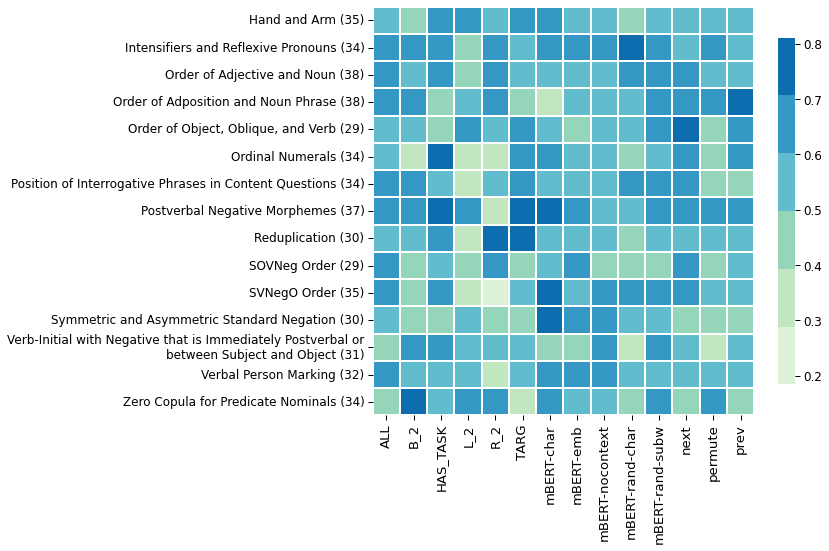

In [235]:
features = set(l[l['notnull']>=20].groupby('feature').score.mean().sort_values(ascending=False).head(15).index)
#features = {'The Morphological Imperative', 'Imperative-Hortative Systems', 'Overlap between Situational and Epistemic Modal Marking', 'Zero Copula for Predicate Nominals', 'Intensifiers and Reflexive Pronouns', 'Suppletion According to Tense and Aspect', 'Tea', 'Hand and Arm', 'Relationship between the Order of Object and Verb and the Order of Relative Clause and Noun', 'Position of Case Affixes', 'Position of Interrogative Phrases in Content Questions', 'Order of Subject and Verb', 'Order of Adposition and Noun Phrase', 'Expression of Pronominal Subjects', 'Postverbal Negative Morphemes'}
def wrap_text(text, maxline=60):
    lines = []
    this_line = []
    for word in text.split(" "):
        this_line.append(word)
        if sum(len(w) + 1 for w in this_line) - 1 >= maxline:
            lines.append(" ".join(this_line))
            this_line = []
    if this_line:
        lines.append(" ".join(this_line))
    return "\n".join(lines)
        
def plot_wals_pert_heatmap(data, save_fn=None, title=None):
    data = data[data['feature'] != 'Relationship between the Order of Object and Verb and the Order of Relative Clause and Noun']
    notnull = data[['feature', 'notnull']].drop_duplicates().set_index('feature')['notnull']
    table = data.pivot(index='feature', columns='perturbation', values='score')
    ysize = max(len(table), 6)
    max_text_len = data['feature'].str.len().max()
    scale = 'small' if max_text_len >= 85 else 'large'
    with matplotlib.rc_context(rc={'ytick.labelsize': 'large'}):
        fig, ax = plt.subplots(1, figsize=(12, 8))
        sns.heatmap(table, cmap=sns.color_palette("GnBu"), ax=ax, linewidth=.1, square=True, cbar_kws={'shrink': 0.7})
        ticks = []
        for tick in ax.get_yticklabels():
            t = tick.get_text()
            t = "{} ({})".format(t, notnull.loc[t])
            tick.set_text(wrap_text(t))
            ticks.append(tick)
        ax.set_yticklabels(ticks)
        ax.set_ylabel("")
        ax.set_xlabel("")
        plt.subplots_adjust(left=0.5)
        plt.tight_layout()
        if title:
            ax.set_title(title)
        if save_fn:
            fig.savefig(save_fn)
plot_wals_pert_heatmap(l[l.feature.isin(features)], save_fn=f"{figure_dir}/heatmap_wals_logreg_repaired_best.png")
#plot_wals_pert_heatmap(pd.read_csv('temporal.csv'), save_fn=f"{figure_dir}/heatmap_wals_logreg.png")

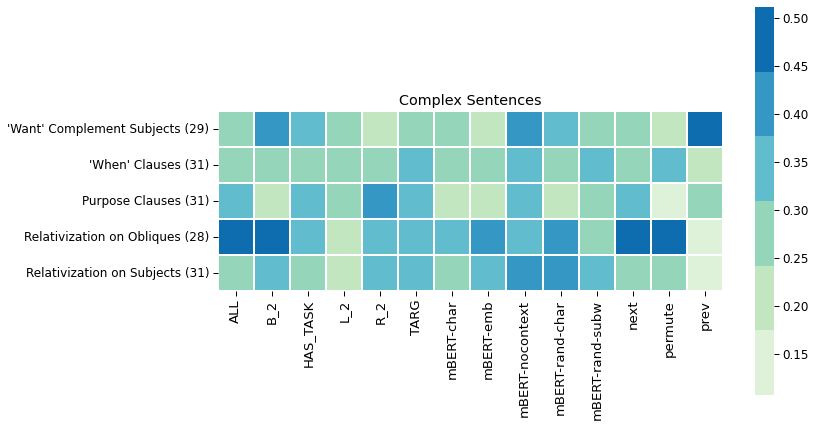

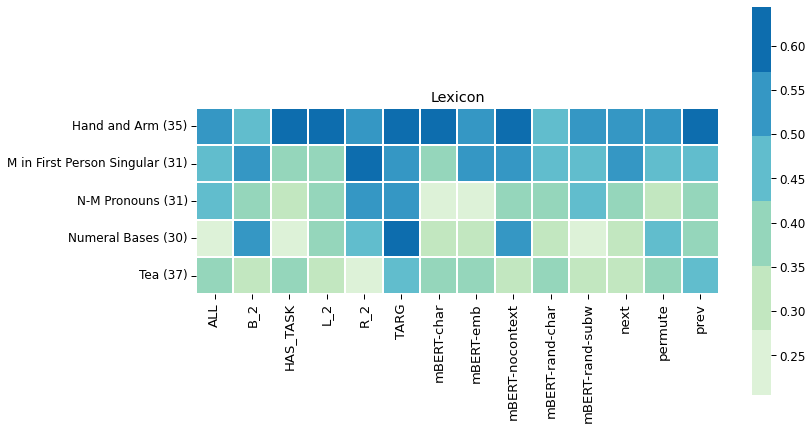

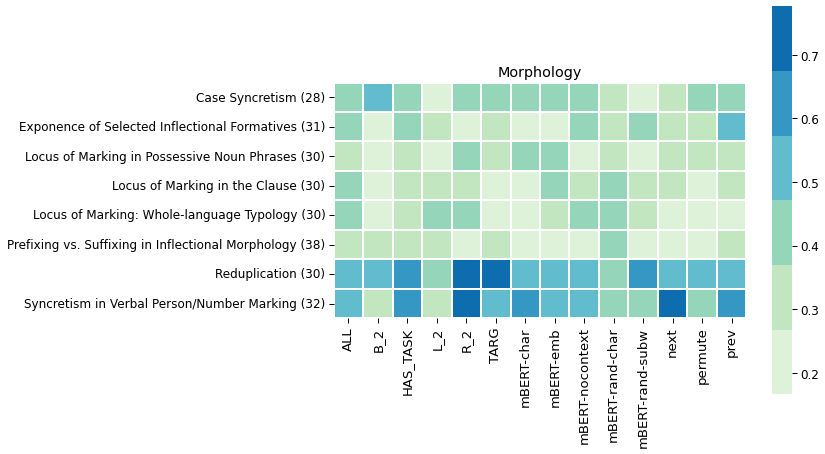

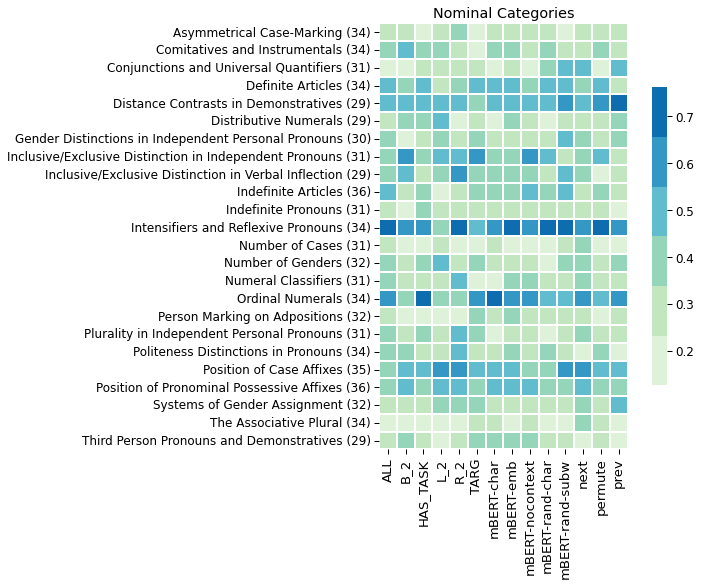

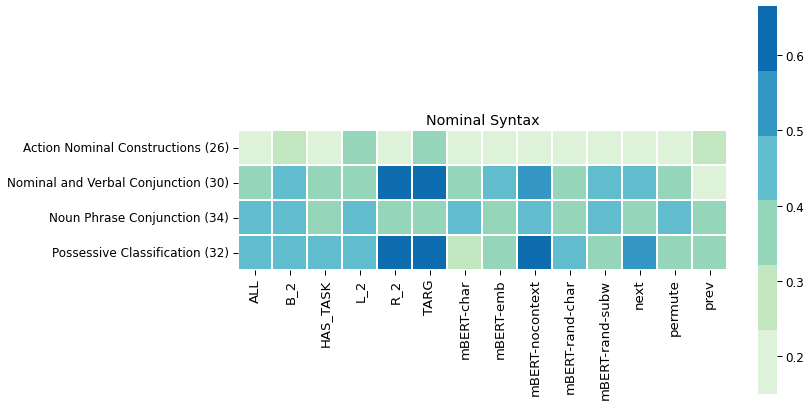

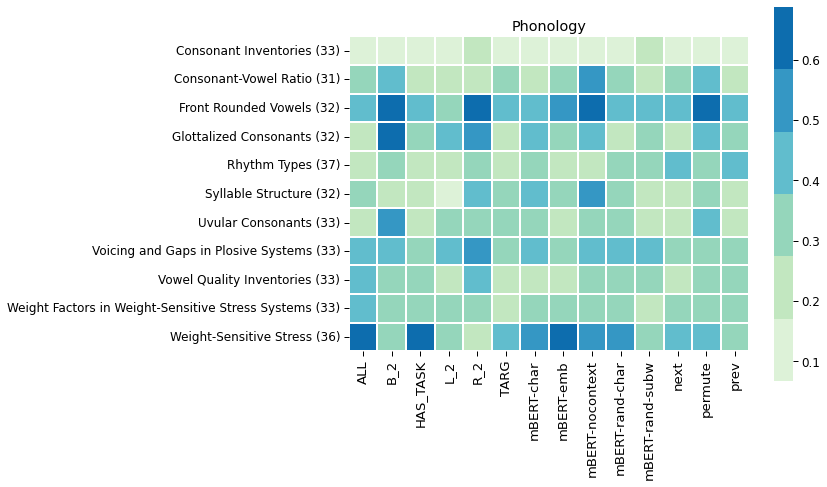

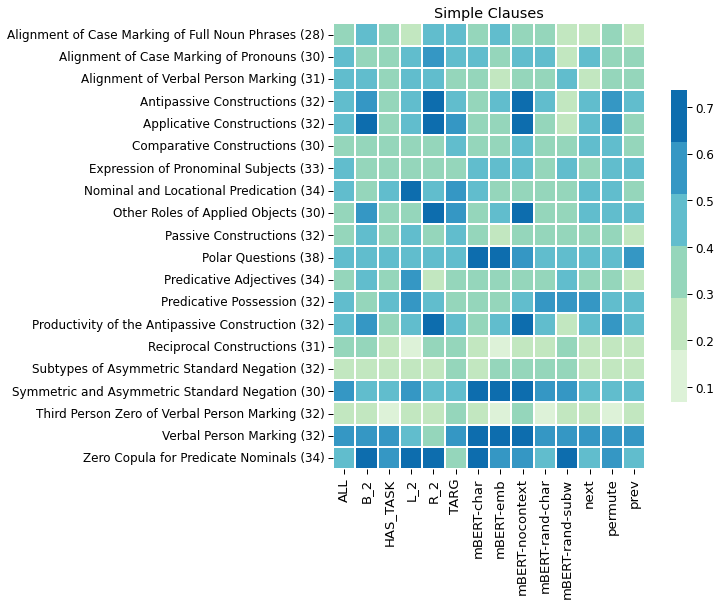

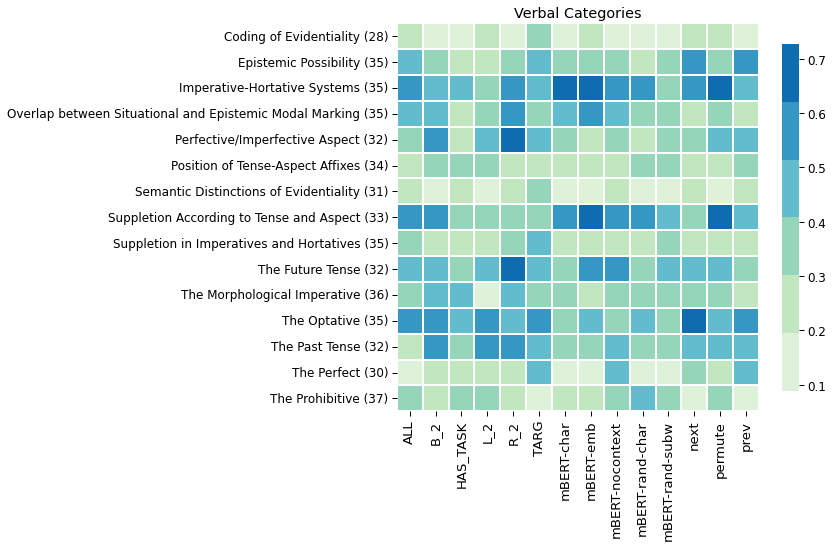

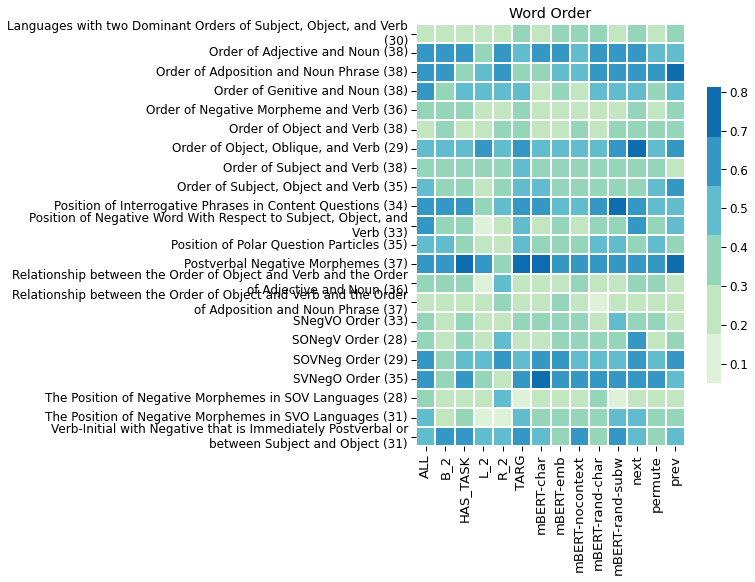

In [228]:
for area, group in l.groupby('Area'):
    if group.feature.nunique() < 2:
        continue
    area_name = area.replace(' ', '_').lower()
    plot_wals_pert_heatmap(group, title=area, save_fn=f"{figure_dir}/heatmap_wals_improved_{area_name}.png")

# KNN

In [225]:
import math

base = pd.read_csv("wals2.csv", index_col=[0])
mapper = {}
for column in base:
    mapper[column]=preprocessing.LabelEncoder()
    mapper[column].fit(base[column].unique())



knn_classifiers = {}
results = pd.DataFrame(columns=['Feature', 'Number of records','Classes', 'Accuracy', 'Error rate'])
for feature in base.columns:
    
    acc = pd.DataFrame(columns=['neighbor', 'acc'] )
    nulldropped = base[base[feature].notnull()]
    for col in nulldropped.columns:
        nulldropped[col] = mapper[col].transform(nulldropped[col])
        
    predictors = nulldropped.drop([feature], axis=1)
    target = nulldropped[feature]
    
    if(len(nulldropped) < 3):
        continue
    X_train, X_test, y_train, y_test = train_test_split(predictors, target, test_size=0.3, random_state=1) # 70%
    
    for neighbor in range(1,40):
    
        if nulldropped[feature].count() < neighbor + 2:
            neighbor = 40
            continue
        
    
        if len(y_test) < neighbor or len(y_train) < neighbor:
            continue
    
        clf = KNeighborsClassifier(n_neighbors=neighbor)
        clf = clf.fit(X_train, y_train)
        y_pred = clf.predict(X_test)
        acc = acc.append({'neighbor': neighbor, 'acc': metrics.accuracy_score(y_test, y_pred)}, ignore_index=True)
        
    neigh = acc[acc['acc'] == acc['acc'].max()]['neighbor'].iloc[0] if len(acc) > 0 else -1
    if neigh == -1:
        continue
    print(f' ----- {neigh} len: {len(acc)} ')
    
    clf = KNeighborsClassifier(n_neighbors=math.ceil(neigh))
    clf = clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)
    knn_classifiers[feature] = clf
    results = results.append({'Feature': feature,'Number of records' : len(target),'Neighbor': neigh,  'Classes' : len(target.unique()), 'Accuracy' : metrics.accuracy_score(y_test, y_pred), 'Error rate' : np.mean(y_pred != y_test)}, ignore_index=True)
# results, forest, (results['Accuracy'].mean()), (results['Error rate'].mean())
knn_results = results

 ----- 13.0 len: 18 
 ----- 3.0 len: 13 
 ----- 1.0 len: 39 
 ----- 8.0 len: 12 
 ----- 3.0 len: 9 
 ----- 1.0 len: 1 
 ----- 1.0 len: 12 
 ----- 4.0 len: 12 
 ----- 11.0 len: 29 
 ----- 4.0 len: 14 
 ----- 3.0 len: 39 
 ----- 5.0 len: 18 
 ----- 4.0 len: 13 
 ----- 9.0 len: 30 
 ----- 22.0 len: 39 
 ----- 6.0 len: 24 
 ----- 4.0 len: 12 
 ----- 6.0 len: 9 
 ----- 33.0 len: 39 
 ----- 11.0 len: 39 
 ----- 1.0 len: 3 
 ----- 2.0 len: 6 
 ----- 35.0 len: 39 
 ----- 1.0 len: 16 
 ----- 4.0 len: 16 
 ----- 3.0 len: 27 
 ----- 1.0 len: 19 
 ----- 1.0 len: 10 
 ----- 6.0 len: 10 
 ----- 4.0 len: 39 
 ----- 2.0 len: 39 
 ----- 12.0 len: 38 
 ----- 1.0 len: 39 
 ----- 3.0 len: 10 
 ----- 5.0 len: 29 
 ----- 3.0 len: 10 
 ----- 12.0 len: 39 
 ----- 1.0 len: 9 
 ----- 24.0 len: 39 
 ----- 23.0 len: 23 
 ----- 1.0 len: 13 
 ----- 1.0 len: 13 
 ----- 7.0 len: 7 
 ----- 3.0 len: 36 
 ----- 5.0 len: 21 
 ----- 1.0 len: 8 
 ----- 4.0 len: 12 
 ----- 2.0 len: 5 
 ----- 1.0 len: 3 
 ----- 1.0 len: 1 
 

In [117]:
results['Accuracy'].mean()
results.to_csv('KNN_means_optimized.csv')

In [132]:
def calculate_and_append_to(feature, acc):
    nulldropped = base[base[feature].notnull()]
    for col in nulldropped.columns:
        nulldropped[col] = mapper[col].transform(nulldropped[col])
        
    predictors = nulldropped.drop([feature], axis=1)
    target = nulldropped[feature]
    
    X_train, X_test, y_train, y_test = train_test_split(predictors, target, test_size=0.3, random_state=1) # 70%
    
    for neighbor in range(1,40):
    
        if nulldropped[feature].count() < neighbor + 2:
            neighbor = 40
        
    
        else:
            if len(y_test) < neighbor or len(y_train) < neighbor:
                neighbor = 40
            else: 
                clf = KNeighborsClassifier(n_neighbors=neighbor)
                clf = clf.fit(X_train, y_train)
                y_pred = clf.predict(X_test)
                acc = acc.append({'Feature': feature, 'neighbor': neighbor, 'acc': metrics.accuracy_score(y_test, y_pred)}, ignore_index=True)
    return acc

In [144]:
acc = pd.DataFrame(columns=['neighbor', 'acc', 'Feature'] )
features = ['Applicative Constructions', 'Tea', 'Other Roles of Applied Objects']
for feature in features:
    acc = calculate_and_append_to(feature, acc)

acc
acc.to_csv('example_oooav.csv', index=False)

In [87]:
all_results

,neighbors,mean,error
0,1.0,0.277778,0.722222
1,2.0,0.333333,0.666667
2,3.0,0.444444,0.555556
3,4.0,0.444444,0.555556
4,5.0,0.500000,0.500000
5,6.0,0.444444,0.555556
6,7.0,0.500000,0.500000
7,8.0,0.500000,0.500000
8,9.0,0.500000,0.500000
9,10.0,0.444444,0.555556
